![STREAMLINE](https://github.com/UrbsLab/STREAMLINE/blob/main/docs/source/pictures/STREAMLINE_Logo_Full.png?raw=true)

# STREAMLINE Google Colab Notebook

STREAMLINE is an end-to-end automated machine learning workflow that helps users run, interpret, and apply a rigorous tabular-data analysis without hand-building every preprocessing, modeling, evaluation, and reporting step.

This notebook runs the full pipeline on one of the included UCI demos or on uploaded custom data. It is intentionally explanation-heavy: the top half is the normal editing surface for users, and the phase cells below show exactly how the notebook maps those settings into STREAMLINE runners.

Included demos:

- `demo_binary`: HCC Survival binary classification
- `demo_multiclass`: Student Dropout and Academic Success multiclass classification
- `demo_regression`: Auto MPG regression

Custom modes:

- `custom_classification`
- `custom_regression`

What to expect when running a demo as-is:

- STREAMLINE will clone the latest selected branch, install dependencies, and run phases 1-11.
- The demo configuration uses 3 CV folds and a compact model list so the notebook finishes in a reasonable Colab session.
- Normal demo data folders contain deterministic 80% training splits; matching replication folders contain held-out 20% replication splits.
- At the end, the notebook prints report locations and can download the PDF report(s) and zipped experiment folder.


## Run Instructions

### Demo Run

1. Leave `RUN_MODE` set to one of the `demo_*` values.
2. Choose **Runtime > Run all**.
3. When the run finishes, download the PDF reports and zipped experiment folder from the output cells at the bottom.

You can optionally change non-dataset parameters below, such as the number of CV folds, which phases run, or which modeling algorithms are used.

### Custom Dataset Run: Prompt/Upload Mode

1. Set `RUN_MODE` to `custom_classification` or `custom_regression`.
2. Leave `USE_DATA_PROMPT = True`.
3. Choose **Runtime > Run all**.
4. When prompted, upload one or more target datasets and optional replication datasets.

The prompt flow asks for the essential dataset labels that STREAMLINE needs: outcome/class column, optional instance ID, optional match/group column, and classification type when relevant.

### Custom Dataset Run: Manual Path Mode

1. Set `RUN_MODE` to `custom_classification` or `custom_regression`.
2. Set `USE_DATA_PROMPT = False`.
3. Update the `CUSTOM_*` path and label parameters below.
4. Run all cells.

The notebook defaults are tuned for demo/tutorial runtime in Colab. For fuller research runs, increase `P6_N_TRIALS` and `P6_TIMEOUT` or use a config/CLI run outside Colab.


--------------
## Essential Run Parameters

Most users only need to edit this section and the custom-data section when running non-demo data.

`RUN_MODE`, `OUTPUT_PATH`, and `EXPERIMENT_NAME` decide what is analyzed and where outputs are written. Additional phase parameters below can be changed to alter preprocessing, feature engineering, modeling, and reporting behavior.


In [ ]:
# [run] section: choose which built-in demo or custom workflow to run.
RUN_MODE = "demo_multiclass"
# Supported values:
# - demo_binary
# - demo_multiclass
# - demo_regression
# - custom_classification
# - custom_regression
# Backward-compatible alias: demo_classification -> demo_multiclass

# Colab-only helper for custom modes. Demo modes ignore this.
# True: upload files and answer prompts during Run all.
# False: use the manual CUSTOM_* paths below.
USE_DATA_PROMPT = True

# [run] output_path / experiment_name
OUTPUT_PATH = "/content/streamline_output"
EXPERIMENT_NAME = "ColabRun"


## Custom Data Paths

Used only when `RUN_MODE` is `custom_classification` or `custom_regression` and `USE_DATA_PROMPT = False`.

Target data folders may contain one or more `.csv`, `.tsv`, or `.txt` datasets. All datasets in the same run should use the same outcome, instance, and match column names. Replication data is optional, but when supplied it should have the same feature schema expected by the trained models.

- `CUSTOM_DATA_PATH`: folder containing target datasets
- `CUSTOM_REPLICATION_PATH`: folder containing optional replication datasets
- `CUSTOM_DATASET_FOR_REP`: one target dataset file used to align replication evaluation
- `CUSTOM_CATEGORICAL_FEATURES` / `CUSTOM_QUANTITATIVE_FEATURES`: optional feature-list files or Python lists

If categorical/quantitative feature lists are left as `None`, STREAMLINE uses `P1_CATEGORICAL_CUTOFF` and binary-feature detection to infer feature types.


In [ ]:
CUSTOM_DATA_PATH = "/content/my_target_data"
CUSTOM_REPLICATION_PATH = "/content/my_replication_data"
CUSTOM_DATASET_FOR_REP = "/content/my_target_data/my_train_dataset.csv"
CUSTOM_CATEGORICAL_FEATURES = None
CUSTOM_QUANTITATIVE_FEATURES = None


## Custom Labels and Task Controls

Used only for custom modes.

- `CUSTOM_OUTCOME_LABEL`: target/outcome column in your data
- `CUSTOM_INSTANCE_LABEL`: optional unique row/sample id column; use `None` if absent
- `CUSTOM_MATCH_LABEL`: optional match/group column for grouped CV or aligned replication; use `None` if absent
- `CUSTOM_CLASSIFICATION_TYPE`: `Binary` or `Multiclass`
- model strings use STREAMLINE model ids such as `NB,LR,DT,RF,CGB,ExSTraCS`

For regression runs, `CUSTOM_OUTCOME_LABEL` should identify a continuous outcome and `CUSTOM_REGRESSION_MODELS` controls the Phase 6 model list.


In [ ]:
CUSTOM_OUTCOME_LABEL = "Class"
CUSTOM_INSTANCE_LABEL = None
CUSTOM_MATCH_LABEL = None

CUSTOM_CLASSIFICATION_TYPE = "Binary"   # Binary or Multiclass
CUSTOM_CLASSIFICATION_MODELS = "NB,LR,DT"
CUSTOM_REGRESSION_MODELS = "LR,RF"


--------------
## Global Execution Parameters

These settings affect the full pipeline.

- `RUN_CLUSTER`: `Serial` is recommended in Colab. `Parallel` uses local joblib. `Local` uses local Dask.
- `N_SPLITS`: number of CV train/test partitions and therefore the number of model evaluations per algorithm.
- `RANDOM_STATE`: reproducibility control used across phases when supported.
- `P1_FORCE`: rebuilds the experiment folder when Phase 1 is rerun.

For Colab, prefer `Serial` unless you are deliberately testing local parallel behavior. For small notebook demos, parallel startup overhead can be larger than the saved time.


In [ ]:
# [run] execution parameters
RUN_CLUSTER = "Serial"  # Serial, Parallel (joblib), Local (Dask), BashSLURM, BashLSF, or a named Dask cluster
QUEUE = "defq"
RESERVED_MEMORY = 4
N_SPLITS = 3
RANDOM_STATE = 42

# Kept as aliases because runner cells use PHASE_* names.
PHASE_QUEUE = QUEUE
PHASE_RESERVED_MEMORY_GB = RESERVED_MEMORY


## Phase Toggles

Toggle any phase on/off during iterative debugging. For a complete fresh run, leave everything `True`.

- `p1`-`p11` correspond to the STREAMLINE phases.
- `p11` controls the standard testing-data report.
- `p11_replication` controls the replication report.

If you skip an upstream phase, make sure its expected output already exists from a previous run.


In [ ]:
# [phases] section
PHASE_ORDER = "p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,p11"
RUN_PHASES = {
    "p1": True,
    "p2": True,
    "p3": True,
    "p4": True,
    "p5": True,
    "p6": True,
    "p7": True,
    "p8": True,
    "p9": True,
    "p10": True,
    "p11": True,
    "p11_replication": True,
}

# For regression, set True only if you explicitly want to run ensembles.
ALLOW_P7_FOR_REGRESSION = False


--------------
### Phase 1 - Data Exploration and Processing Parameters

Phase 1 performs initial EDA, cleaning, feature engineering, feature-type handling, and CV partitioning.

Typical outputs include data-count summaries, missingness summaries, class/outcome summaries, correlation plots, univariate analysis, and saved CV train/test files. Feature type settings matter downstream because categorical features may be one-hot encoded, passed to native categorical models, or passed to ReBATE methods as categorical indexes.

When `P1_CATEGORICAL_FEATURES` and `P1_QUANTITATIVE_FEATURES` are `None`, STREAMLINE infers feature type using `P1_CATEGORICAL_CUTOFF`: non-binary features with more unique values than the cutoff are treated as quantitative, while binary features are treated as categorical by default.


In [ ]:
# [p1] Data Exploration and Processing parameters
P1_EXCLUDE_EDA_OUTPUT = None
P1_PARTITION_METHOD = "Stratified"
P1_IGNORE_FEATURES = None
P1_CATEGORICAL_FEATURES = None
P1_QUANTITATIVE_FEATURES = None
P1_TOP_FEATURES = 20
P1_CATEGORICAL_CUTOFF = 10
P1_SIG_CUTOFF = 0.05
P1_FEATUREENG_MISSINGNESS = 0.5
P1_CLEANING_MISSINGNESS = 0.5
P1_CORRELATION_REMOVAL_THRESHOLD = 1.0
P1_SHOW_PLOTS = True
P1_ONE_HOT_ENCODING = True
P1_CV_PROVIDED = False
P1_CV_INPUT_ROOT = None
P1_ENABLE_PLOTS = True
P1_PLOT_MISSINGNESS = True
P1_PLOT_CLASS_COUNTS = True
P1_PLOT_CORRELATION = True
P1_CORRELATION_PLOT_MAX_FEATURES = 200
P1_PLOT_UNIVARIATE = True
P1_UNIVARIATE_TOP_K = 20
P1_PLOT_ANOMALIES = True
P1_FORCE = True


### Phase 2 - Impute, Scale, and Balance Parameters

Phase 2 transforms each CV split after Phase 1. Missing-value imputation and scaling are fit on training folds and applied to the corresponding test folds.

Optional SMOTE/SMOTENC oversampling is applied only to training folds and only for classification outcomes. With `P2_SMOTE_METHOD = "auto"`, STREAMLINE uses SMOTENC when categorical features are present and standard SMOTE otherwise.


In [ ]:
# [p2] Impute, Scale, and Balance parameters
P2_SCALE_DATA = True
P2_IMPUTE_DATA = True
P2_MULTI_IMPUTE = False
P2_OVERWRITE_CV = True
P2_IMPUTER_ID = None
P2_IMPUTER_PARAMS = {}
P2_SCALER_ID = None
P2_SCALER_PARAMS = {}
P2_SMOTE = False
P2_SMOTE_METHOD = "auto"
P2_SMOTE_SAMPLING_STRATEGY = "auto"
P2_SMOTE_K_NEIGHBORS = 5


### Phase 3 - Feature Learning Parameters

Phase 3 adds learned representations such as PCA features. Learned transformations are fit within each training fold and applied to the matching test fold, preserving CV separation.

`P3_KEEP_ORIGINAL_FEATURES=True` appends learned features to the original feature set. Set it to `False` when you want downstream phases to use only the learned representation.


In [ ]:
# [p3] Feature Learning parameters
P3_LEARNER_ID = "pca"
P3_LEARNER_PARAMS = {}
P3_FEATURE_NAMESPACE = "FL_PCA"
P3_KEEP_ORIGINAL_FEATURES = True
P3_OVERWRITE_CV = True


### Phase 4 - Feature Importance Parameters

Phase 4 estimates filter-based feature importance within each CV split. These scores are later used for feature selection and reporting.

The demo/config default uses Mutual Information and MultiSWRFDB. Set `P4_MODELS = None` to run every registered feature-importance method. `P4_INSTANCE_SUBSET` limits expensive ReBATE-style methods; leave it as `None` to use all training instances.


In [ ]:
# [p4] Feature Importance parameters
P4_MODELS = "mutualinformation,multiswrfdb"
P4_MODELS_PARAMS = {"mutualinformation": {"outcome_type": "auto"}, "multiswrfdb": {"n_jobs": 1}}
P4_TOP_K = None
P4_THRESHOLD = None
P4_KEEP_ORIGINAL_FEATURES = False
P4_OVERWRITE_CV = True
P4_INSTANCE_SUBSET = 1000


### Phase 5 - Feature Selection Parameters

Phase 5 performs collective feature selection before modeling. When `P5_FILTER_POOR_FEATURES = False`, all features continue to modeling.

When filtering is enabled, STREAMLINE removes features that have no evidence of importance across the active FI methods. If `P5_MAX_FEATURES_TO_KEEP` is an integer, STREAMLINE keeps a capped set of top-ranked features from the available FI outputs. `P5_ALGORITHMS = "auto"` is recommended because it discovers whichever FI methods were actually run.


In [ ]:
# [p5] Feature Selection parameters
P5_ALGORITHMS = "auto"
P5_N_SPLITS = N_SPLITS
P5_MAX_FEATURES_TO_KEEP = 2000
P5_FILTER_POOR_FEATURES = True
P5_OVERWRITE_CV = False
P5_SELECTOR_ID = "default"
P5_SELECTOR_PARAMS = {}
P5_EXPORT_SCORES = True
P5_TOP_FEATURES = 20
P5_SHOW_PLOTS = True
P5_STRICT_DISCOVERY = False


### Phase 6 - Modeling Parameters

Phase 6 trains and evaluates the requested algorithms across CV folds.

- `P6_N_TRIALS` and `P6_TIMEOUT` control Optuna hyperparameter search. The notebook demo default is `50` trials and `300` seconds so Colab runs stay practical; use `200` and `900` for fuller config-style runs.
- `P6_TRAINING_SUBSAMPLE` can limit expensive models on large datasets.
- `P6_UNIFORM_FI=True` forces permutation feature importance for all models and can be slow.
- `P6_SKIP_COMPLETED_MODELS=True` runs only failed or missing model/CV jobs and does not overwrite completed model artifacts.
- `P6_CALIBRATE=True` applies probability calibration for classification models.

The demo model lists are intentionally small (`NB,LR,DT` for classification and `LR,RF` for regression). Add more models when runtime is acceptable. If Phase 1 one-hot encoding is disabled, requested models should be native-categorical compatible.


In [ ]:
# [p6] Modeling parameters
# None values below use the selected RUN_MODE defaults from CFG.
P6_OUTCOME_TYPE = None
P6_MODEL_TYPE = None
P6_MODELS = None
P6_MODEL_PARAMS_JSON = None
P6_CALIBRATE = False
P6_CALIBRATE_METHOD = "sigmoid"
P6_CALIBRATE_CV = 5
P6_SCORING_METRIC = None
P6_METRIC_DIRECTION = "maximize"
P6_N_TRIALS = 50
P6_TIMEOUT = 300
P6_TRAINING_SUBSAMPLE = 0
P6_UNIFORM_FI = False
P6_SAVE_PLOT = False
P6_SKIP_COMPLETED_MODELS = False
P6_BYPASS_ONE_HOT_FOR_NATIVE_MODELS = False
P6_NATIVE_CATEGORICAL_MODELS = "CGB,ExSTraCS"


### Phase 7 - Ensemble Parameters

Phase 7 builds ensemble classifiers from Phase 6 base-model predictions. Hard voting, soft voting, and stacking are available for classification workflows.

Regression ensemble support is intentionally guarded in this notebook by `ALLOW_P7_FOR_REGRESSION`; leave that off unless regression ensemble support is explicitly implemented for the run you are testing.


In [ ]:
# [p7] Ensemble parameters
P7_ENABLED = True
P7_ENSEMBLES = "hard_voting,soft_voting,stack_lr"
P7_BASE_MODELS = None  # None uses the selected RUN_MODE Phase 6 model list.
P7_META_TRAIN_SOURCE = "train"
P7_CALIBRATE = 0
P7_CALIBRATE_METHOD = "sigmoid"
P7_CALIBRATE_CV = 5


### Phase 8 - Summary Statistics Parameters

Phase 8 summarizes testing-fold model performance and creates post-analysis figures. Outputs may include ROC/PRC plots for classification, regression summaries, metric boxplots, model feature-importance plots, and composite feature-importance summaries.

`P8_MULTICLASS_AVERAGE` controls multiclass ROC/PR aggregation where applicable.


In [ ]:
# [p8] Summary Statistics parameters
# None metric values use the selected RUN_MODE defaults from CFG.
P8_SCORING_METRIC = None
P8_METRIC_WEIGHT = None
P8_TOP_FEATURES = 40
P8_SIG_CUTOFF = 0.05
P8_SCALE_DATA = True
P8_EXCLUDE_PLOTS = None
P8_SHOW_PLOTS = True
P8_INCLUDE_ENSEMBLES = None  # None follows whether Phase 7 actually ran.
P8_MULTICLASS_AVERAGE = "micro"


### Phase 9 - Dataset Comparison Parameters

Phase 9 is useful only when an experiment includes more than one target dataset. It compares model performance distributions across datasets and writes comparison outputs under `DatasetComparisons/`.


In [ ]:
# [p9] Dataset Comparison parameters
P9_SIG_CUTOFF = 0.05
P9_SHOW_PLOTS = True


### Phase 10 - Replication Parameters

Phase 10 evaluates previously trained models on external or held-out replication datasets. This gives a uniform evaluation on the same new data and can be more useful for selecting a final model than comparing only CV test folds.

The included UCI demos use deterministic held-out 20% replication splits rather than independent external datasets.


In [ ]:
# [p10] Replication parameters
# None path/label values use the selected RUN_MODE defaults from CFG/metadata.
P10_REP_DATA_PATH = None
P10_DATASET_FOR_REP = None
P10_MATCH_LABEL = None
P10_OUTCOME_LABEL = None
P10_INSTANCE_LABEL = None
P10_EXCLUDE_PLOTS = None
P10_SHOW_PLOTS = True


### Phase 11 - Reporting Parameters

Phase 11 generates PDF report artifacts for the standard testing-data report and, when available, the replication report.

`P11_REUSE_EXISTING_FIGURES=True` speeds up report regeneration when plots have already been made. Disable it when you want plots regenerated from scratch.


In [ ]:
# [p11] Reporting parameters
P11_REPORT_MODES = "standard,replication"
P11_REPORTING_DIR = None
P11_REPORT_MODE_STANDARD = "standard"
P11_REPORT_MODE_REPLICATION = "replication"
P11_OUTCOME_LABEL = None
P11_OUTCOME_TYPE = None
P11_INSTANCE_LABEL = None
P11_MAKE_PDF = True
P11_ENABLE_PLOTS = True
P11_REUSE_EXISTING_FIGURES = True


--------------
## Setup: Install and Import STREAMLINE

This section shallow-clones the selected STREAMLINE branch, installs dependencies from `requirements.txt`, and imports the STREAMLINE phase runners.

Most users should not edit below this point unless they are debugging the notebook itself.


In [ ]:
import os
import sys
import shutil
import logging
import subprocess
from pathlib import Path

REPO_URL = "https://github.com/UrbsLab/STREAMLINE.git"
REPO_BRANCH = "main"
REPO_DIR = Path("/content/STREAMLINE")

if REPO_DIR.exists() and (REPO_DIR / ".git").is_dir():
    subprocess.run(["git", "-C", str(REPO_DIR), "fetch", "--depth", "1", "origin", REPO_BRANCH], check=True)
    subprocess.run(["git", "-C", str(REPO_DIR), "checkout", "FETCH_HEAD"], check=True)
elif REPO_DIR.exists():
    shutil.rmtree(REPO_DIR)
    subprocess.run(["git", "clone", "--depth", "1", "--single-branch", "--branch", REPO_BRANCH, REPO_URL, str(REPO_DIR)], check=True)
else:
    subprocess.run(["git", "clone", "--depth", "1", "--single-branch", "--branch", REPO_BRANCH, REPO_URL, str(REPO_DIR)], check=True)

print(f"STREAMLINE repo ready at {REPO_DIR}")

STREAMLINE repo ready at /content/STREAMLINE


In [ ]:
# Queue/memory are configured in the [run] parameter cell above.
PHASE_QUEUE = QUEUE
PHASE_RESERVED_MEMORY_GB = RESERVED_MEMORY


In [ ]:
if str(REPO_DIR) not in sys.path:
    sys.path.insert(0, str(REPO_DIR))


In [ ]:
subprocess.run([sys.executable, "-m", "pip", "install", "-r", str(REPO_DIR / "requirements.txt")], check=True)

import importlib.metadata as importlib_metadata

print("Installed dependency versions:")
for package_name in ["numpy", "pandas", "skrebate", "kaleido"]:
    try:
        version = importlib_metadata.version(package_name)
    except importlib_metadata.PackageNotFoundError:
        version = "not installed"
    print(f"{package_name}: {version}")


Installed dependency versions:
numpy: 2.0.2
pandas: 2.2.2
skrebate: 0.8.2
kaleido: 1.3.0


In [ ]:
# Show full phase logs in notebook output (INFO/WARNING/ERROR).
logging.basicConfig(
    level=logging.INFO,
    format="%(levelname)s: %(message)s",
    force=True,
)
logging.getLogger().setLevel(logging.INFO)
print("INFO: Notebook logging configured at INFO level (phases 1-10).")

INFO: Notebook logging configured at INFO level (phases 1-10).


In [ ]:
from streamline.p1_data_process.p1_runner import P1Runner
from streamline.p2_impute_scale.p2_runner import P2Runner
from streamline.p3_feature_learning.p3_runner import P3Runner
from streamline.p4_feature_importance.p4_runner import P4Runner
from streamline.p5_feature_selection.p5_runner import P5Runner
from streamline.p6_modeling.p6_runner import P6Runner
from streamline.p7_ensembles.p7_runner import P7Runner
from streamline.p8_summary_statistics.p8_runner import P8Runner
from streamline.p9_compare_datasets.p9_runner import P9Runner
from streamline.p10_replication.p10_runner import P10Runner
from streamline.p11_reporting.p11_runner import P11Runner

print(f"REPO_DIR: {REPO_DIR}")

INFO: NumExpr defaulting to 2 threads.


REPO_DIR: /content/STREAMLINE


In [ ]:
%matplotlib inline

## Optional Colab Custom Upload Prompts

This helper is used only for custom modes when `USE_DATA_PROMPT = True`. It creates clean temporary folders under `/content`, uploads files, and fills the same `CUSTOM_*` variables used by manual path mode.

The upload prompt intentionally asks for only essential dataset information. More detailed behavior, such as feature-type lists, modeling algorithms, SMOTE, and plotting options, remains controlled by the parameter cells above.


In [ ]:
def collect_colab_custom_inputs(run_mode: str):
    from google.colab import files
    from pathlib import Path
    import os
    import shutil

    def clean_folder(path):
        path = Path(path)
        if path.exists():
            shutil.rmtree(path)
        path.mkdir(parents=True, exist_ok=True)
        return path

    def optional_text(prompt):
        value = input(prompt).strip()
        return None if value.lower() in {"", "none", "na", "n/a"} else value

    def yes_no(prompt):
        value = input(prompt).strip().lower()
        return value in {"1", "true", "t", "yes", "y"}

    mode = run_mode.strip().lower()
    target_dir = clean_folder("/content/UserData")
    rep_dir = Path("/content/UserReplicationData")

    experiment_name = input("Experiment name for this STREAMLINE run: ").strip() or EXPERIMENT_NAME

    print("Upload one or more target dataset files (.csv, .tsv, or .txt).")
    old_cwd = os.getcwd()
    os.chdir(target_dir)
    uploaded_target = files.upload()
    os.chdir(old_cwd)
    if not uploaded_target:
        raise ValueError("No target dataset files were uploaded.")

    first_target = next(iter(uploaded_target.keys()))
    outcome_label = input("Outcome/class column label: ").strip()
    if not outcome_label:
        raise ValueError("Outcome/class column label is required.")
    instance_label = optional_text("Instance ID column label, or None: ")
    match_label = optional_text("Match/group column label, or None: ")

    classification_type = CUSTOM_CLASSIFICATION_TYPE
    if mode == "custom_classification":
        classification_type = input("Classification type (Binary or Multiclass): ").strip() or CUSTOM_CLASSIFICATION_TYPE
        if classification_type not in {"Binary", "Multiclass"}:
            raise ValueError("Classification type must be Binary or Multiclass.")

    replication_available = yes_no("Replication data available? Enter yes or no: ")
    if replication_available:
        rep_dir = clean_folder(rep_dir)
        print("Upload one or more replication dataset files.")
        os.chdir(rep_dir)
        uploaded_rep = files.upload()
        os.chdir(old_cwd)
        if not uploaded_rep:
            raise ValueError("Replication was requested but no replication files were uploaded.")
        default_dataset_for_rep = str(target_dir / first_target)
        dataset_for_rep = input(
            f"Dataset-for-rep path [{default_dataset_for_rep}]: "
        ).strip() or default_dataset_for_rep
    else:
        dataset_for_rep = str(target_dir / first_target)
        RUN_PHASES["p10"] = False
        RUN_PHASES["p11_replication"] = False

    return {
        "EXPERIMENT_NAME": experiment_name,
        "CUSTOM_DATA_PATH": str(target_dir),
        "CUSTOM_REPLICATION_PATH": str(rep_dir),
        "CUSTOM_DATASET_FOR_REP": dataset_for_rep,
        "CUSTOM_OUTCOME_LABEL": outcome_label,
        "CUSTOM_INSTANCE_LABEL": instance_label,
        "CUSTOM_MATCH_LABEL": match_label,
        "CUSTOM_CLASSIFICATION_TYPE": classification_type,
    }


## Build Mode-Specific Configuration

This cell converts `RUN_MODE` into a concrete configuration dictionary (`CFG`) including paths, labels, task type, feature-list defaults, model defaults, and metric defaults.

For demo modes, these values point to the UCI demo folders shipped with STREAMLINE. For custom modes, they come from either the upload prompts or the manual `CUSTOM_*` cells.


In [ ]:
from pprint import pprint


def uci_feature_path(repo_dir: Path, filename: str) -> str:
    return str(repo_dir / "data" / "UCIFeatureTypes" / filename)


def mode_defaults(run_mode: str, repo_dir: Path):
    mode = run_mode.strip().lower()
    if mode == "demo_classification":
        mode = "demo_multiclass"

    if mode == "demo_binary":
        return {
            "task_family": "classification",
            "data_path": str(repo_dir / "data" / "UCIBinaryClassification"),
            "rep_data_path": str(repo_dir / "data" / "UCIRepBinaryClassification"),
            "dataset_for_rep": str(repo_dir / "data" / "UCIBinaryClassification" / "hcc_survival.csv"),
            "outcome_label": "Class",
            "instance_label": "InstanceID",
            "match_label": None,
            "outcome_type": "Binary",
            "categorical_features": uci_feature_path(repo_dir, "hcc_survival_categorical_features.csv"),
            "quantitative_features": uci_feature_path(repo_dir, "hcc_survival_quantitative_features.csv"),
            "p6_models": "NB,LR,DT",
            "p6_scoring_metric": "balanced_accuracy",
            "p6_metric_direction": "maximize",
            "p8_scoring_metric": "balanced_accuracy",
            "p8_metric_weight": "balanced_accuracy",
        }

    if mode == "demo_multiclass":
        return {
            "task_family": "classification",
            "data_path": str(repo_dir / "data" / "UCIMulticlassClassification"),
            "rep_data_path": str(repo_dir / "data" / "UCIRepMulticlassClassification"),
            "dataset_for_rep": str(repo_dir / "data" / "UCIMulticlassClassification" / "student_dropout_academic_success.csv"),
            "outcome_label": "Class",
            "instance_label": "InstanceID",
            "match_label": None,
            "outcome_type": "Multiclass",
            "categorical_features": uci_feature_path(repo_dir, "student_dropout_categorical_features.csv"),
            "quantitative_features": uci_feature_path(repo_dir, "student_dropout_quantitative_features.csv"),
            "p6_models": "NB,LR,DT",
            "p6_scoring_metric": "balanced_accuracy",
            "p6_metric_direction": "maximize",
            "p8_scoring_metric": "balanced_accuracy",
            "p8_metric_weight": "balanced_accuracy",
        }

    if mode == "demo_regression":
        return {
            "task_family": "regression",
            "data_path": str(repo_dir / "data" / "UCIRegression"),
            "rep_data_path": str(repo_dir / "data" / "UCIRepRegression"),
            "dataset_for_rep": str(repo_dir / "data" / "UCIRegression" / "auto_mpg.csv"),
            "outcome_label": "MPG",
            "instance_label": "InstanceID",
            "match_label": None,
            "outcome_type": "Continuous",
            "categorical_features": uci_feature_path(repo_dir, "auto_mpg_categorical_features.csv"),
            "quantitative_features": uci_feature_path(repo_dir, "auto_mpg_quantitative_features.csv"),
            "p6_models": "LR,RF",
            "p6_scoring_metric": "neg_mean_squared_error",
            "p6_metric_direction": "maximize",
            "p8_scoring_metric": "mean_squared_error",
            "p8_metric_weight": "mean_squared_error",
        }

    if mode == "custom_classification":
        ctype = CUSTOM_CLASSIFICATION_TYPE.strip()
        if ctype not in {"Binary", "Multiclass"}:
            raise ValueError("CUSTOM_CLASSIFICATION_TYPE must be Binary or Multiclass")
        return {
            "task_family": "classification",
            "data_path": CUSTOM_DATA_PATH,
            "rep_data_path": CUSTOM_REPLICATION_PATH,
            "dataset_for_rep": CUSTOM_DATASET_FOR_REP,
            "outcome_label": CUSTOM_OUTCOME_LABEL,
            "instance_label": CUSTOM_INSTANCE_LABEL,
            "match_label": CUSTOM_MATCH_LABEL,
            "outcome_type": ctype,
            "categorical_features": CUSTOM_CATEGORICAL_FEATURES,
            "quantitative_features": CUSTOM_QUANTITATIVE_FEATURES,
            "p6_models": CUSTOM_CLASSIFICATION_MODELS,
            "p6_scoring_metric": "balanced_accuracy",
            "p6_metric_direction": "maximize",
            "p8_scoring_metric": "balanced_accuracy",
            "p8_metric_weight": "balanced_accuracy",
        }

    if mode == "custom_regression":
        return {
            "task_family": "regression",
            "data_path": CUSTOM_DATA_PATH,
            "rep_data_path": CUSTOM_REPLICATION_PATH,
            "dataset_for_rep": CUSTOM_DATASET_FOR_REP,
            "outcome_label": CUSTOM_OUTCOME_LABEL,
            "instance_label": CUSTOM_INSTANCE_LABEL,
            "match_label": CUSTOM_MATCH_LABEL,
            "outcome_type": "Continuous",
            "categorical_features": CUSTOM_CATEGORICAL_FEATURES,
            "quantitative_features": CUSTOM_QUANTITATIVE_FEATURES,
            "p6_models": CUSTOM_REGRESSION_MODELS,
            "p6_scoring_metric": "neg_mean_squared_error",
            "p6_metric_direction": "maximize",
            "p8_scoring_metric": "mean_squared_error",
            "p8_metric_weight": "mean_squared_error",
        }

    raise ValueError(f"Unsupported RUN_MODE: {run_mode}")


if RUN_MODE.strip().lower().startswith("custom") and USE_DATA_PROMPT:
    globals().update(collect_colab_custom_inputs(RUN_MODE))

CFG = mode_defaults(RUN_MODE, REPO_DIR)
CFG["output_path"] = OUTPUT_PATH
CFG["experiment_name"] = EXPERIMENT_NAME

# Explicit Phase 1 feature-list parameters override mode defaults when provided.
if P1_CATEGORICAL_FEATURES is not None:
    CFG["categorical_features"] = P1_CATEGORICAL_FEATURES
if P1_QUANTITATIVE_FEATURES is not None:
    CFG["quantitative_features"] = P1_QUANTITATIVE_FEATURES

if not Path(CFG["data_path"]).exists():
    raise FileNotFoundError(f"Target data path not found: {CFG['data_path']}")

EXP_ROOT = Path(CFG["output_path"]) / CFG["experiment_name"]

print("Resolved config:")
pprint(CFG)


Resolved config:
{'categorical_features': '/content/STREAMLINE/data/UCIFeatureTypes/student_dropout_categorical_features.csv',
 'data_path': '/content/STREAMLINE/data/UCIMulticlassClassification',
 'dataset_for_rep': '/content/STREAMLINE/data/UCIMulticlassClassification/student_dropout_academic_success.csv',
 'experiment_name': 'ColabRun',
 'instance_label': 'InstanceID',
 'match_label': None,
 'outcome_label': 'Class',
 'outcome_type': 'Multiclass',
 'output_path': '/content/streamline_output',
 'p6_metric_direction': 'maximize',
 'p6_models': 'NB,LR,DT',
 'p6_scoring_metric': 'balanced_accuracy',
 'p8_metric_weight': 'balanced_accuracy',
 'p8_scoring_metric': 'balanced_accuracy',
 'quantitative_features': '/content/STREAMLINE/data/UCIFeatureTypes/student_dropout_quantitative_features.csv',
 'rep_data_path': '/content/STREAMLINE/data/UCIRepMulticlassClassification',
 'task_family': 'classification'}


-------------
# STREAMLINE RUN CODE
The cells below run STREAMLINE phase-by-phase.

For full runs, execute in order.
For debugging, toggle phases and rerun only downstream sections.

## Phase 1: Data Exploration and Processing
After this cell runs, each target dataset should have:

- initial EDA data counts and missingness summaries
- notifications for removed features/instances and added engineered features
- processed-data EDA summaries
- class/outcome balance plots when applicable
- feature correlation and univariate analysis outputs
- CV train/test partitions and feature metadata for downstream phases


INFO: Starting Phase 1 - Data Processing


INFO: Validating and Identifying Feature Types...
INFO: Running Initial EDA:
INFO: /content/streamline_output/ColabRun


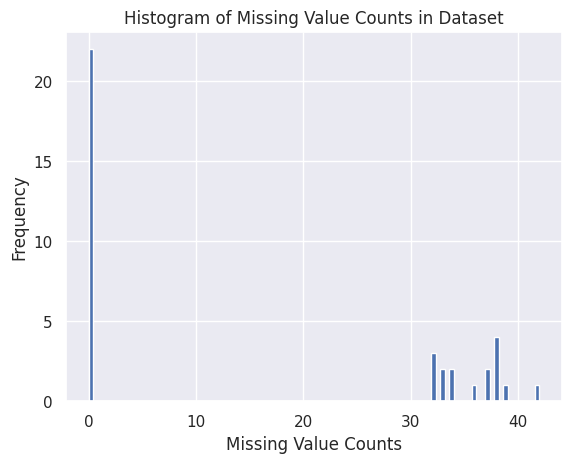

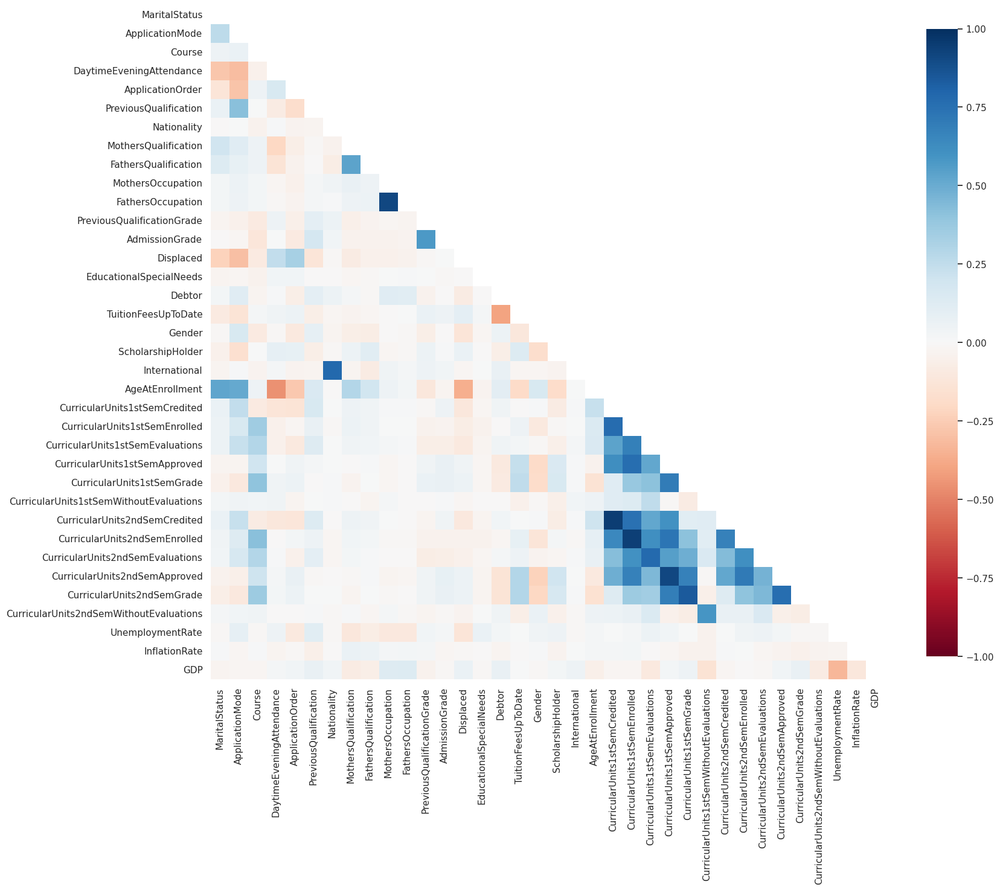

INFO: Running Post-Processing EDA...
INFO: Categorical: ['EducationalSpecialNeeds', 'International', 'Gender', 'TuitionFeesUpToDate', 'DaytimeEveningAttendance', 'ScholarshipHolder', 'Displaced', 'Debtor', 'ApplicationMode_1.0', 'ApplicationMode_2.0', 'ApplicationMode_5.0', 'ApplicationMode_7.0', 'ApplicationMode_10.0', 'ApplicationMode_15.0', 'ApplicationMode_16.0', 'ApplicationMode_17.0', 'ApplicationMode_18.0', 'ApplicationMode_26.0', 'ApplicationMode_27.0', 'ApplicationMode_39.0', 'ApplicationMode_42.0', 'ApplicationMode_43.0', 'ApplicationMode_44.0', 'ApplicationMode_51.0', 'ApplicationMode_53.0', 'ApplicationMode_57.0', 'FathersOccupation_0.0', 'FathersOccupation_1.0', 'FathersOccupation_2.0', 'FathersOccupation_3.0', 'FathersOccupation_4.0', 'FathersOccupation_5.0', 'FathersOccupation_6.0', 'FathersOccupation_7.0', 'FathersOccupation_8.0', 'FathersOccupation_9.0', 'FathersOccupation_10.0', 'FathersOccupation_90.0', 'FathersOccupation_99.0', 'FathersOccupation_101.0', 'FathersOcc

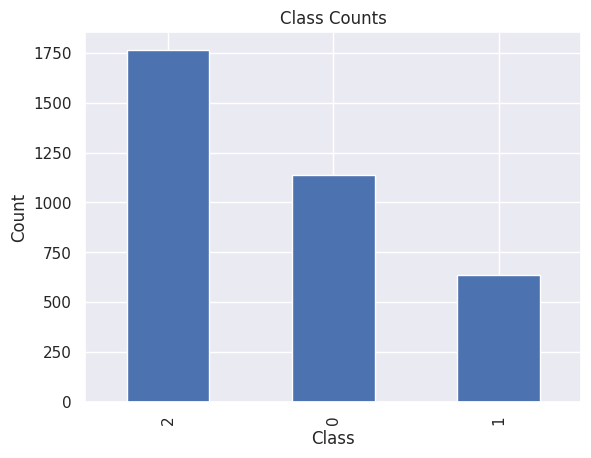

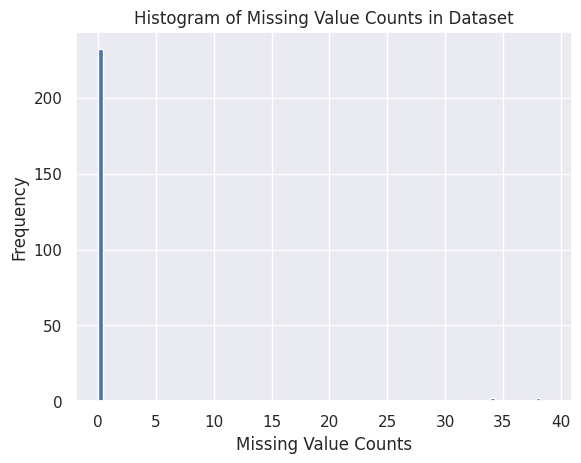

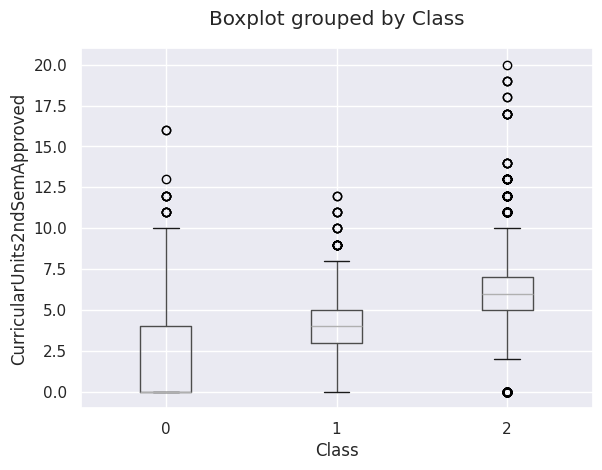

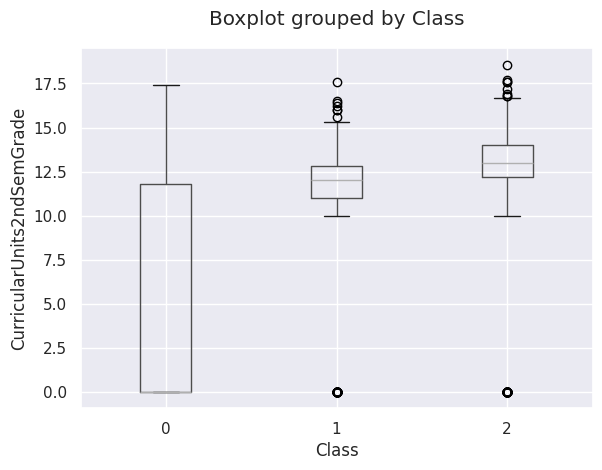

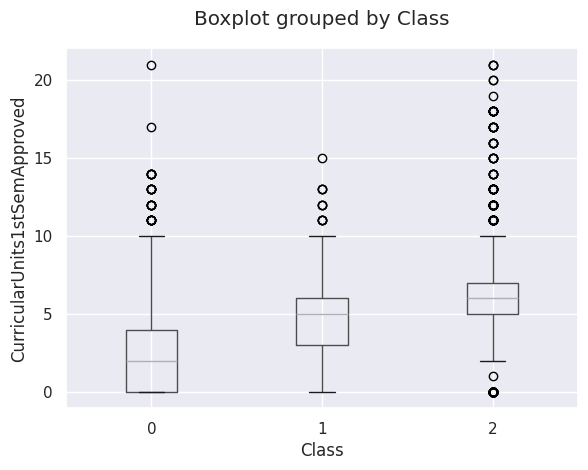

...

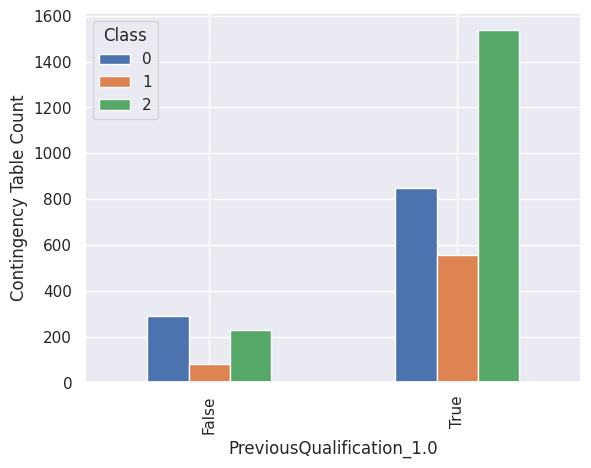

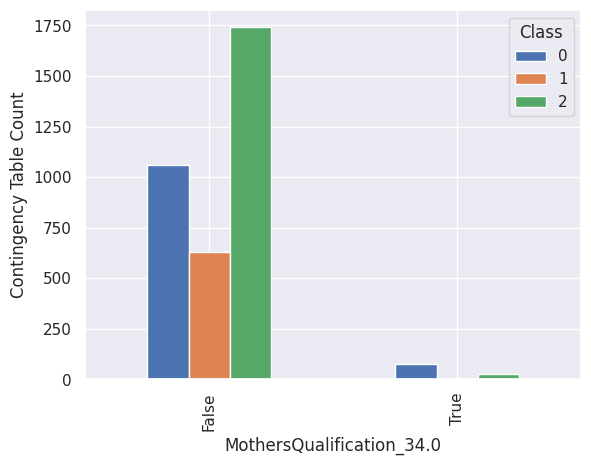

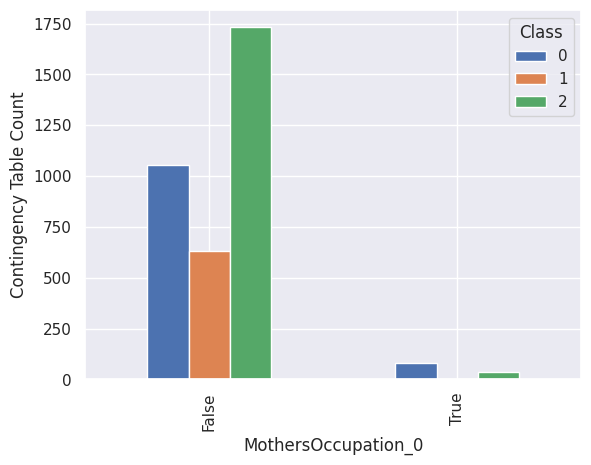

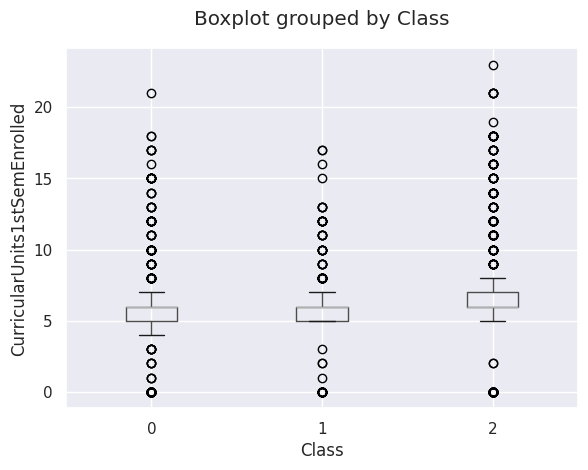

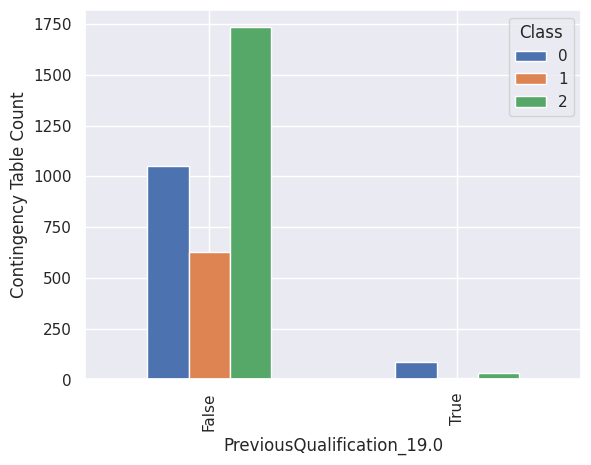

INFO: Validating and Identifying Feature Types...
INFO: Running Initial EDA:
INFO: /content/streamline_output/ColabRun


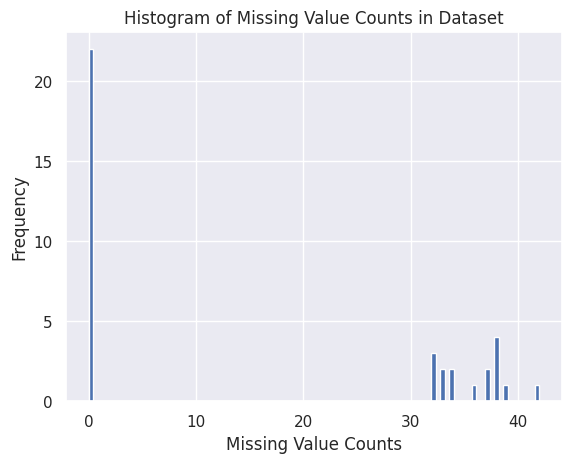

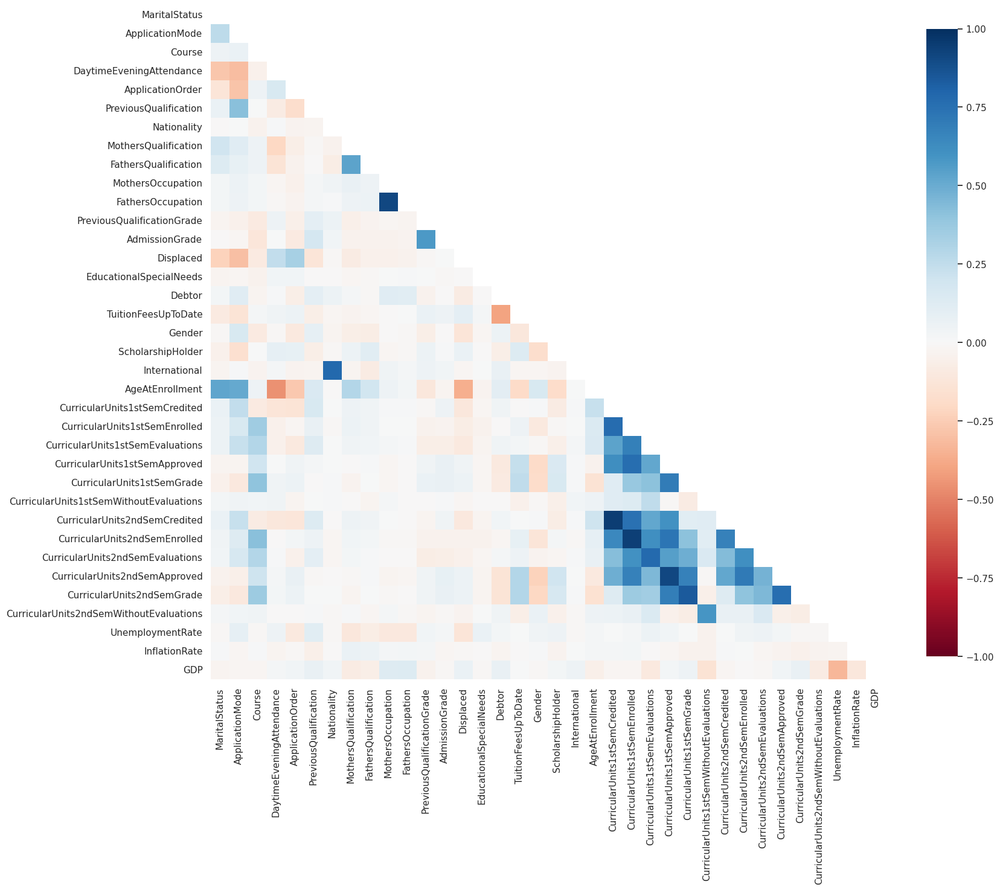

INFO: Running Post-Processing EDA...
INFO: Categorical: ['EducationalSpecialNeeds', 'International', 'Gender', 'TuitionFeesUpToDate', 'DaytimeEveningAttendance', 'ScholarshipHolder', 'Displaced', 'Debtor', 'ApplicationMode_1.0', 'ApplicationMode_2.0', 'ApplicationMode_5.0', 'ApplicationMode_7.0', 'ApplicationMode_10.0', 'ApplicationMode_15.0', 'ApplicationMode_16.0', 'ApplicationMode_17.0', 'ApplicationMode_18.0', 'ApplicationMode_26.0', 'ApplicationMode_27.0', 'ApplicationMode_39.0', 'ApplicationMode_42.0', 'ApplicationMode_43.0', 'ApplicationMode_44.0', 'ApplicationMode_51.0', 'ApplicationMode_53.0', 'ApplicationMode_57.0', 'FathersOccupation_0.0', 'FathersOccupation_1.0', 'FathersOccupation_2.0', 'FathersOccupation_3.0', 'FathersOccupation_4.0', 'FathersOccupation_5.0', 'FathersOccupation_6.0', 'FathersOccupation_7.0', 'FathersOccupation_8.0', 'FathersOccupation_9.0', 'FathersOccupation_10.0', 'FathersOccupation_90.0', 'FathersOccupation_99.0', 'FathersOccupation_101.0', 'FathersOcc

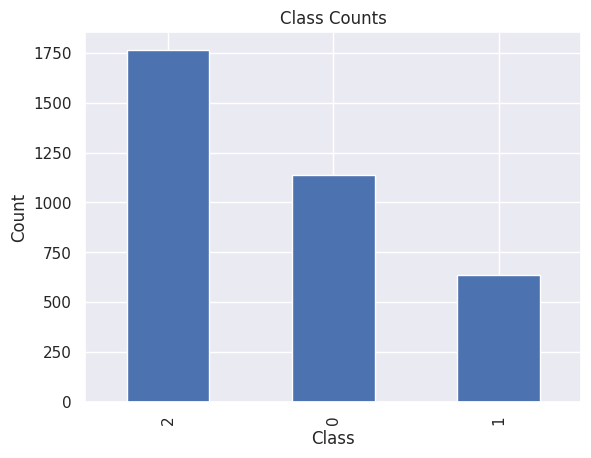

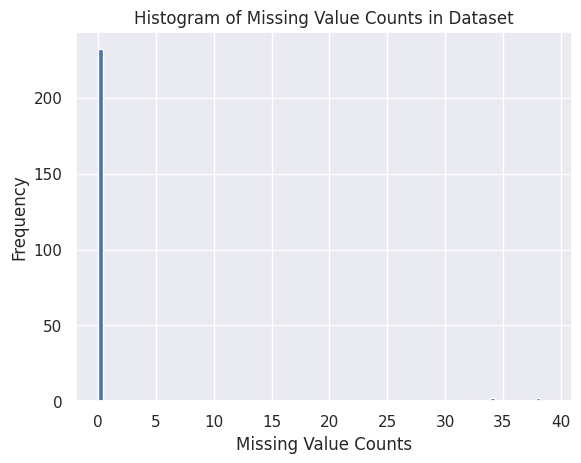

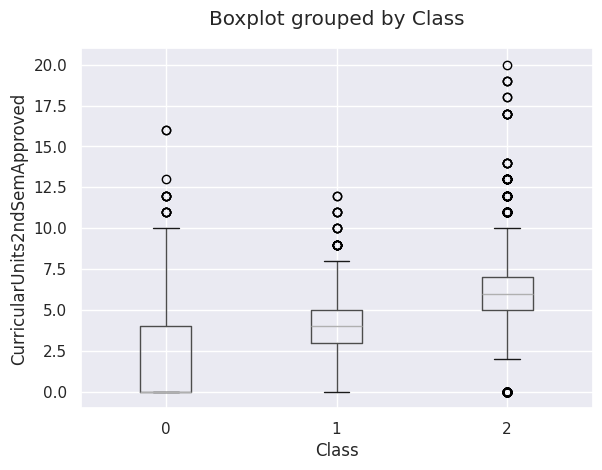

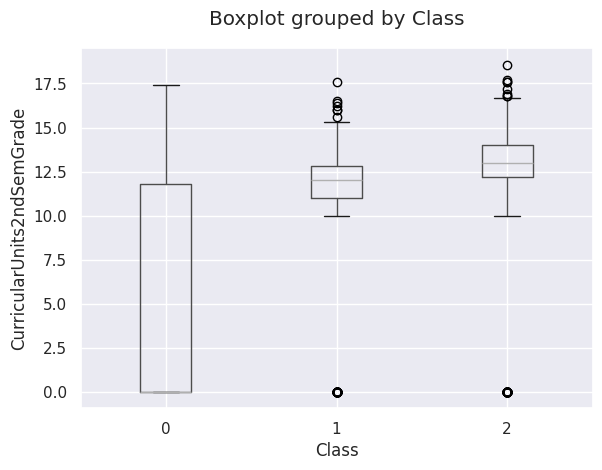

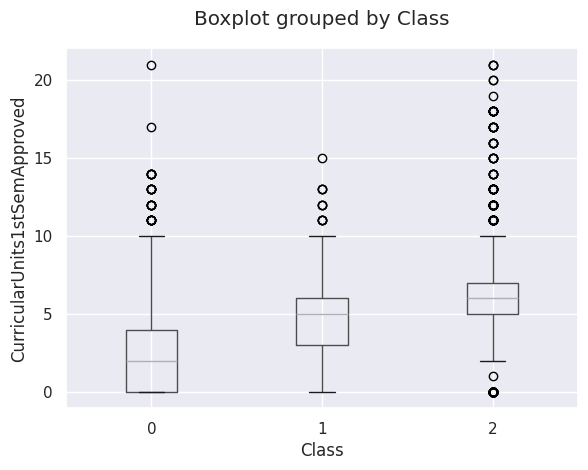

...

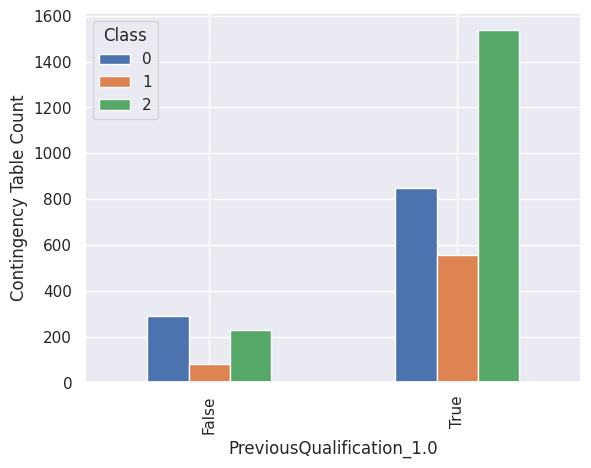

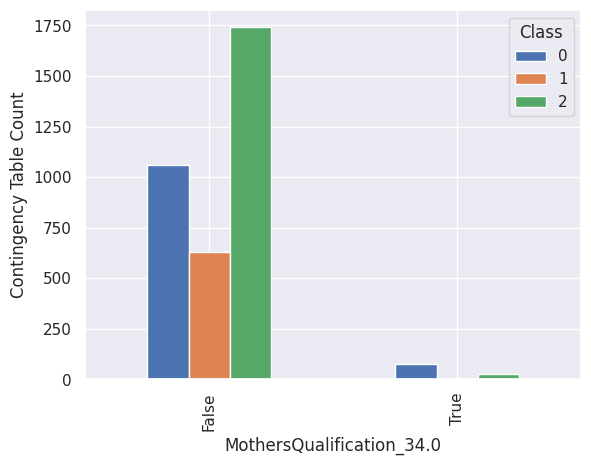

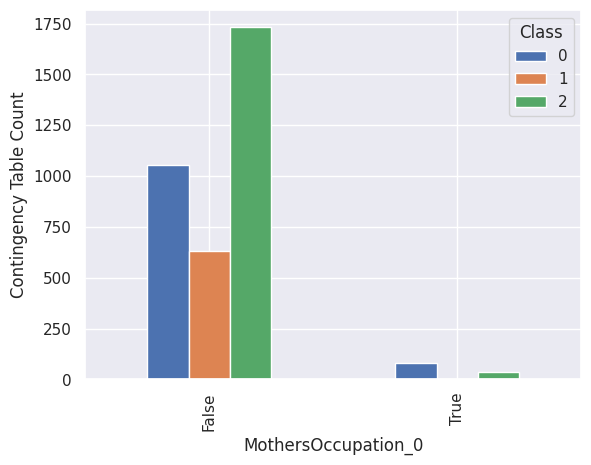

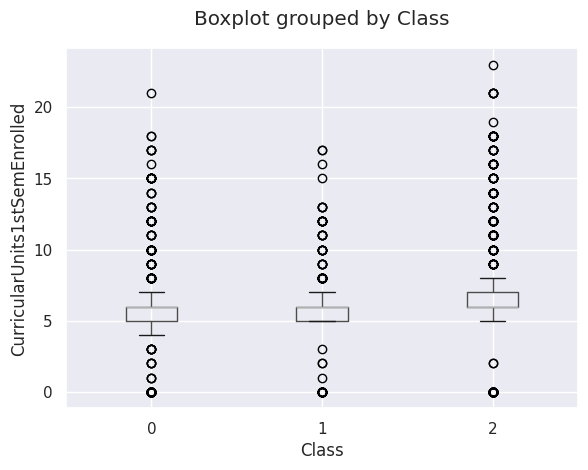

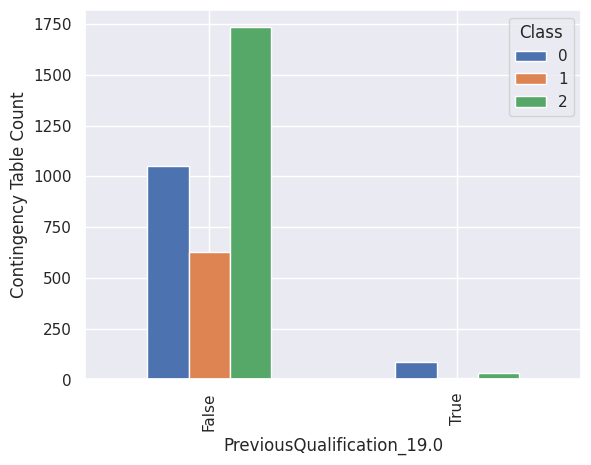

INFO: Updated run parameters in /content/streamline_output/ColabRun/run_params.pickle


INFO: Completed Phase 1 - Data Processing


In [ ]:
if RUN_PHASES["p1"]:
    print("INFO: Starting Phase 1 - Data Processing")
    P1Runner(
        data_path=CFG["data_path"],
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        exclude_eda_output=P1_EXCLUDE_EDA_OUTPUT,
        outcome_label=CFG["outcome_label"],
        outcome_type=CFG["outcome_type"],
        instance_label=CFG["instance_label"],
        match_label=CFG["match_label"],
        n_splits=N_SPLITS,
        partition_method=P1_PARTITION_METHOD,
        ignore_features=P1_IGNORE_FEATURES,
        categorical_features=CFG.get("categorical_features"),
        quantitative_features=CFG.get("quantitative_features"),
        top_features=P1_TOP_FEATURES,
        categorical_cutoff=P1_CATEGORICAL_CUTOFF,
        sig_cutoff=P1_SIG_CUTOFF,
        featureeng_missingness=P1_FEATUREENG_MISSINGNESS,
        cleaning_missingness=P1_CLEANING_MISSINGNESS,
        correlation_removal_threshold=P1_CORRELATION_REMOVAL_THRESHOLD,
        random_state=RANDOM_STATE,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
        show_plots=P1_SHOW_PLOTS,
        one_hot_encoding=P1_ONE_HOT_ENCODING,
        cv_provided=P1_CV_PROVIDED,
        cv_input_root=P1_CV_INPUT_ROOT,
        enable_plots=P1_ENABLE_PLOTS,
        plot_missingness=P1_PLOT_MISSINGNESS,
        plot_class_counts=P1_PLOT_CLASS_COUNTS,
        plot_correlation=P1_PLOT_CORRELATION,
        correlation_plot_max_features=P1_CORRELATION_PLOT_MAX_FEATURES,
        plot_univariate=P1_PLOT_UNIVARIATE,
        univariate_top_k=P1_UNIVARIATE_TOP_K,
        plot_anomalies=P1_PLOT_ANOMALIES,
        force=P1_FORCE,
    ).run()
    print("INFO: Completed Phase 1 - Data Processing")
else:
    print("INFO: Phase 1 skipped")


## Phase 2: Impute, Scale, and Balance
After this cell runs, CV datasets are transformed according to Phase 2 settings:

- missing values are imputed
- quantitative features are optionally scaled
- optional SMOTE/SMOTENC balancing is applied to training folds only

The test fold is transformed using objects learned from the training fold to preserve valid CV separation.


In [ ]:
if RUN_PHASES["p2"]:
    print("INFO: Starting Phase 2 - Scaling and Imputation")
    P2Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        scale_data=P2_SCALE_DATA,
        impute_data=P2_IMPUTE_DATA,
        multi_impute=P2_MULTI_IMPUTE,
        overwrite_cv=P2_OVERWRITE_CV,
        outcome_label=CFG["outcome_label"],
        instance_label=CFG["instance_label"],
        random_state=RANDOM_STATE,
        imputer_id=P2_IMPUTER_ID,
        imputer_params=P2_IMPUTER_PARAMS,
        scaler_id=P2_SCALER_ID,
        scaler_params=P2_SCALER_PARAMS,
        smote=P2_SMOTE,
        smote_method=P2_SMOTE_METHOD,
        smote_sampling_strategy=P2_SMOTE_SAMPLING_STRATEGY,
        smote_k_neighbors=P2_SMOTE_K_NEIGHBORS,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
    ).run()
    print("INFO: Completed Phase 2 - Scaling and Imputation")
else:
    print("INFO: Phase 2 skipped")


INFO: Preparing Train and Test for: student_dropout_academic_success_CV_0
INFO: Imputing Missing Values...


INFO: Starting Phase 2 - Scaling and Imputation


INFO: Scaling Data Values...
INFO: Saving Processed Train and Test Data...
INFO: student_dropout_academic_success Phase 2 complete
INFO: Preparing Train and Test for: student_dropout_academic_success_CV_1
INFO: Imputing Missing Values...
INFO: Scaling Data Values...
INFO: Saving Processed Train and Test Data...
INFO: student_dropout_academic_success Phase 2 complete
INFO: Preparing Train and Test for: student_dropout_academic_success_CV_2
INFO: Imputing Missing Values...
INFO: Scaling Data Values...
INFO: Saving Processed Train and Test Data...
INFO: student_dropout_academic_success Phase 2 complete
INFO: Preparing Train and Test for: student_dropout_academic_success_copy_CV_0
INFO: Imputing Missing Values...
INFO: Scaling Data Values...
INFO: Saving Processed Train and Test Data...
INFO: student_dropout_academic_success_copy Phase 2 complete
INFO: Preparing Train and Test for: student_dropout_academic_success_copy_CV_1
INFO: Imputing Missing Values...
INFO: Scaling Data Values...
INFO

INFO: Completed Phase 2 - Scaling and Imputation


## Phase 3: Feature Learning
After this cell runs, learned representations such as PCA features are created per CV split. These learned features can replace or augment the original features depending on `P3_KEEP_ORIGINAL_FEATURES`.


In [ ]:
if RUN_PHASES["p3"]:
    print("INFO: Starting Phase 3 - Feature Learning")
    P3Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        learner_id=P3_LEARNER_ID,
        learner_params=P3_LEARNER_PARAMS,
        feature_namespace=P3_FEATURE_NAMESPACE,
        keep_original_features=P3_KEEP_ORIGINAL_FEATURES,
        overwrite_cv=P3_OVERWRITE_CV,
        outcome_label=CFG["outcome_label"],
        instance_label=CFG["instance_label"],
        random_state=RANDOM_STATE,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
    ).run()
    print("INFO: Completed Phase 3 - Feature Learning")
else:
    print("INFO: Phase 3 skipped")


INFO: Phase 3 starting for experiment 'ColabRun' with learner 'pca' and namespace 'FL_PCA'.
INFO: Phase 3 discovered 6 CV train/test pairs across 2 dataset(s): student_dropout_academic_success, student_dropout_academic_success_copy
INFO: Phase 3 submitting 6 jobs in mode 'Serial'.
INFO: -------------------------------------------------------
INFO: Loading Dataset: student_dropout_academic_success_CV_0_Train


INFO: Starting Phase 3 - Feature Learning


INFO: Prepared Train and Test for: student_dropout_academic_success_CV_0
INFO: Running Feature Learning (pca)...
INFO: Principal components added: 27 (cumulative explained variance: 1.000)
INFO: Feature learning summary for student_dropout_academic_success_CV_0: input=239, PCs=27, keep_original=True, final_features=266, train_shape=(2359, 268), test_shape=(1180, 268)
INFO: student_dropout_academic_success CV0 phase 3 pca evaluation complete
INFO: -------------------------------------------------------
INFO: Loading Dataset: student_dropout_academic_success_CV_1_Train
INFO: Prepared Train and Test for: student_dropout_academic_success_CV_1
INFO: Running Feature Learning (pca)...
INFO: Principal components added: 27 (cumulative explained variance: 1.000)
INFO: Feature learning summary for student_dropout_academic_success_CV_1: input=239, PCs=27, keep_original=True, final_features=266, train_shape=(2359, 268), test_shape=(1180, 268)
INFO: student_dropout_academic_success CV1 phase 3 pca e

INFO: Completed Phase 3 - Feature Learning


## Phase 4: Feature Importance
After this cell runs, feature-importance scores are saved for each active method and CV split. These outputs feed Phase 5 feature selection, summary statistics, and report tables/figures.


In [ ]:
if RUN_PHASES["p4"]:
    p4_model_params = P4_MODELS_PARAMS
    if isinstance(p4_model_params, dict):
        p4_model_params = {k: dict(v) for k, v in p4_model_params.items()}
        if p4_model_params.get("mutualinformation", {}).get("outcome_type") == "auto":
            p4_model_params["mutualinformation"]["outcome_type"] = CFG["outcome_type"]
    print("INFO: Starting Phase 4 - Feature Importance")
    P4Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        models=P4_MODELS,
        models_params=p4_model_params,
        top_k=P4_TOP_K,
        threshold=P4_THRESHOLD,
        keep_original_features=P4_KEEP_ORIGINAL_FEATURES,
        overwrite_cv=P4_OVERWRITE_CV,
        outcome_label=CFG["outcome_label"],
        outcome_type=CFG["outcome_type"],
        instance_label=CFG["instance_label"],
        random_state=RANDOM_STATE,
        instance_subset=P4_INSTANCE_SUBSET,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
    ).run()
    print("INFO: Completed Phase 4 - Feature Importance")
else:
    print("INFO: Phase 4 skipped")


INFO: Phase 4 starting for experiment 'ColabRun' with models: mutualinformation, multiswrfdb
INFO: Phase 4 discovered 6 CV train/test pairs.
INFO: Phase 4 submitting 12 jobs in mode 'Serial'.
INFO: Phase 4 running model 'mutualinformation' on student_dropout_academic_success [student_dropout_academic_success_CV_0].
INFO: -------------------------------------------------------
INFO: Loading Dataset: student_dropout_academic_success_CV_0_Train


INFO: Starting Phase 4 - Feature Importance


INFO: Prepared Train and Test for: student_dropout_academic_success_CV_0
INFO: Running mutualinformation...
INFO: Sort and pickle feature importance scores...
INFO: student_dropout_academic_success CV0 phase 4 mutualinformation evaluation complete
INFO: Phase 4 completed model 'mutualinformation' on student_dropout_academic_success [student_dropout_academic_success_CV_0].
INFO: Phase 4 running model 'multiswrfdb' on student_dropout_academic_success [student_dropout_academic_success_CV_0].
INFO: -------------------------------------------------------
INFO: Loading Dataset: student_dropout_academic_success_CV_0_Train
INFO: Prepared Train and Test for: student_dropout_academic_success_CV_0
INFO: Phase 4 multiswrfdb passing 220 STREAMLINE categorical feature index(es) to ReBATE.
INFO: Running multiswrfdb...
INFO: Phase 4 multiswrfdb using instance_subset=1000 (1000 of 2359 training instances).
INFO: Sort and pickle feature importance scores...
INFO: student_dropout_academic_success CV0 pha

INFO: Completed Phase 4 - Feature Importance


## Phase 5: Feature Selection
After this cell runs, selected feature subsets and informative feature summaries are generated. If filtering is disabled, all features continue to modeling; otherwise STREAMLINE uses the FI outputs to remove weakly supported features.


INFO: Phase 5 starting for experiment 'ColabRun'.
INFO: Phase 5 discovered 2 dataset(s).
INFO: Phase 5 discovered algorithms for student_dropout_academic_success: multiswrfdb, mutualinformation
INFO: Phase 5 running on dataset student_dropout_academic_success with algorithms: multiswrfdb, mutualinformation
INFO: Phase 5 running selector 'default' for dataset 'student_dropout_academic_success' with algorithms: multiswrfdb, mutualinformation
INFO: Plotting Feature Importance Scores for multiswrfdb...
INFO:                          Feature  Importance
   CurricularUnits2ndSemApproved    0.198215
   CurricularUnits1stSemApproved    0.125201
                      FL_PCA_PC2    0.119714
      CurricularUnits2ndSemGrade    0.091481
                      FL_PCA_PC1    0.077537
      CurricularUnits1stSemGrade    0.060579
CurricularUnits2ndSemEvaluations    0.055368
               ScholarshipHolder    0.053065
                     FL_PCA_PC24    0.050443
CurricularUnits1stSemEvaluations    0.04

INFO: Starting Phase 5 - Feature Selection


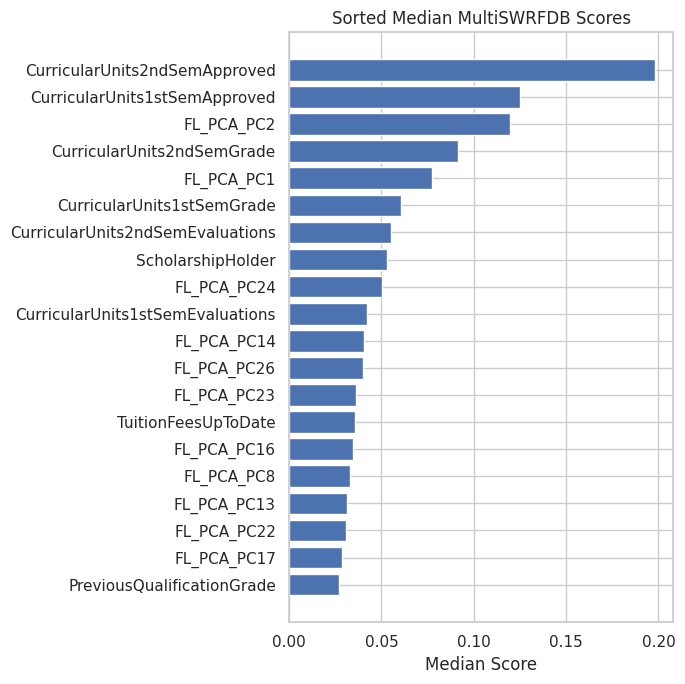

INFO: Saved Feature Importance Plots at
INFO: /content/streamline_output/ColabRun/student_dropout_academic_success/feature_importance/multiswrfdb/TopAverageScores.png
INFO: Plotting Feature Importance Scores for mutualinformation...
INFO:                          Feature  Importance
   CurricularUnits2ndSemApproved    0.296680
   CurricularUnits1stSemApproved    0.247797
                      FL_PCA_PC1    0.222243
      CurricularUnits2ndSemGrade    0.214438
                      FL_PCA_PC2    0.209762
      CurricularUnits1stSemGrade    0.164154
             TuitionFeesUpToDate    0.106069
CurricularUnits2ndSemEvaluations    0.089452
                     FL_PCA_PC17    0.088976
CurricularUnits1stSemEvaluations    0.079273


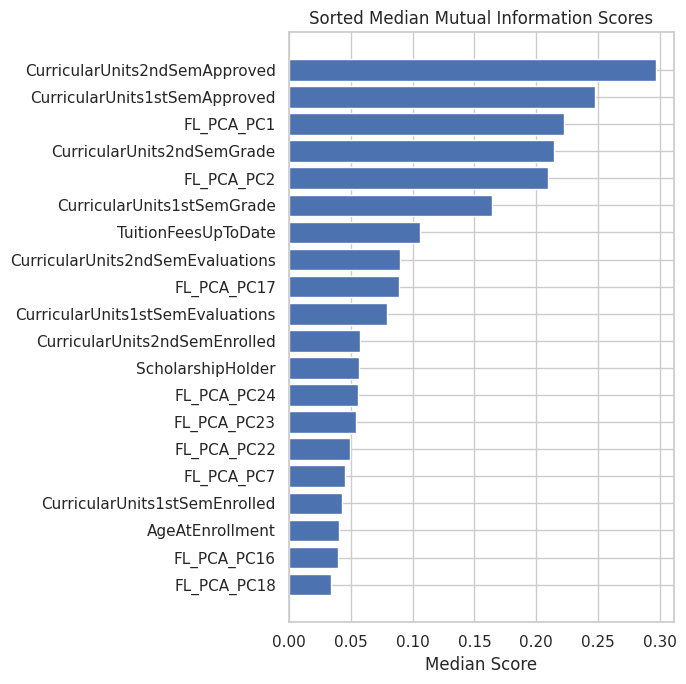

INFO: Saved Feature Importance Plots at
INFO: /content/streamline_output/ColabRun/student_dropout_academic_success/feature_importance/mutualinformation/TopAverageScores.png
INFO: Applying collective feature selection...
INFO: student_dropout_academic_success Phase 5 complete
INFO: Phase 5 completed for dataset student_dropout_academic_success.
INFO: Phase 5 discovered algorithms for student_dropout_academic_success_copy: multiswrfdb, mutualinformation
INFO: Phase 5 running on dataset student_dropout_academic_success_copy with algorithms: multiswrfdb, mutualinformation
INFO: Phase 5 running selector 'default' for dataset 'student_dropout_academic_success_copy' with algorithms: multiswrfdb, mutualinformation
INFO: Plotting Feature Importance Scores for multiswrfdb...
INFO:                          Feature  Importance
   CurricularUnits2ndSemApproved    0.198215
   CurricularUnits1stSemApproved    0.125201
                      FL_PCA_PC2    0.119714
      CurricularUnits2ndSemGrade    0.

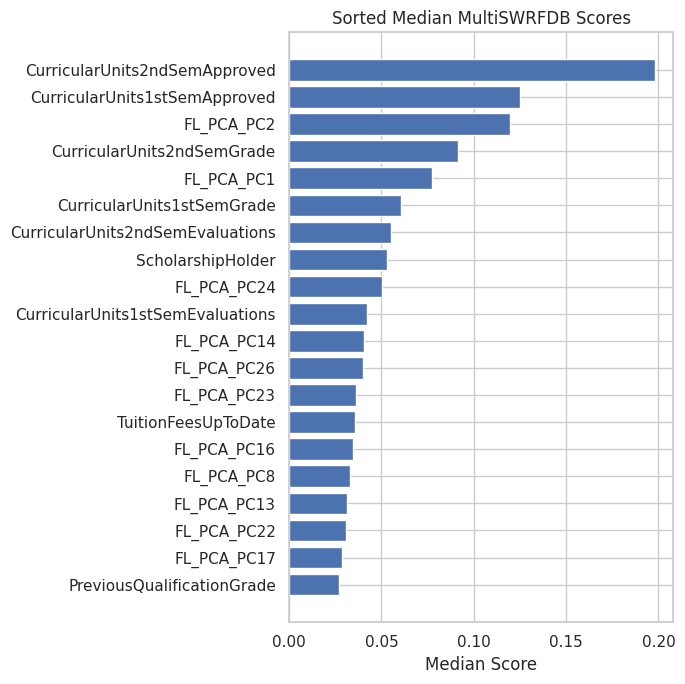

INFO: Saved Feature Importance Plots at
INFO: /content/streamline_output/ColabRun/student_dropout_academic_success_copy/feature_importance/multiswrfdb/TopAverageScores.png
INFO: Plotting Feature Importance Scores for mutualinformation...
INFO:                          Feature  Importance
   CurricularUnits2ndSemApproved    0.296680
   CurricularUnits1stSemApproved    0.247797
                      FL_PCA_PC1    0.222243
      CurricularUnits2ndSemGrade    0.214438
                      FL_PCA_PC2    0.209762
      CurricularUnits1stSemGrade    0.164154
             TuitionFeesUpToDate    0.106069
CurricularUnits2ndSemEvaluations    0.089452
                     FL_PCA_PC17    0.088976
CurricularUnits1stSemEvaluations    0.079273


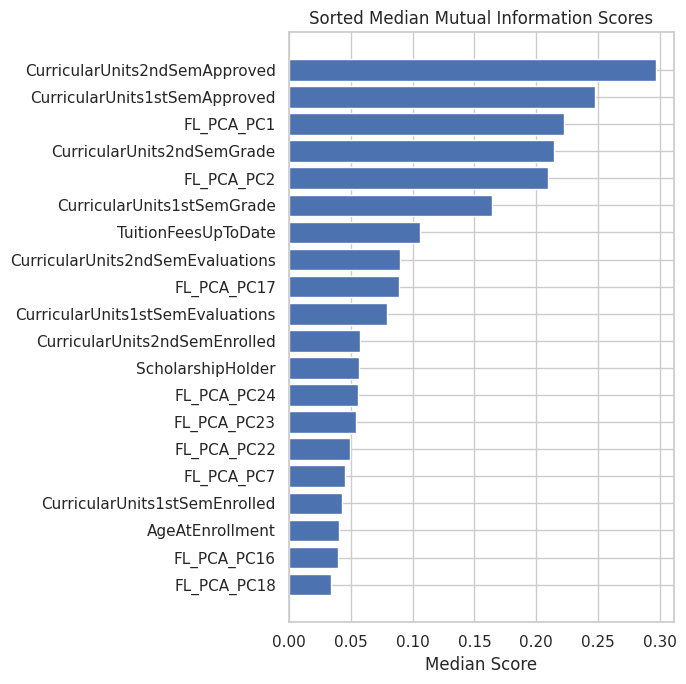

INFO: Saved Feature Importance Plots at
INFO: /content/streamline_output/ColabRun/student_dropout_academic_success_copy/feature_importance/mutualinformation/TopAverageScores.png
INFO: Applying collective feature selection...
INFO: student_dropout_academic_success_copy Phase 5 complete
INFO: Phase 5 completed for dataset student_dropout_academic_success_copy.
INFO: Phase 5 completed for experiment 'ColabRun'.


INFO: Completed Phase 5 - Feature Selection


In [ ]:
if RUN_PHASES["p5"]:
    print("INFO: Starting Phase 5 - Feature Selection")
    P5Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        algorithms=P5_ALGORITHMS,
        n_splits=P5_N_SPLITS,
        outcome_label=CFG["outcome_label"],
        instance_label=CFG["instance_label"],
        max_features_to_keep=P5_MAX_FEATURES_TO_KEEP,
        filter_poor_features=P5_FILTER_POOR_FEATURES,
        overwrite_cv=P5_OVERWRITE_CV,
        selector_id=P5_SELECTOR_ID,
        selector_params=P5_SELECTOR_PARAMS,
        export_scores=P5_EXPORT_SCORES,
        top_features=P5_TOP_FEATURES,
        show_plots=P5_SHOW_PLOTS,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
        strict_discovery=P5_STRICT_DISCOVERY,
    ).run()
    print("INFO: Completed Phase 5 - Feature Selection")
else:
    print("INFO: Phase 5 skipped")


## Phase 6: Modeling
After this cell runs, STREAMLINE trains and evaluates each requested model across CV splits. Outputs include trained model pickles, metrics, ROC/PRC or regression artifacts, Optuna trial summaries, and model feature-importance estimates.


In [ ]:
if RUN_PHASES["p6"]:
    print("INFO: Starting Phase 6 - Modeling")
    P6Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        outcome_label=CFG["outcome_label"],
        outcome_type=P6_OUTCOME_TYPE or CFG["outcome_type"],
        model_type=P6_MODEL_TYPE,
        instance_label=CFG["instance_label"],
        n_splits=N_SPLITS,
        models=P6_MODELS or CFG["p6_models"],
        model_params_json=P6_MODEL_PARAMS_JSON,
        calibrate=P6_CALIBRATE,
        calibrate_method=P6_CALIBRATE_METHOD,
        calibrate_cv=P6_CALIBRATE_CV,
        scoring_metric=P6_SCORING_METRIC or CFG["p6_scoring_metric"],
        metric_direction=P6_METRIC_DIRECTION or CFG["p6_metric_direction"],
        n_trials=P6_N_TRIALS,
        timeout=P6_TIMEOUT,
        training_subsample=P6_TRAINING_SUBSAMPLE,
        uniform_fi=P6_UNIFORM_FI,
        save_plot=P6_SAVE_PLOT,
        skip_completed_models=P6_SKIP_COMPLETED_MODELS,
        random_state=RANDOM_STATE,
        bypass_one_hot_for_native_models=P6_BYPASS_ONE_HOT_FOR_NATIVE_MODELS,
        native_categorical_models=P6_NATIVE_CATEGORICAL_MODELS,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
    ).run()
    print("INFO: Completed Phase 6 - Modeling")
else:
    print("INFO: Phase 6 skipped")


INFO: Starting Phase 6 - Modeling


INFO: Running NB on /content/streamline_output/ColabRun/student_dropout_academic_success/CVDatasets/student_dropout_academic_success_CV_0_Train.csv
INFO: student_dropout_academic_success [CV_0] (NB) training complete. ------------------------------------
INFO: Running NB on /content/streamline_output/ColabRun/student_dropout_academic_success/CVDatasets/student_dropout_academic_success_CV_1_Train.csv
INFO: student_dropout_academic_success [CV_1] (NB) training complete. ------------------------------------
INFO: Running NB on /content/streamline_output/ColabRun/student_dropout_academic_success/CVDatasets/student_dropout_academic_success_CV_2_Train.csv
INFO: student_dropout_academic_success [CV_2] (NB) training complete. ------------------------------------
INFO: Running LR on /content/streamline_output/ColabRun/student_dropout_academic_success/CVDatasets/student_dropout_academic_success_CV_0_Train.csv
INFO: Best trial:
INFO:   Value: 0.7123920943874902
INFO:   Params: 
INFO:     solver: 

INFO: Completed Phase 6 - Modeling


## Phase 7: Ensembles
Optional phase. After this cell runs, ensemble metrics and curves are generated from Phase 6 base models when enabled. The notebook skips this phase for regression unless `ALLOW_P7_FOR_REGRESSION=True`.


In [ ]:
print("INFO: Evaluating Phase 7 - Ensembles")
run_p7 = RUN_PHASES["p7"] and P7_ENABLED
if CFG["task_family"] == "regression" and not ALLOW_P7_FOR_REGRESSION:
    run_p7 = False
    print("INFO: Phase 7 skipped for regression (ALLOW_P7_FOR_REGRESSION=False)")

if run_p7:
    print("INFO: Starting Phase 7 - Ensembles")
    P7Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        n_splits=N_SPLITS,
        outcome_label=CFG["outcome_label"],
        instance_label=CFG["instance_label"],
        ensembles=P7_ENSEMBLES,
        base_models=(P7_BASE_MODELS or CFG["p6_models"]),
        meta_train_source=P7_META_TRAIN_SOURCE,
        calibrate=P7_CALIBRATE,
        calibrate_method=P7_CALIBRATE_METHOD,
        calibrate_cv=P7_CALIBRATE_CV,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
        random_state=RANDOM_STATE,
    ).run()
    print("INFO: Completed Phase 7 - Ensembles")
elif RUN_PHASES["p7"]:
    print("INFO: Phase 7 skipped")


INFO: [P7] student_dropout_academic_success CV=0: loading base estimators...


INFO: Evaluating Phase 7 - Ensembles
INFO: Starting Phase 7 - Ensembles


INFO: [P7] Building ensemble: Hard Ensemble Voting using 3 base models
INFO: [P7] Saved ensemble metrics/curves for HEV CV=0
INFO: [P7] Building ensemble: Soft Ensemble Voting using 3 base models
INFO: [P7] Saved ensemble metrics/curves for SEV CV=0
INFO: [P7] Building ensemble: StackingLogReg using 3 base models
INFO: [P7] Building ensemble (stacking): StackingLogReg [meta on train]
INFO: [P7] Saved ensemble metrics/curves for STK_LR CV=0
INFO: [P7] student_dropout_academic_success CV=1: loading base estimators...
INFO: [P7] Building ensemble: Hard Ensemble Voting using 3 base models
INFO: [P7] Saved ensemble metrics/curves for HEV CV=1
INFO: [P7] Building ensemble: Soft Ensemble Voting using 3 base models
INFO: [P7] Saved ensemble metrics/curves for SEV CV=1
INFO: [P7] Building ensemble: StackingLogReg using 3 base models
INFO: [P7] Building ensemble (stacking): StackingLogReg [meta on train]
INFO: [P7] Saved ensemble metrics/curves for STK_LR CV=1
INFO: [P7] student_dropout_academic

INFO: Completed Phase 7 - Ensembles


## Phase 8: Summary Statistics
After this cell runs, STREAMLINE creates per-dataset performance summaries and post-analysis figures, including model comparison plots and feature-importance summaries used by the final report.


INFO: Running Statistics Summary for student_dropout_academic_success
INFO: Running stats on Decision Tree


INFO: Starting Phase 8 - Summary Statistics


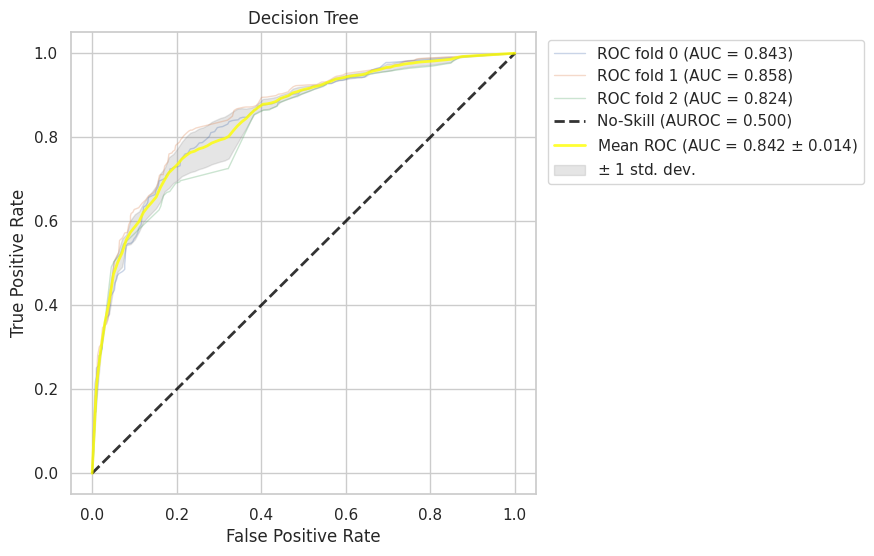

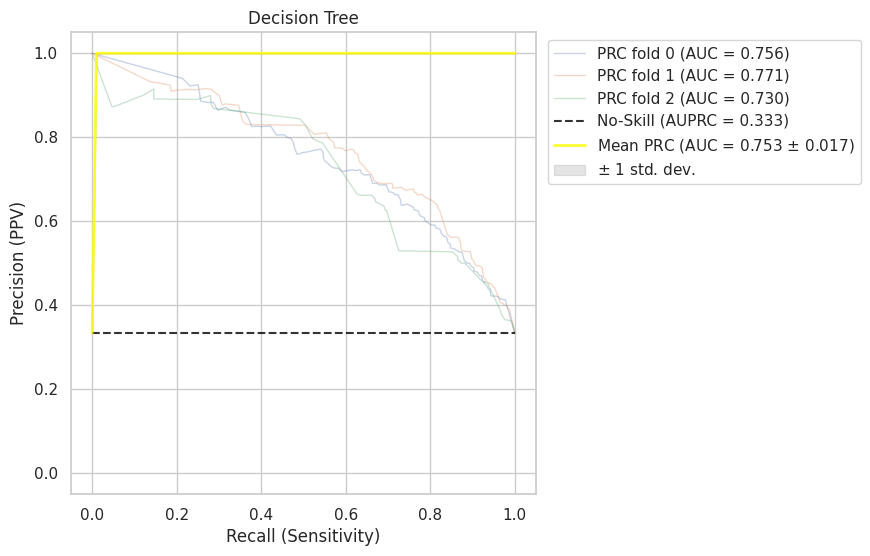

INFO: Running stats on Logistic Regression


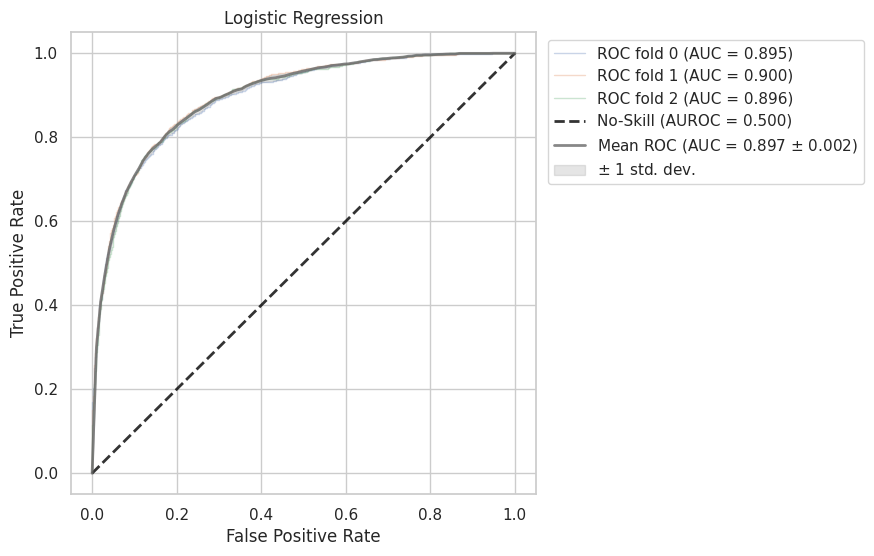

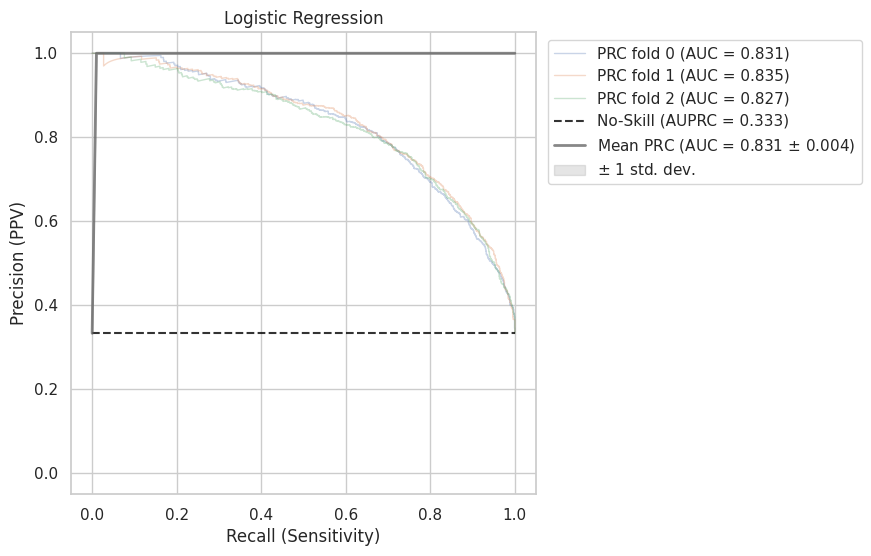

INFO: Running stats on Naive Bayes


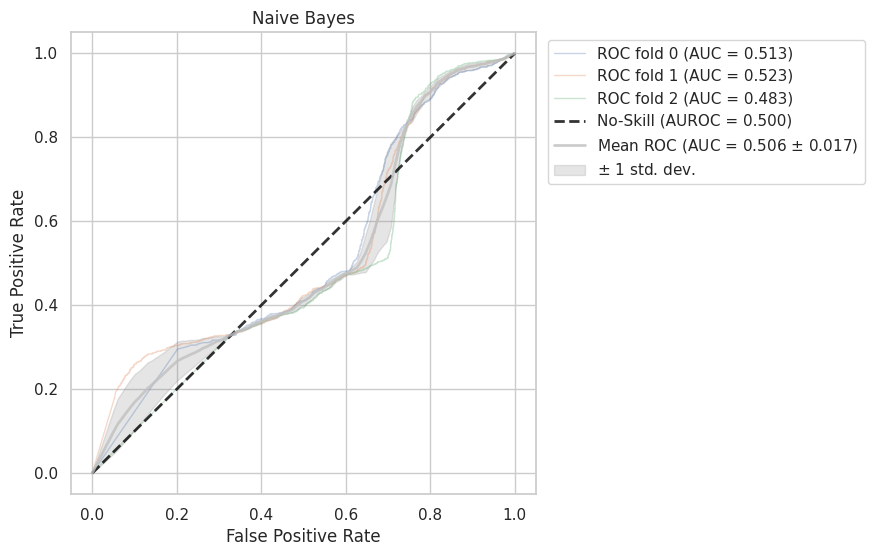

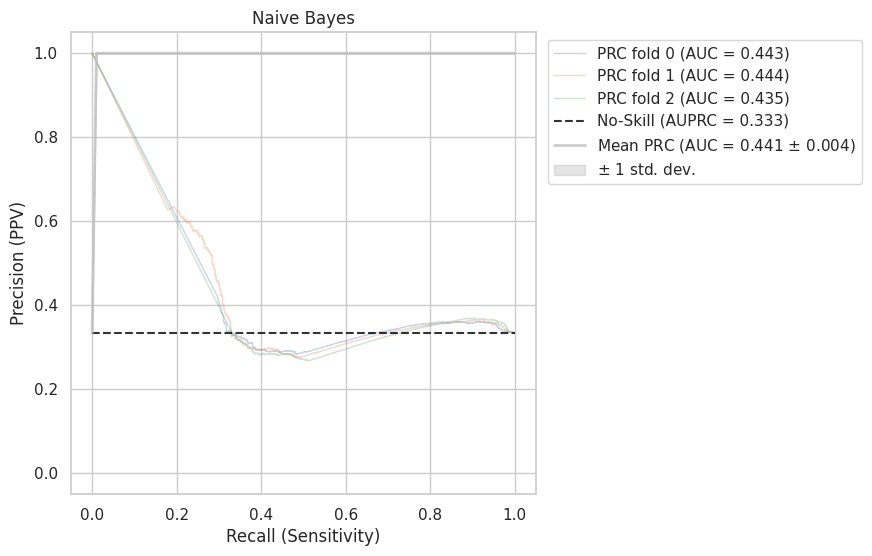

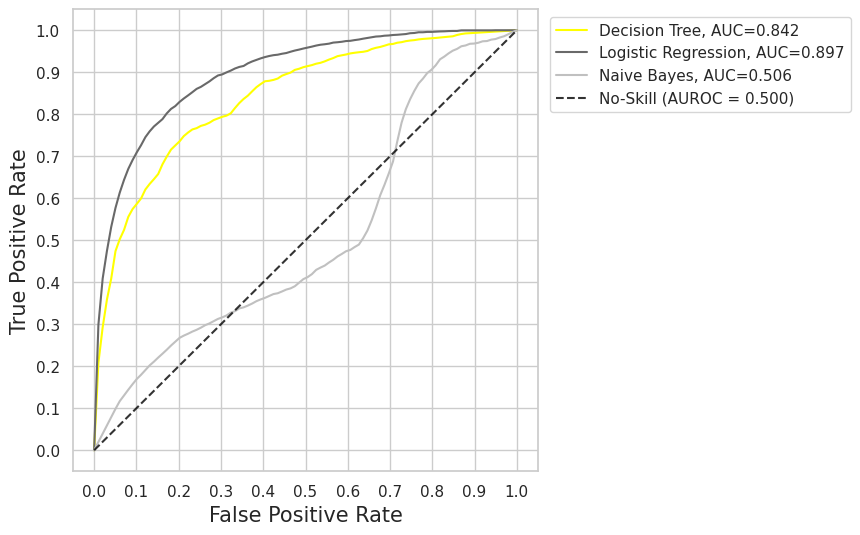

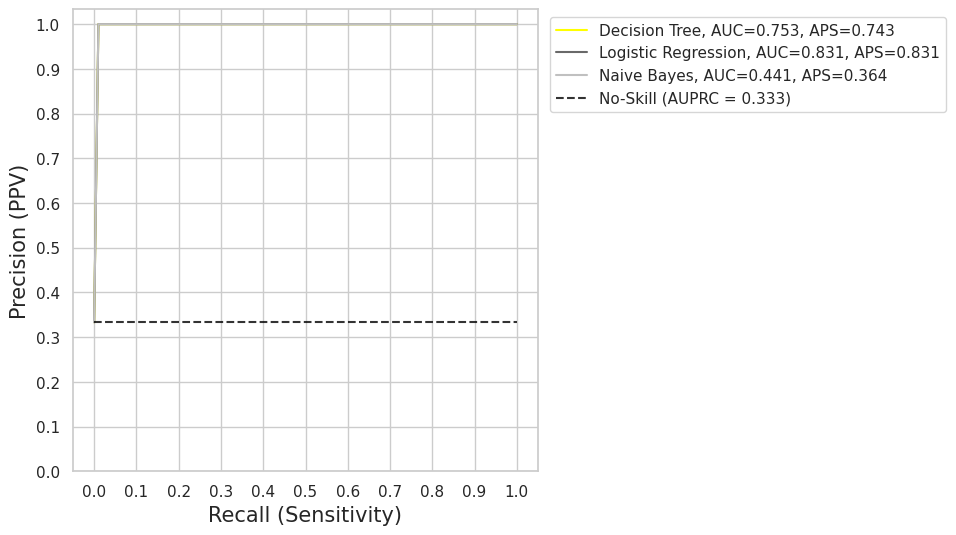

INFO: Saving Metric Summaries...
INFO: Generating Metric Boxplots...


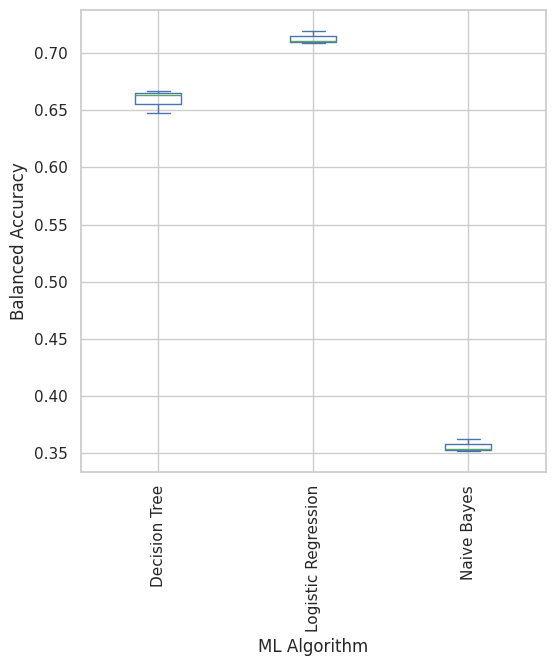

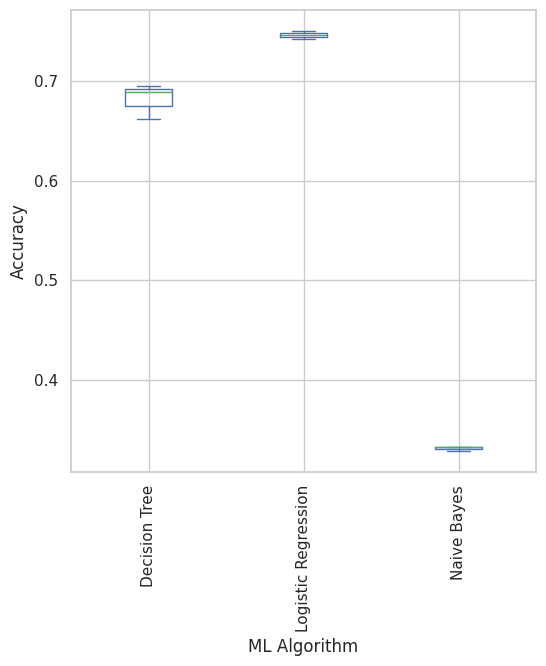

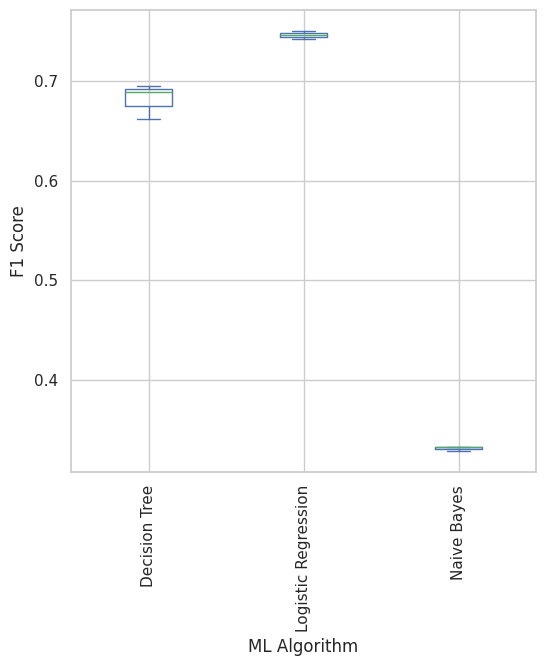

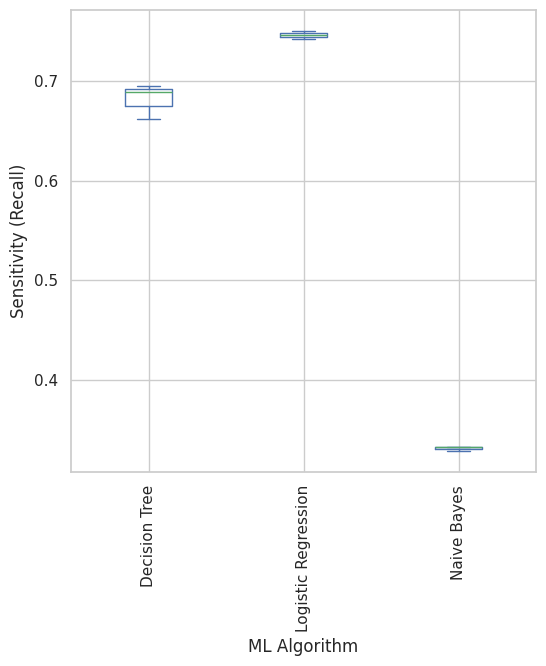

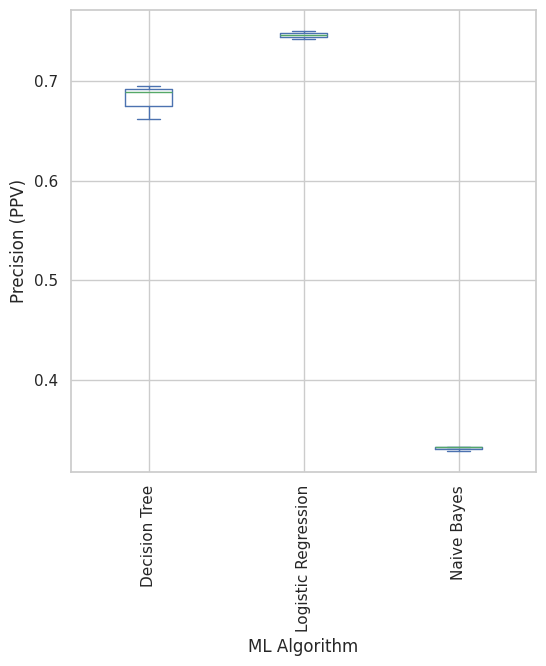

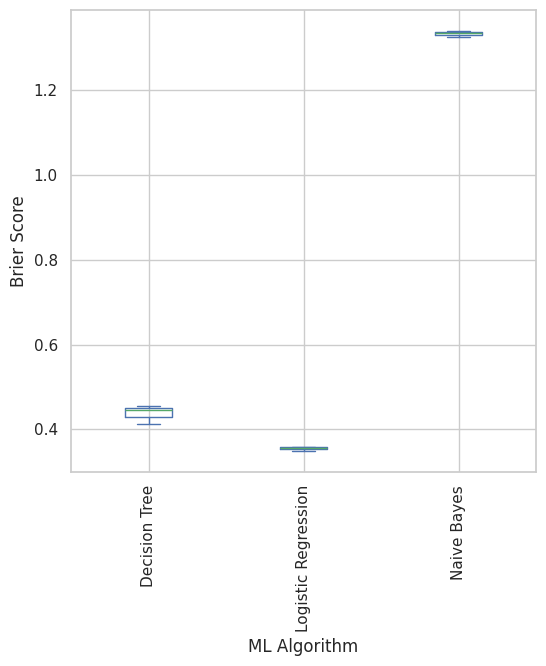

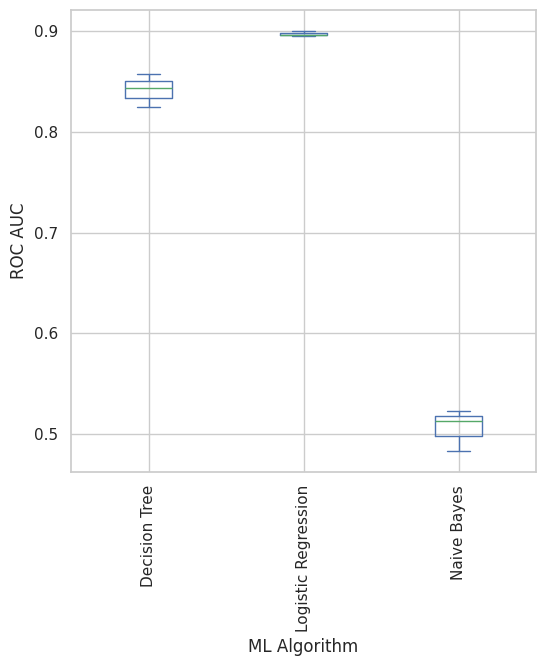

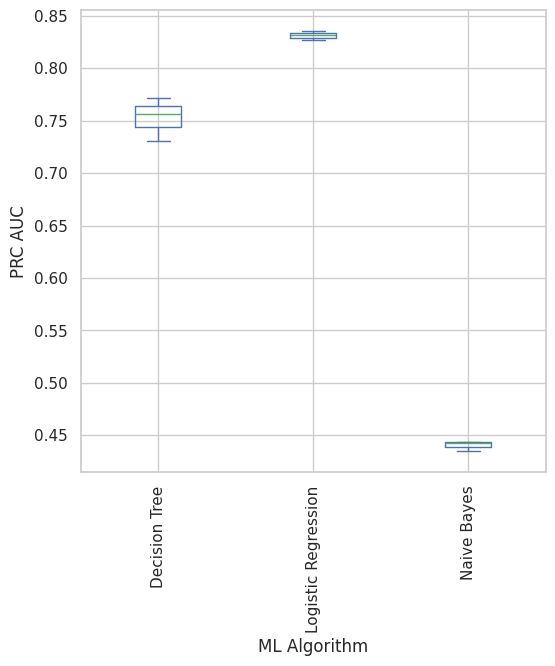

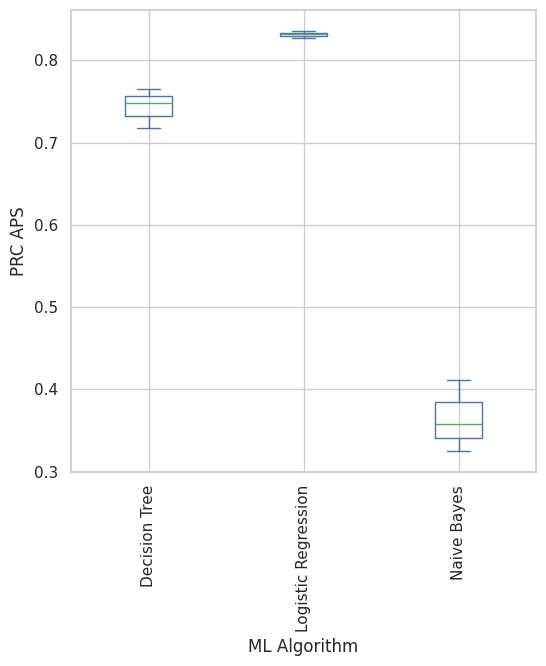

INFO: Running Non-Parametric Statistical Significance Analysis...
INFO: Preparing for Model Feature Importance Plotting...
INFO: Generating Feature Importance Boxplot and Histograms...


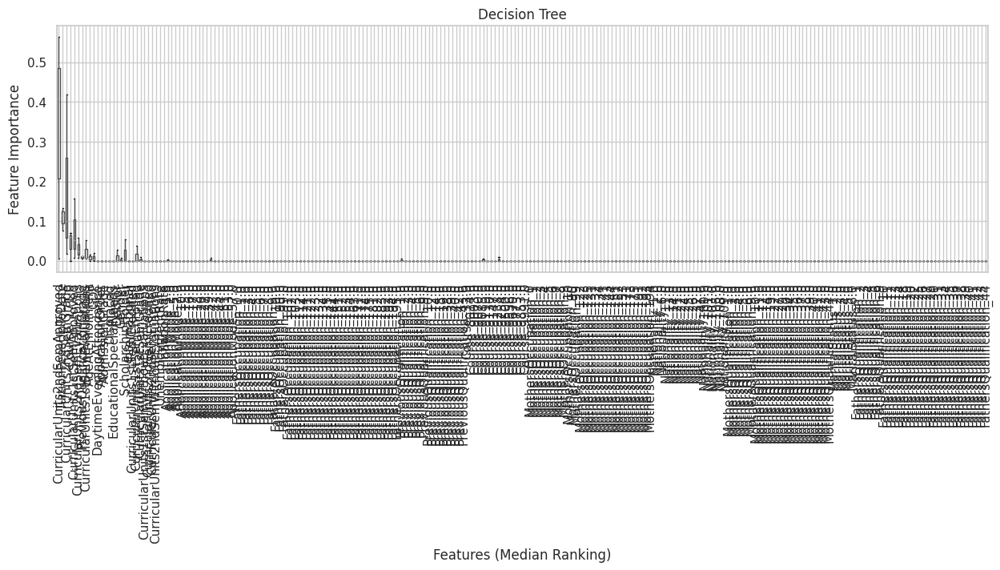

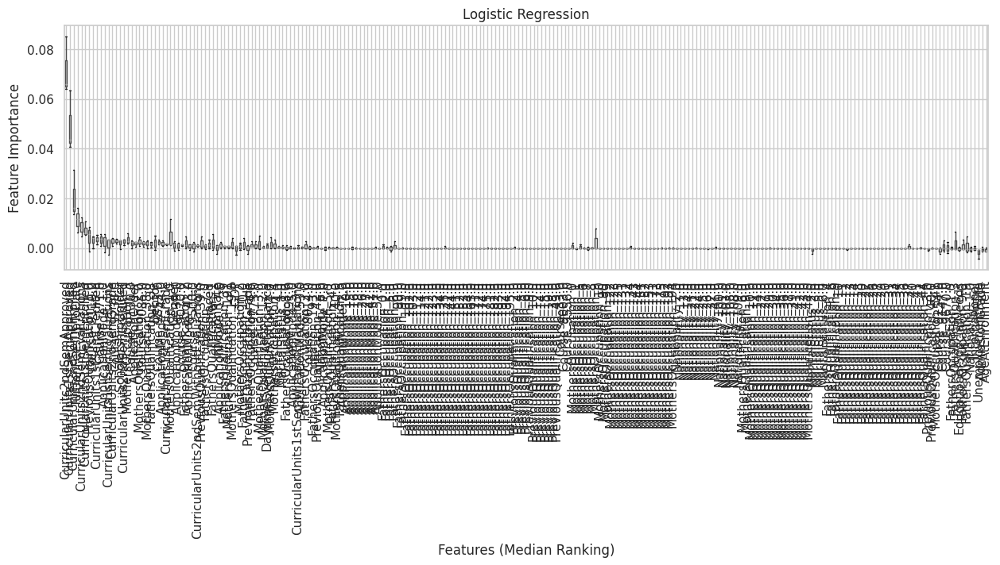

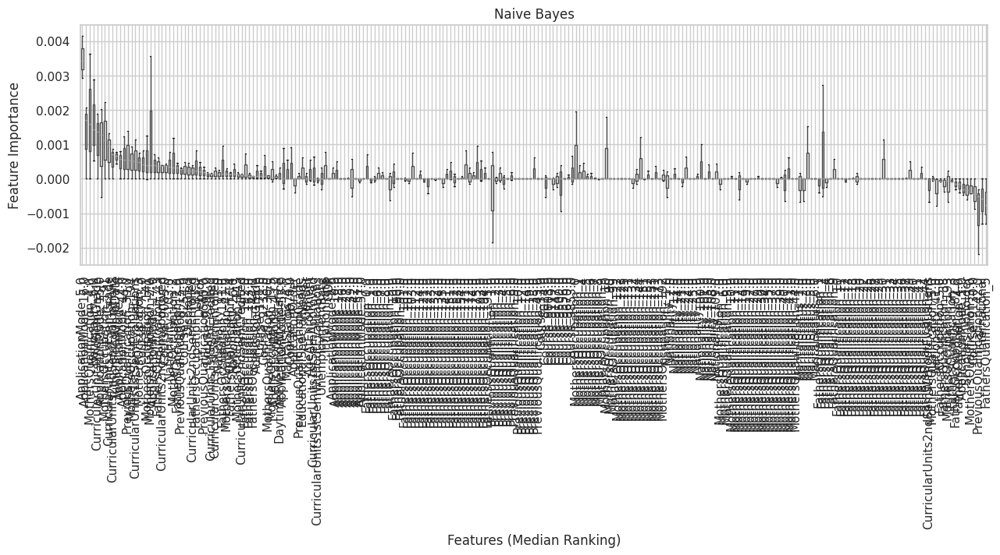

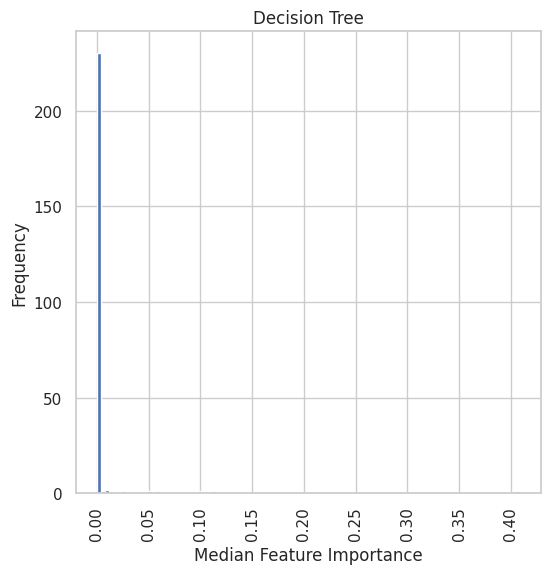

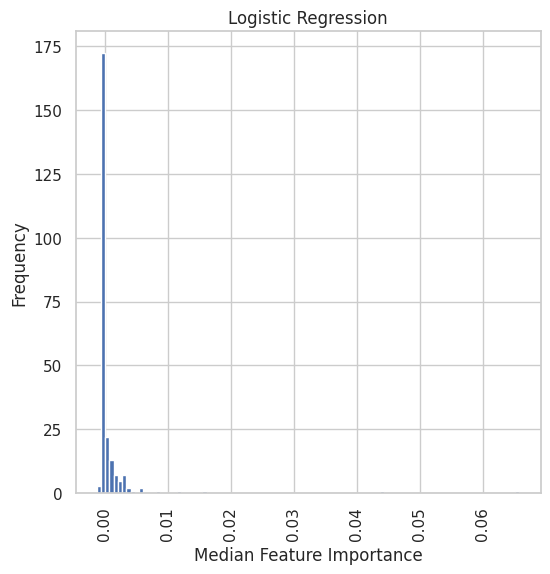

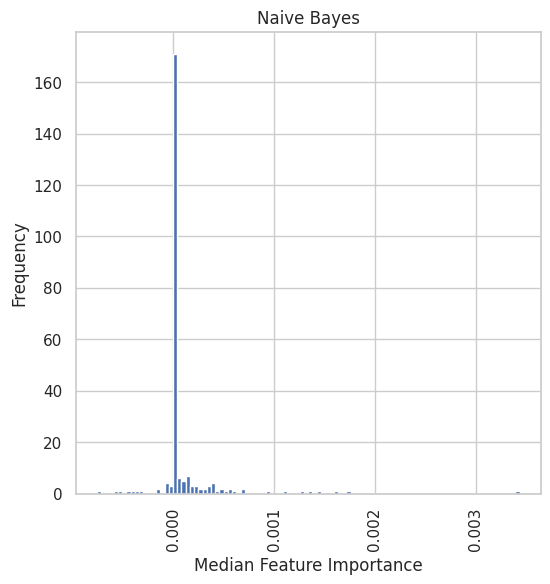

INFO: Generating Composite Feature Importance Plots...


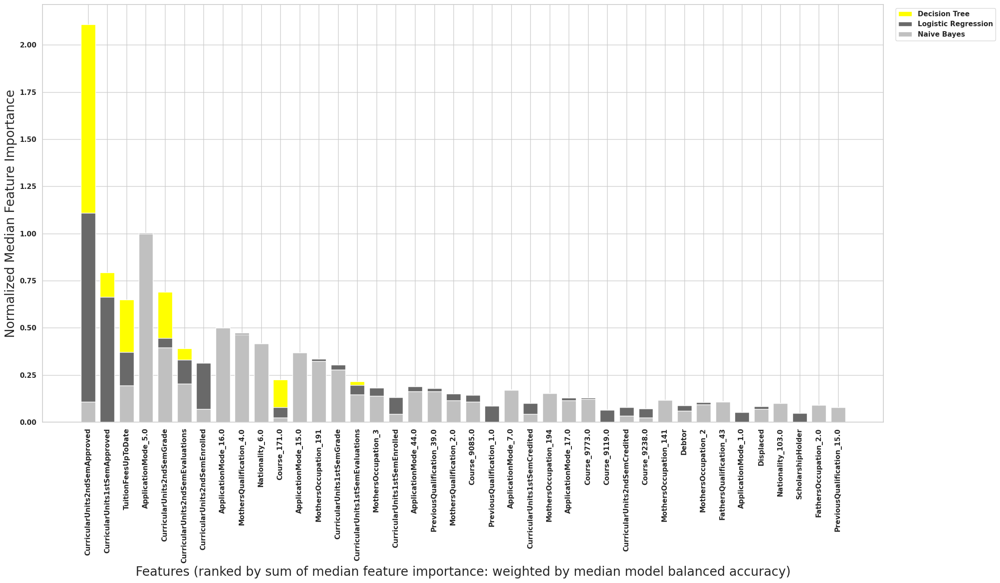

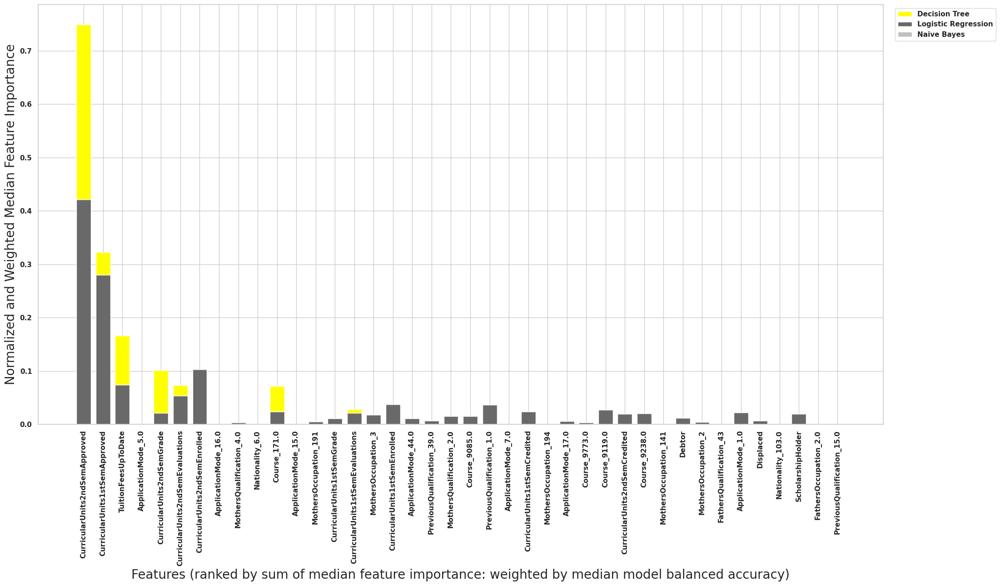

INFO: Collecting ensemble statistics from /content/streamline_output/ColabRun/student_dropout_academic_success/ensemble_evaluation


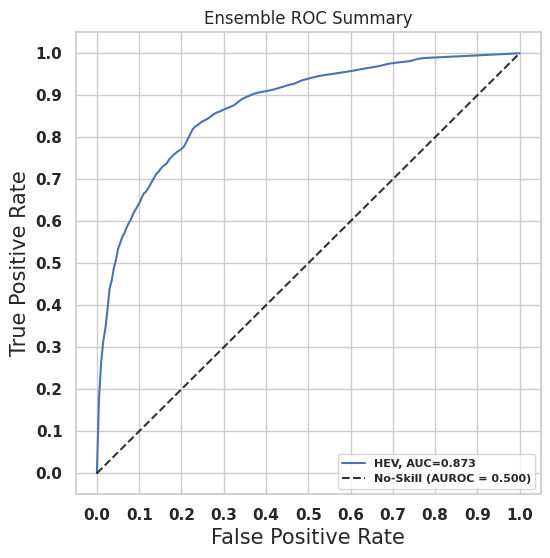

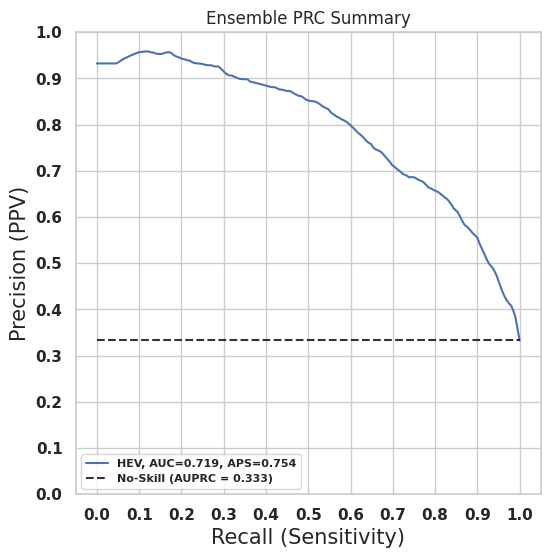

INFO: student_dropout_academic_success statistics phase complete
INFO: Running Statistics Summary for student_dropout_academic_success_copy
INFO: Running stats on Decision Tree


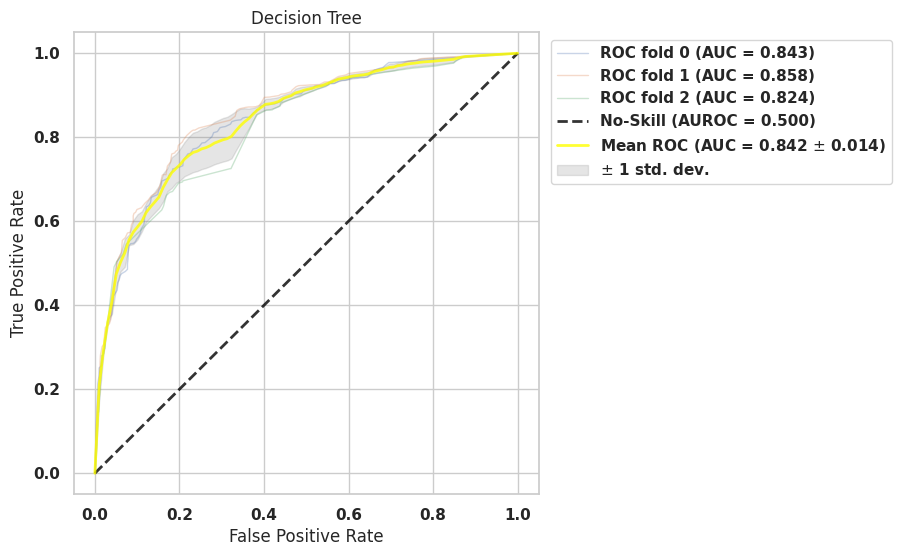

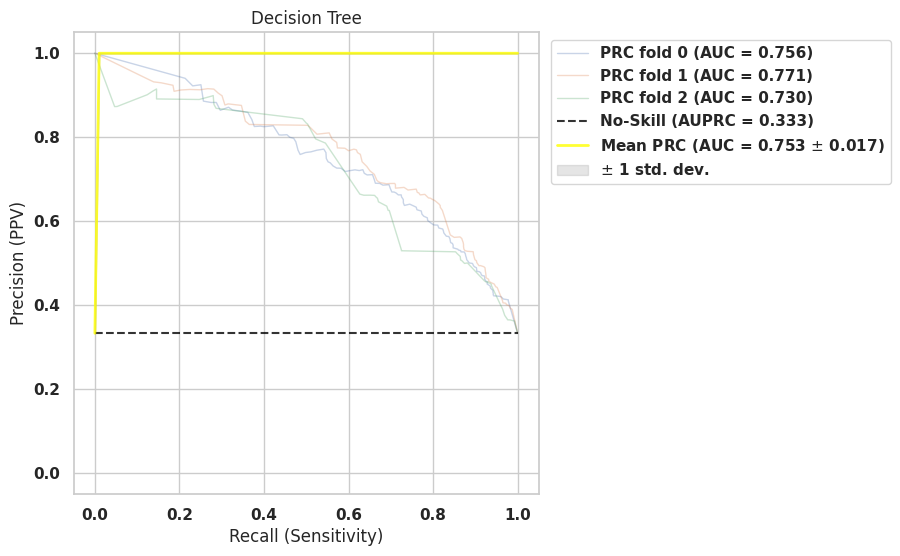

INFO: Running stats on Logistic Regression


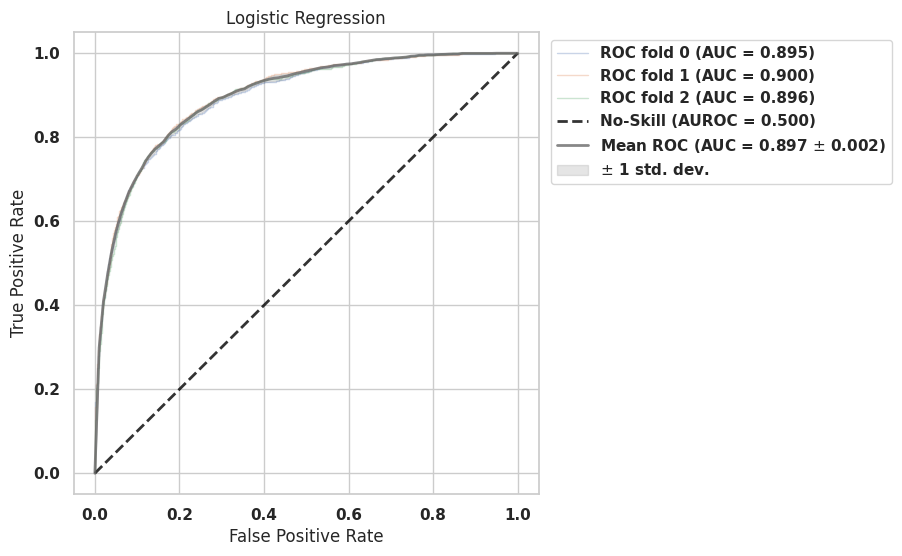

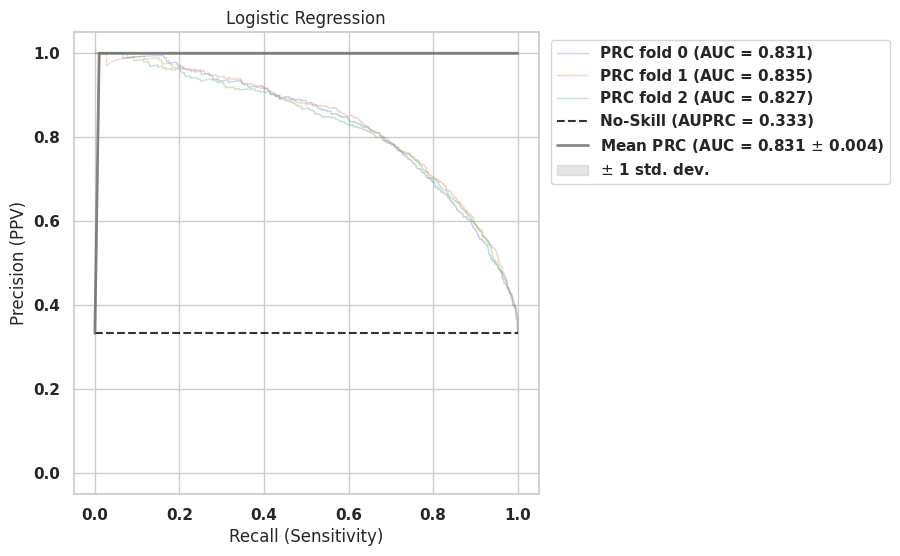

INFO: Running stats on Naive Bayes


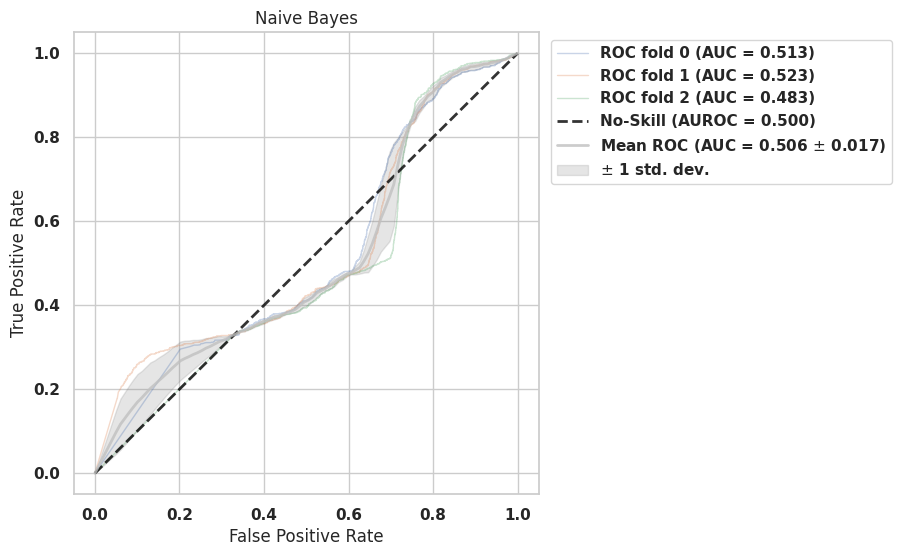

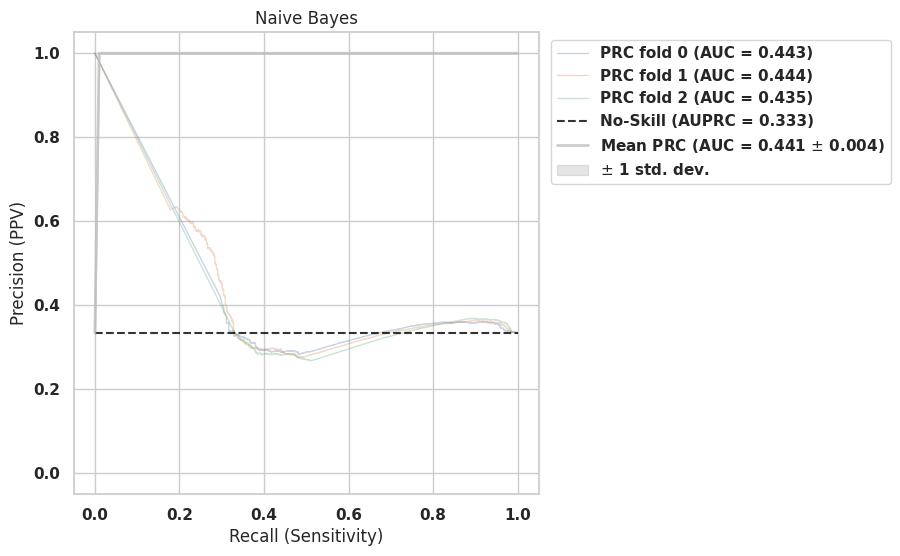

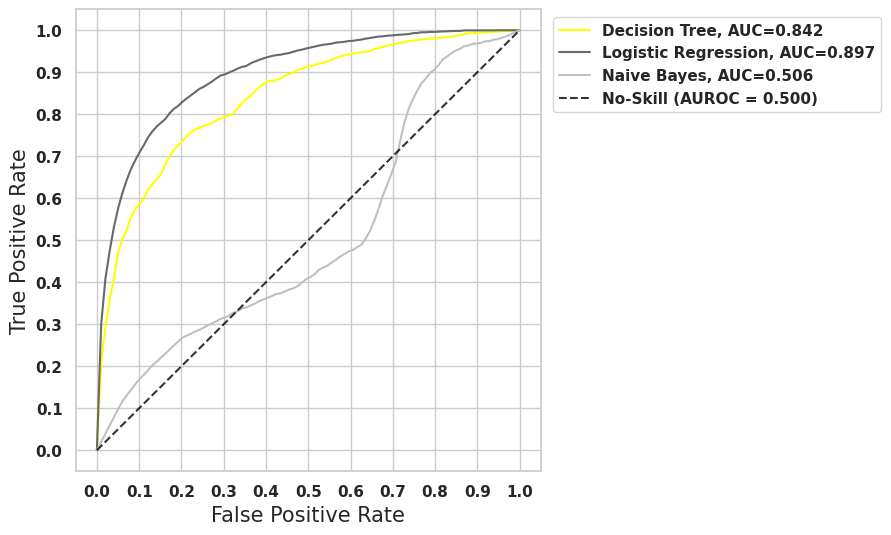

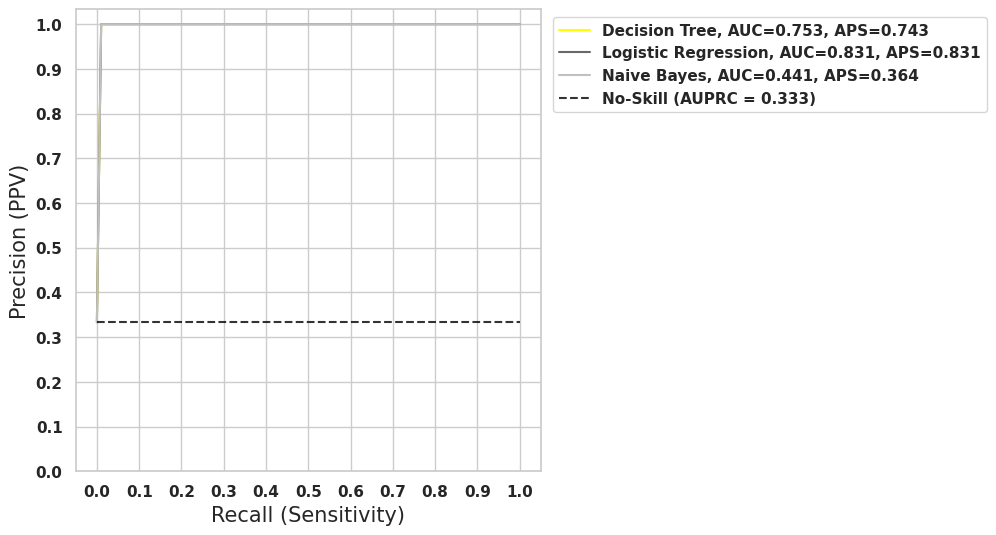

INFO: Saving Metric Summaries...
INFO: Generating Metric Boxplots...


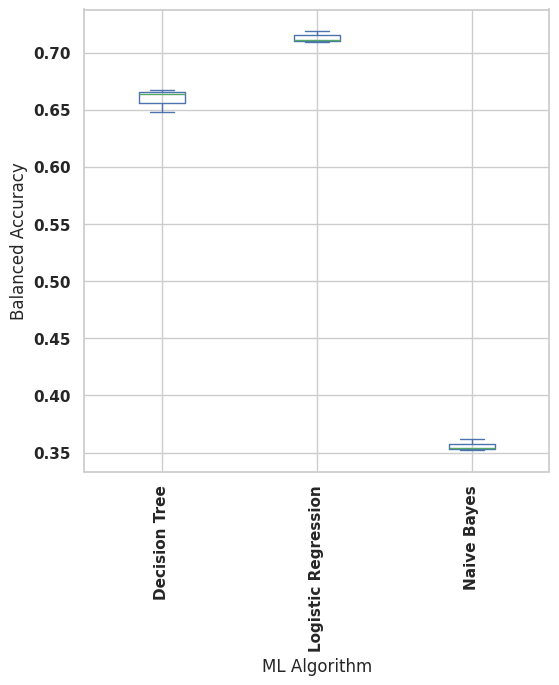

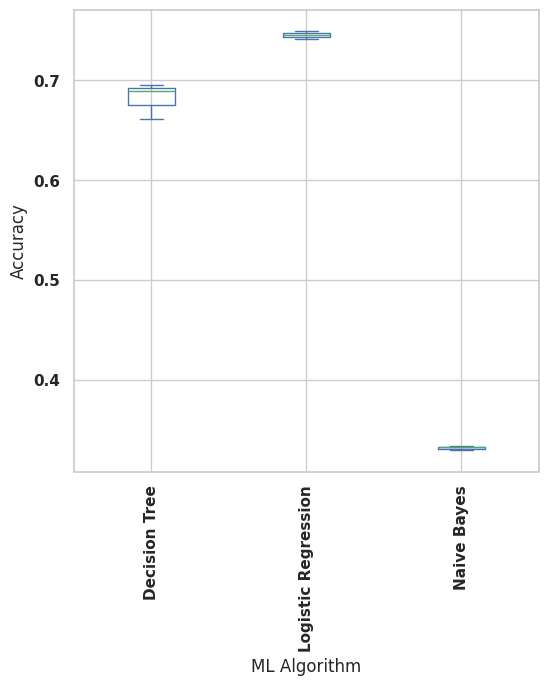

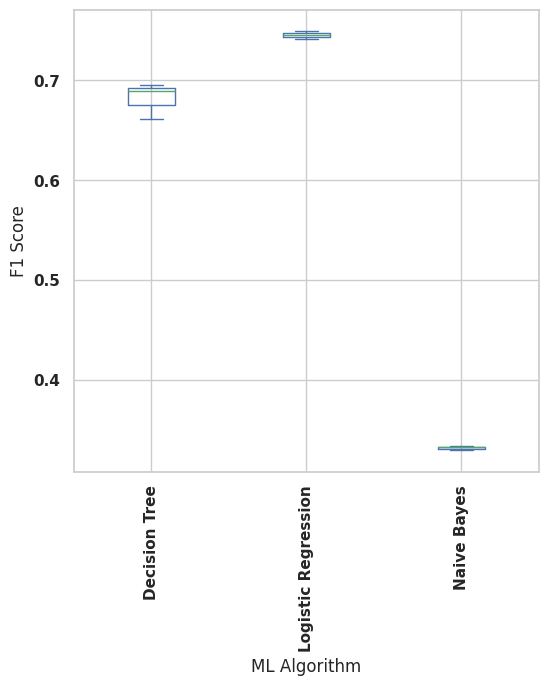

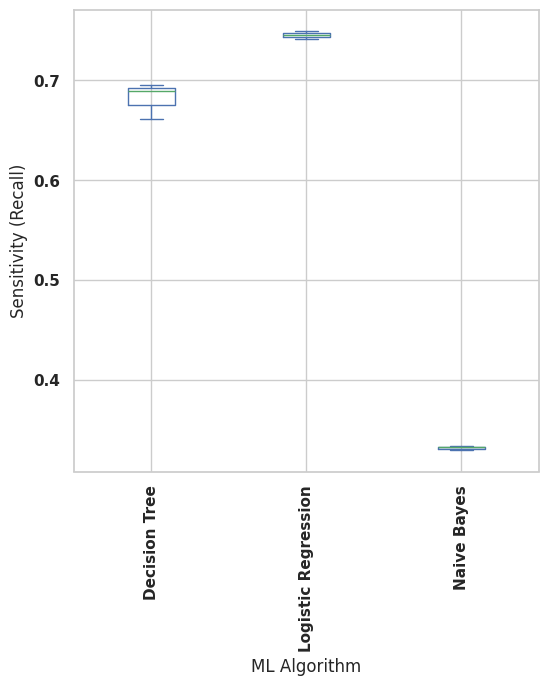

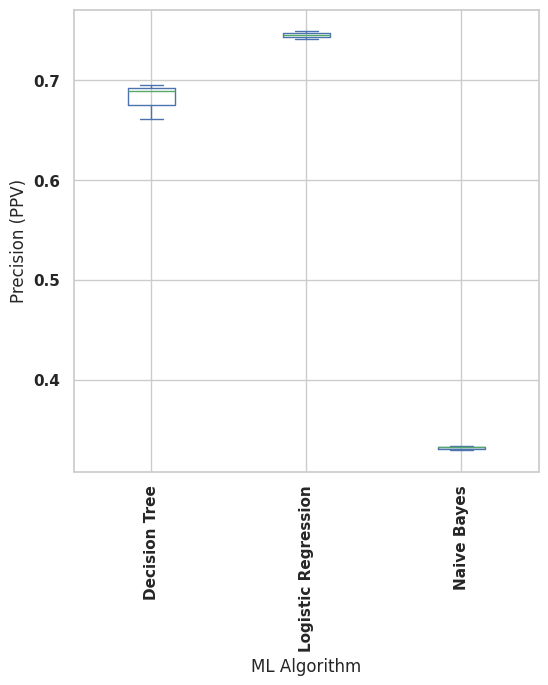

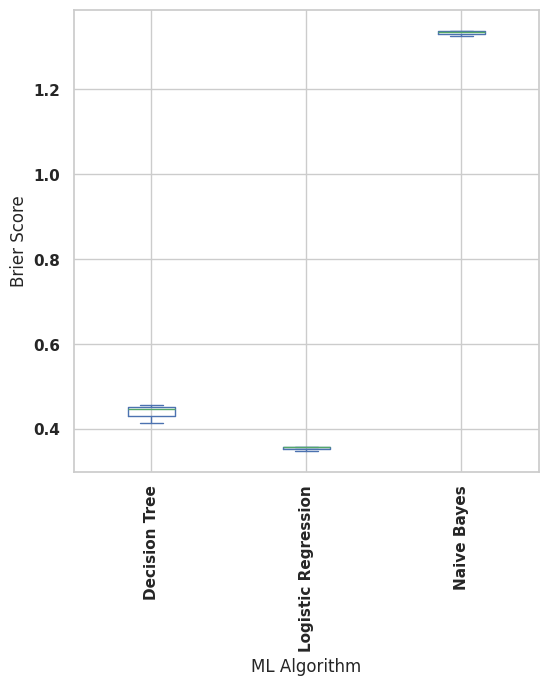

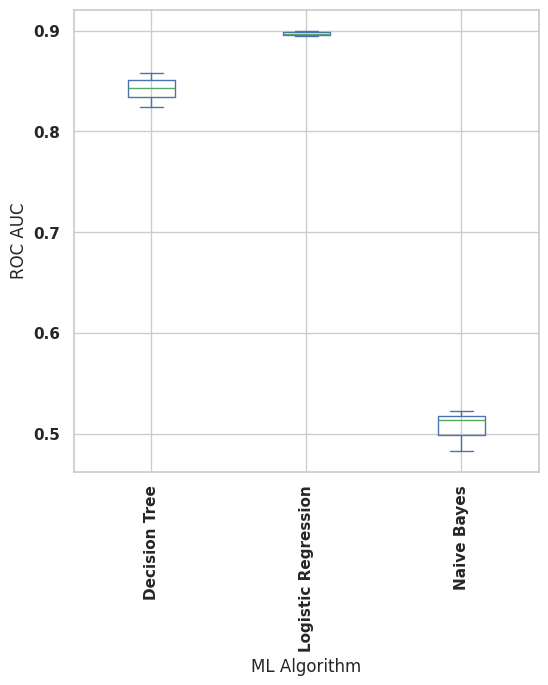

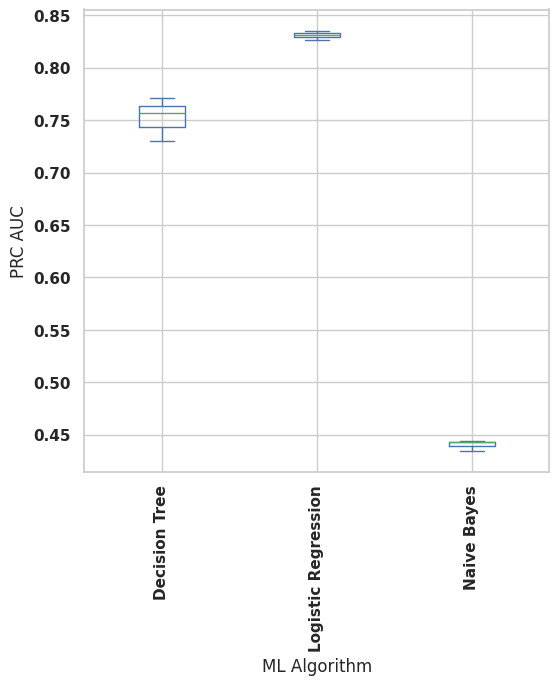

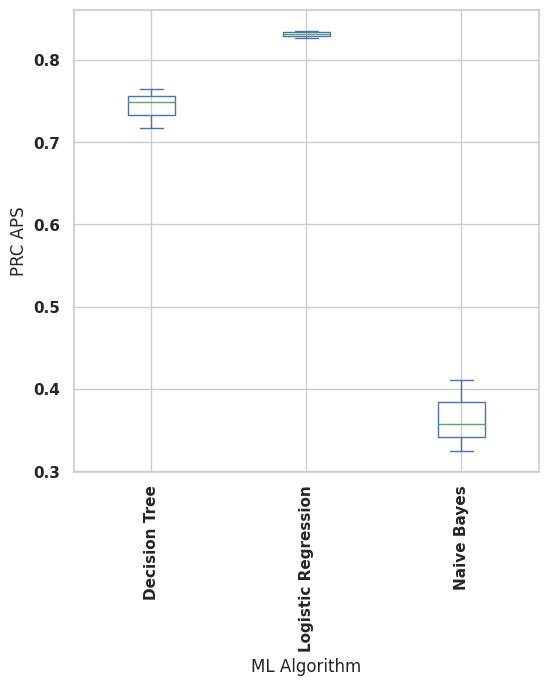

INFO: Running Non-Parametric Statistical Significance Analysis...
INFO: Preparing for Model Feature Importance Plotting...
INFO: Generating Feature Importance Boxplot and Histograms...


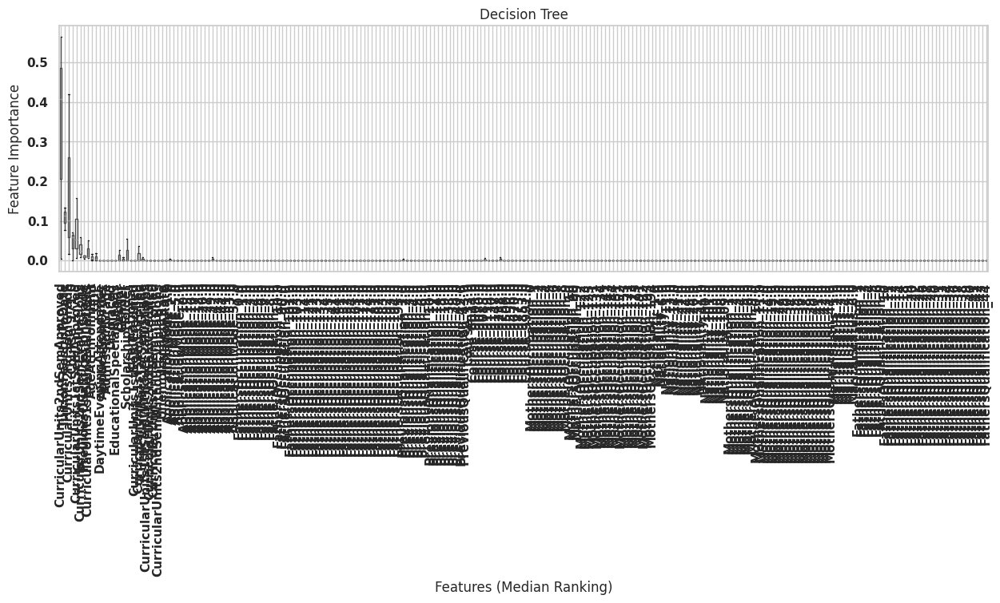

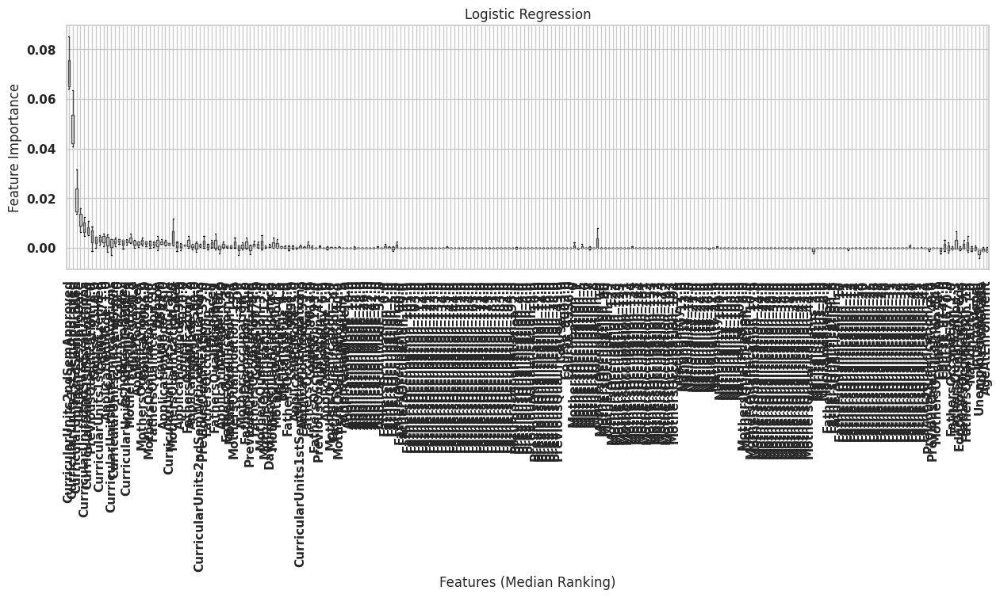

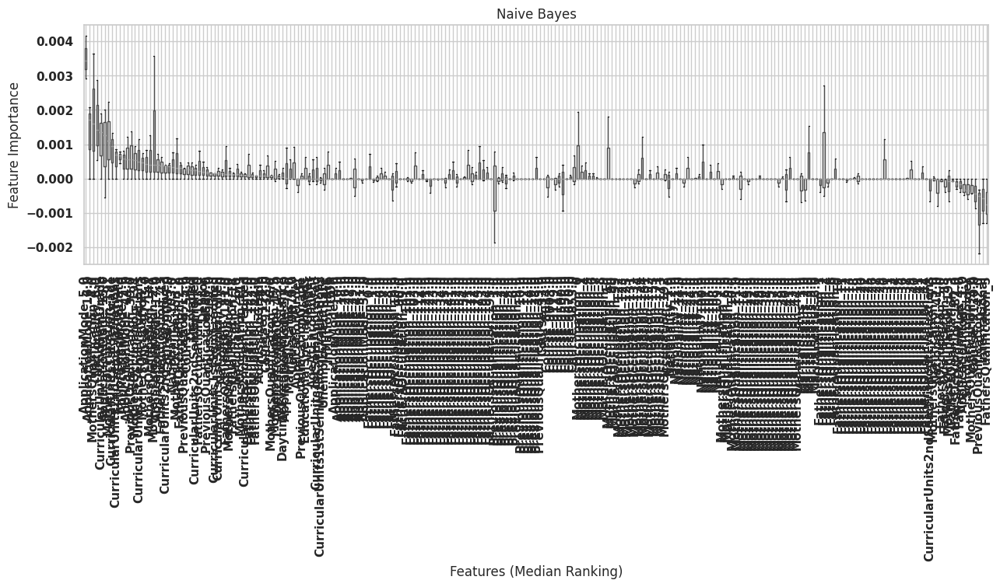

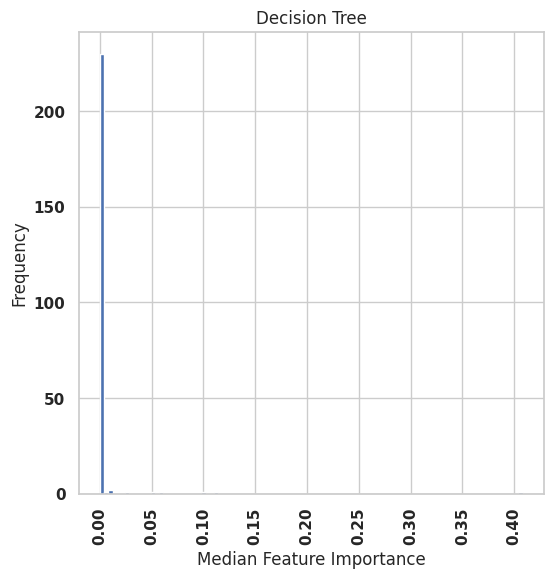

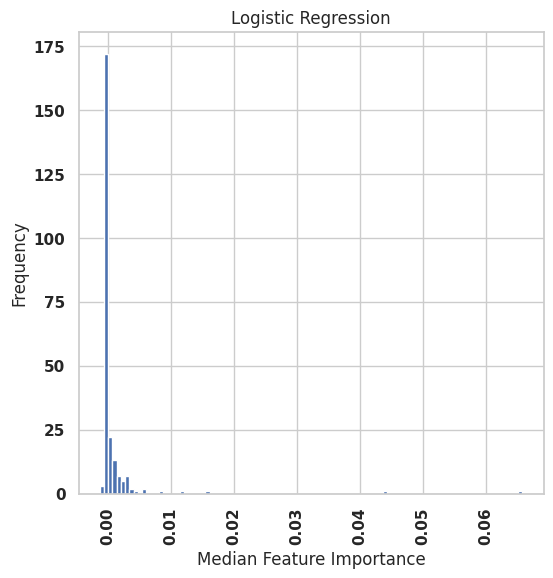

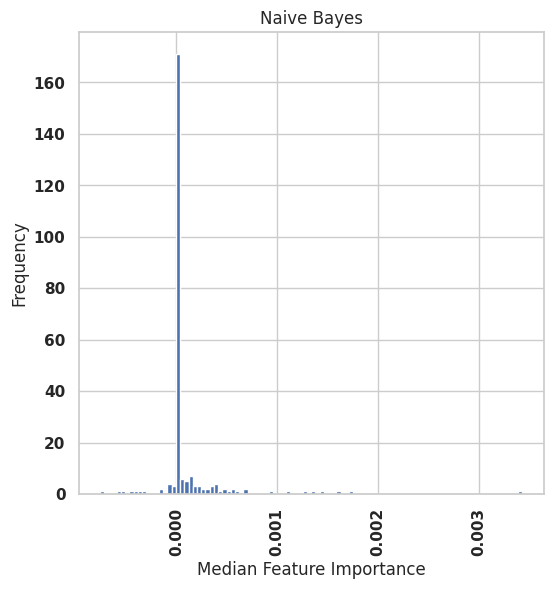

INFO: Generating Composite Feature Importance Plots...


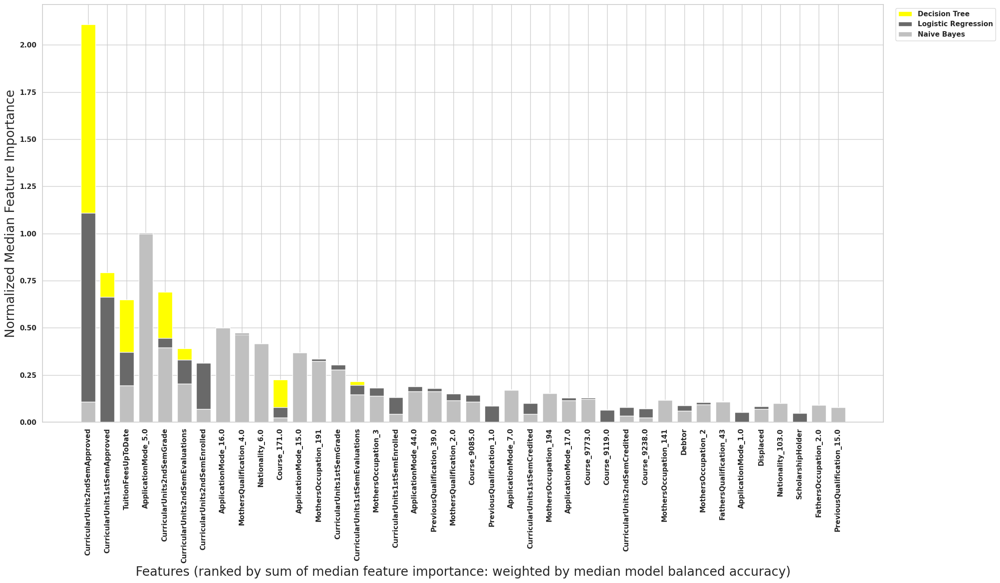

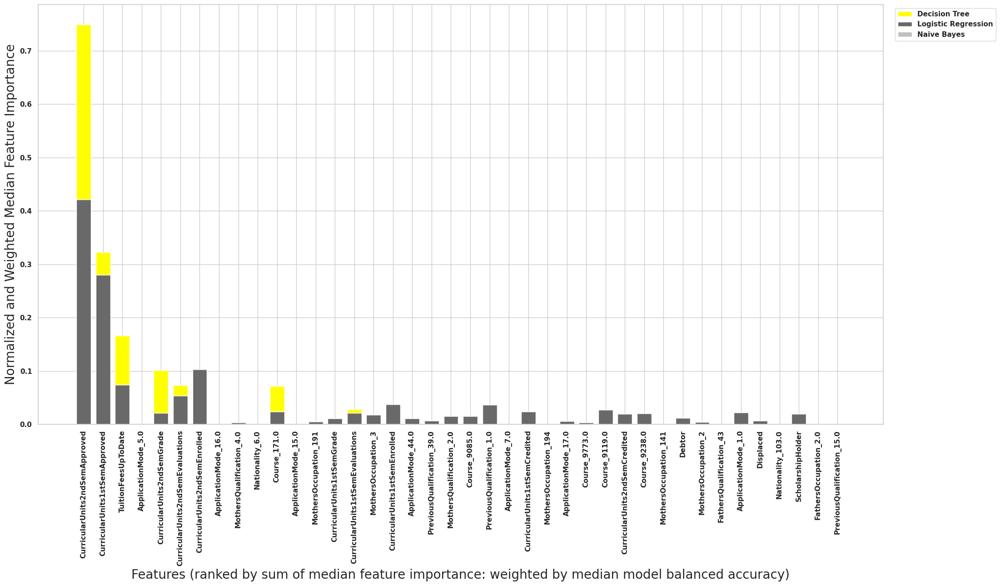

INFO: Collecting ensemble statistics from /content/streamline_output/ColabRun/student_dropout_academic_success_copy/ensemble_evaluation


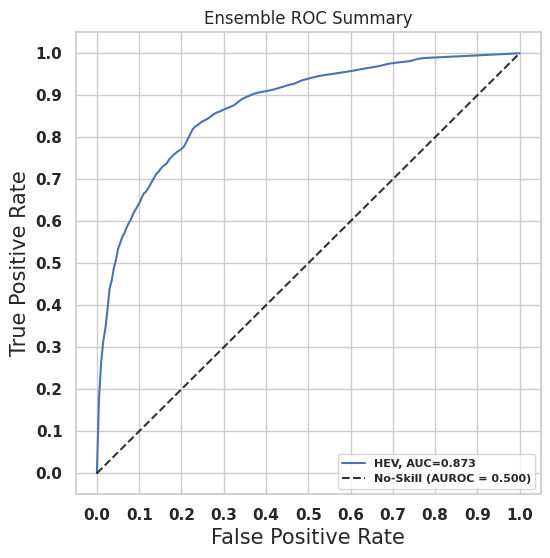

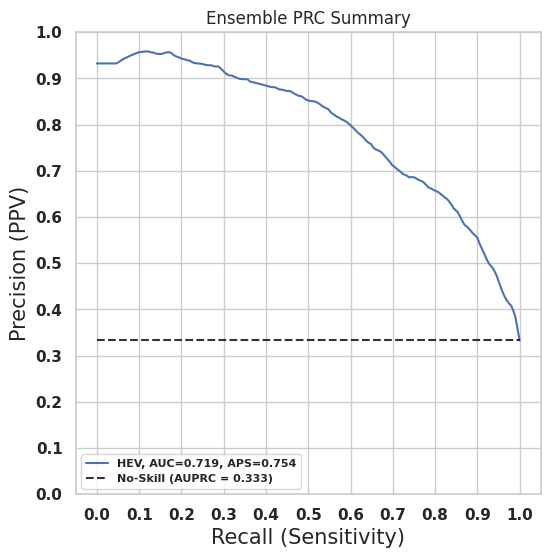

INFO: student_dropout_academic_success_copy statistics phase complete


INFO: Completed Phase 8 - Summary Statistics


In [ ]:
if RUN_PHASES["p8"]:
    print("INFO: Starting Phase 8 - Summary Statistics")
    P8Runner(
        output_path=CFG["output_path"],
        experiment_name=CFG["experiment_name"],
        outcome_label=CFG["outcome_label"],
        outcome_type=CFG["outcome_type"],
        instance_label=CFG["instance_label"],
        n_splits=N_SPLITS,
        scoring_metric=P8_SCORING_METRIC or CFG["p8_scoring_metric"],
        metric_weight=P8_METRIC_WEIGHT or CFG["p8_metric_weight"],
        top_features=P8_TOP_FEATURES,
        sig_cutoff=P8_SIG_CUTOFF,
        scale_data=P8_SCALE_DATA,
        exclude_plots=P8_EXCLUDE_PLOTS,
        show_plots=P8_SHOW_PLOTS,
        include_ensembles=run_p7 if P8_INCLUDE_ENSEMBLES is None else P8_INCLUDE_ENSEMBLES,
        multiclass_average=P8_MULTICLASS_AVERAGE,
        run_cluster=RUN_CLUSTER,
        queue=PHASE_QUEUE,
        reserved_memory=PHASE_RESERVED_MEMORY_GB,
    ).run()
    print("INFO: Completed Phase 8 - Summary Statistics")
else:
    print("INFO: Phase 8 skipped")


## Phase 9: Dataset Comparison
Optional phase, used only when two or more target datasets were analyzed. It compares performance distributions across datasets and saves outputs under `DatasetComparisons/`.


INFO: Running dataset comparison (Phase 9) for experiment ColabRun
INFO: Running Kruskal-Wallis across datasets...


INFO: Starting Phase 9 - Dataset Comparison


INFO: Running Mann-Whitney U across datasets...
INFO: Running Wilcoxon rank-sum across datasets...
INFO: Running 'best algorithm per dataset' Kruskal-Wallis...
INFO: Running 'best algorithm per dataset' Mann-Whitney...
INFO: Running 'best algorithm per dataset' Wilcoxon rank...
INFO: Generating dataset comparison boxplots (all models)...


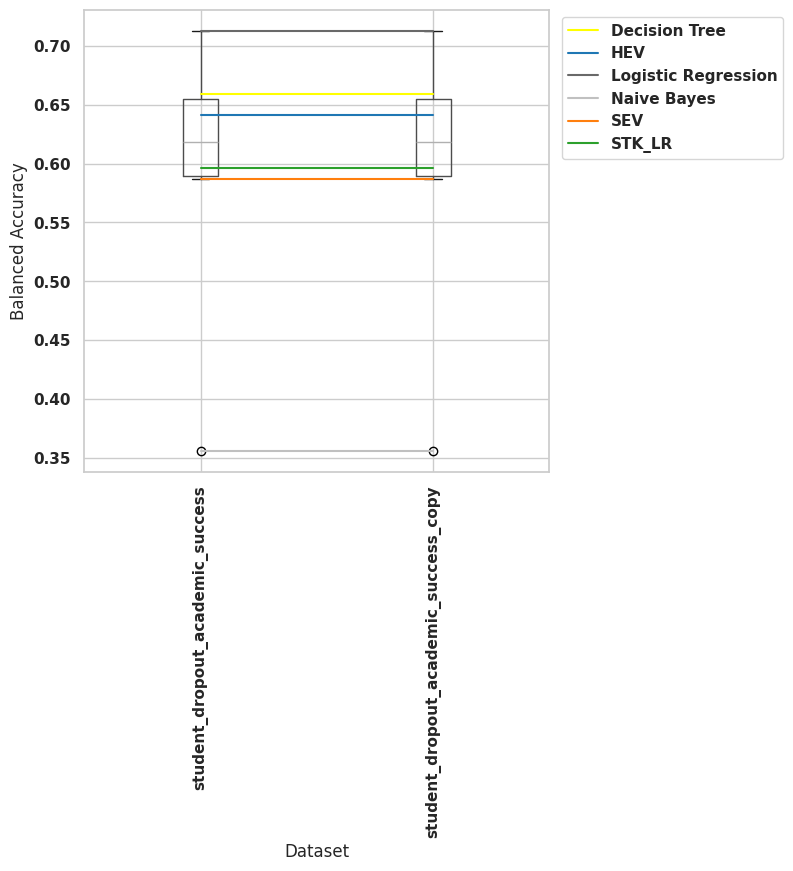

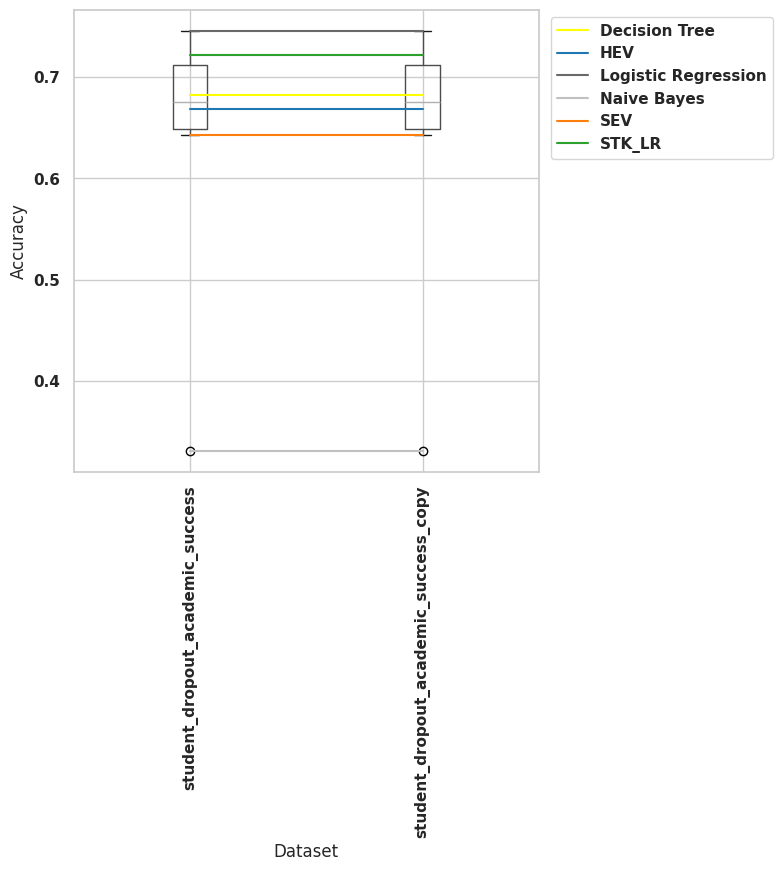

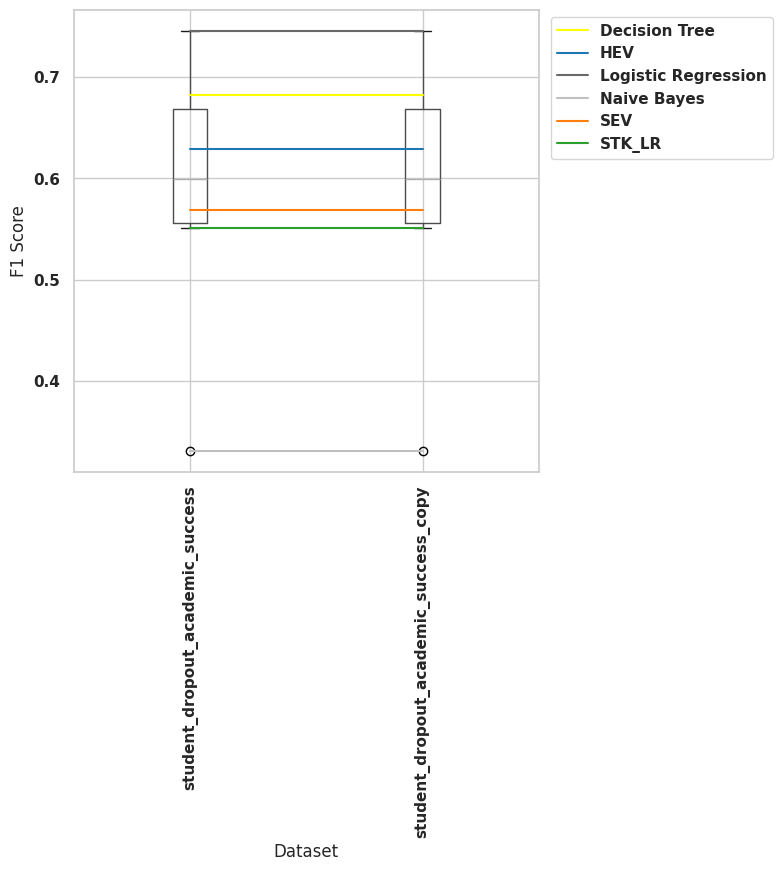

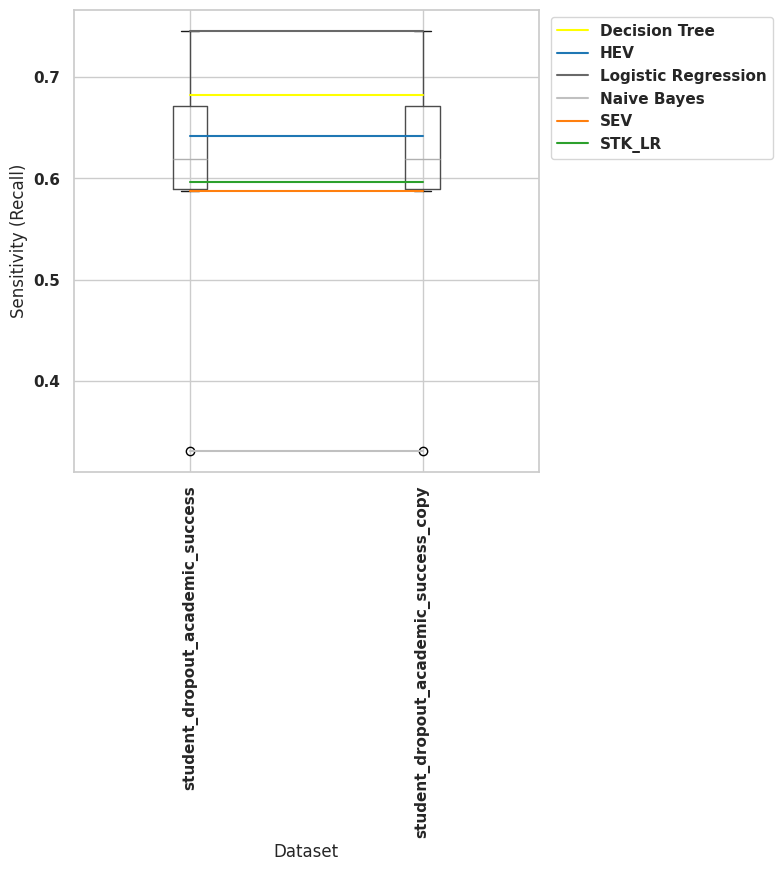

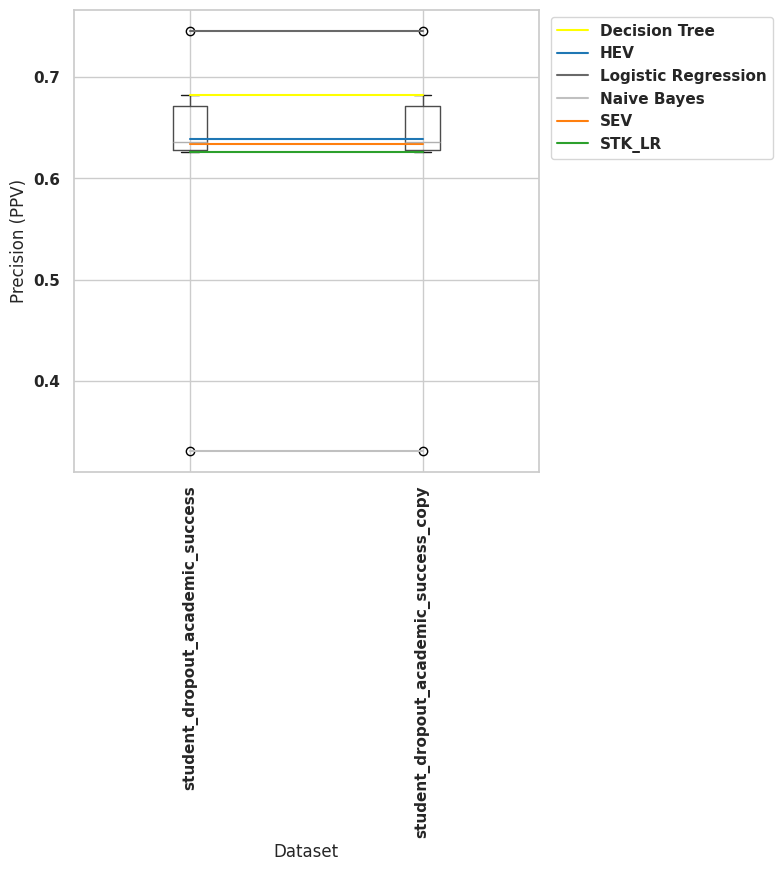

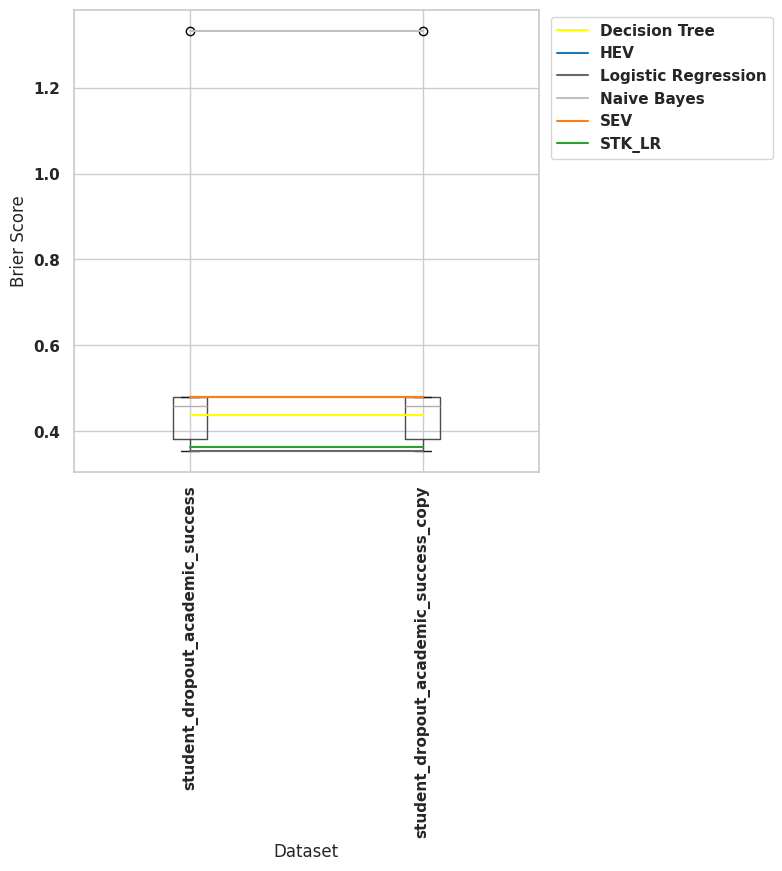

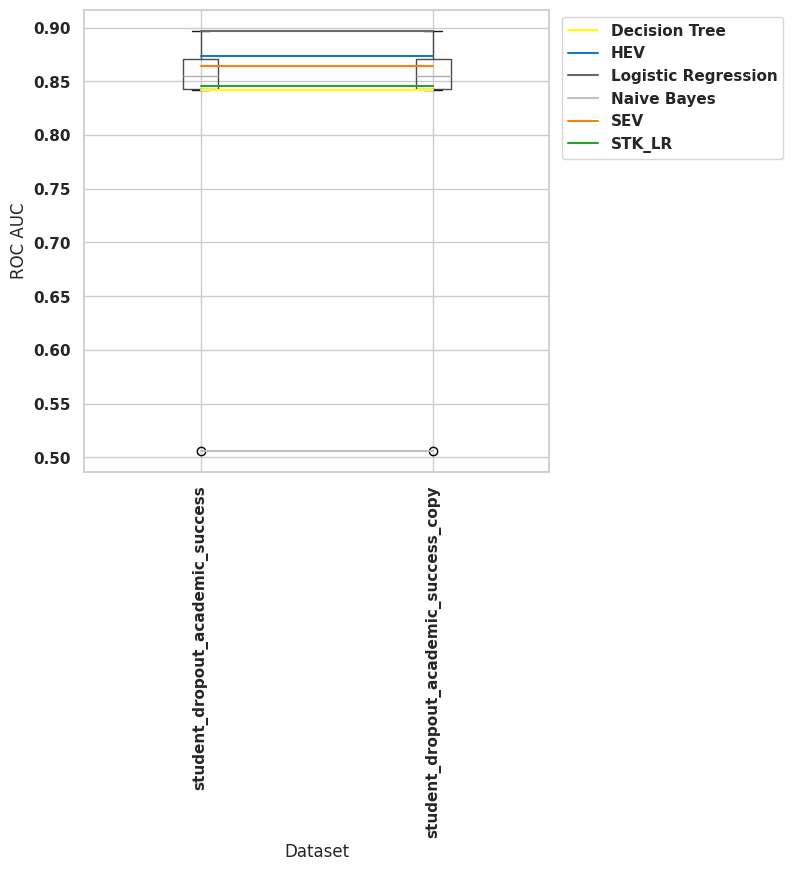

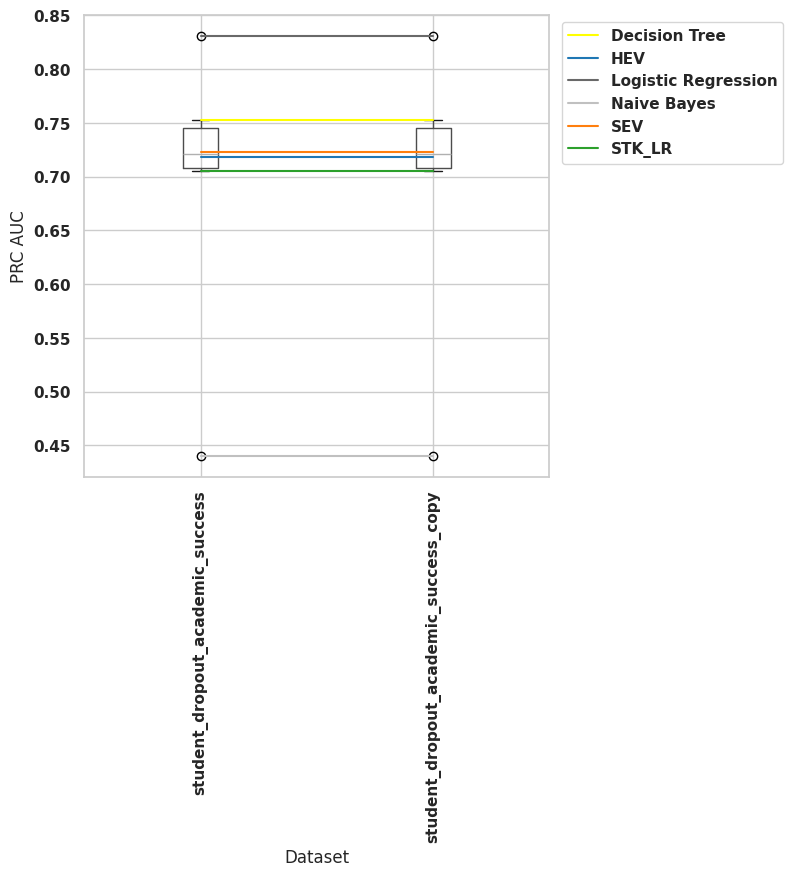

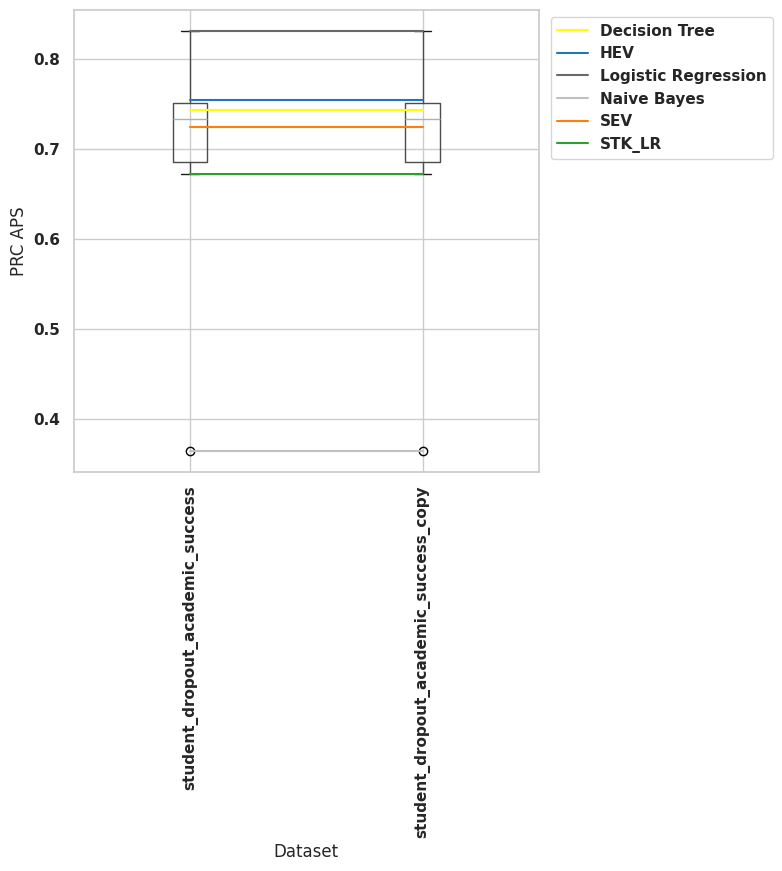

INFO: Generating dataset comparison boxplots (per algorithm)...
INFO: Phase 9 dataset comparison complete.


INFO: Completed Phase 9 - Dataset Comparison


In [ ]:
def list_dataset_dirs(exp_root: Path):
    ignore = {"jobs", "logs", "jobsCompleted", "dask_logs", "DatasetComparisons", "reporting", "reporting_replication"}
    if not exp_root.exists():
        return []
    return [
        p for p in sorted(exp_root.iterdir())
        if p.is_dir() and p.name not in ignore and (p / "CVDatasets").is_dir()
    ]

if RUN_PHASES["p9"]:
    print("INFO: Starting Phase 9 - Dataset Comparison")
    ds_count = len(list_dataset_dirs(EXP_ROOT))
    if ds_count >= 2:
        P9Runner(
            output_path=CFG["output_path"],
            experiment_name=CFG["experiment_name"],
            outcome_label=CFG["outcome_label"],
            outcome_type=CFG["outcome_type"],
            instance_label=CFG["instance_label"],
            sig_cutoff=P9_SIG_CUTOFF,
            show_plots=P9_SHOW_PLOTS,
            run_cluster=RUN_CLUSTER,
            queue=PHASE_QUEUE,
            reserved_memory=PHASE_RESERVED_MEMORY_GB,
        ).run()
        print("INFO: Completed Phase 9 - Dataset Comparison")
    else:
        print(f"INFO: Phase 9 skipped - requires >=2 datasets, found {ds_count}")
else:
    print("INFO: Phase 9 skipped")


## Phase 10: Replication
Optional phase, used when replication data is available. Trained models are re-evaluated on the same replication dataset(s), giving a uniform external or held-out performance check.


INFO: Starting Phase 10 - Replication


INFO: Running Statistics Summary for student_dropout_academic_success_rep
INFO: Running stats on Decision Tree


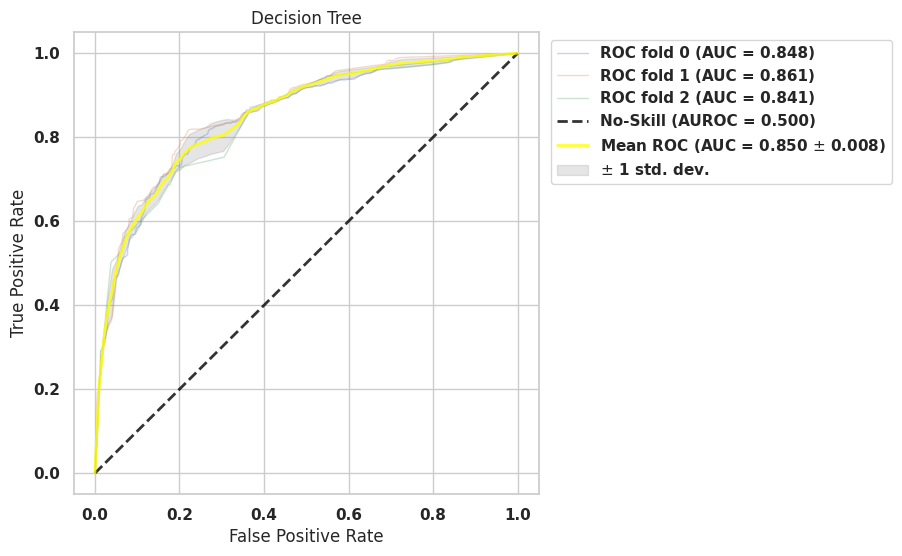

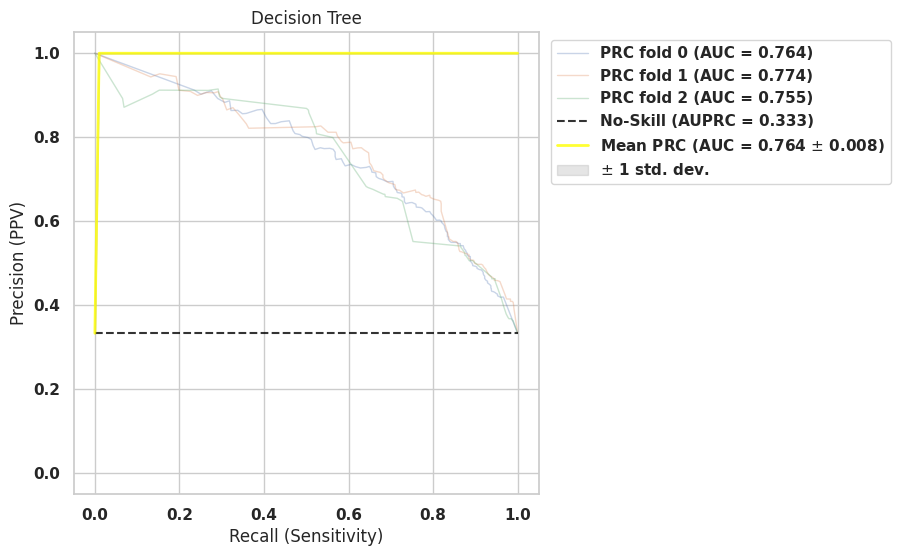

INFO: Running stats on Logistic Regression


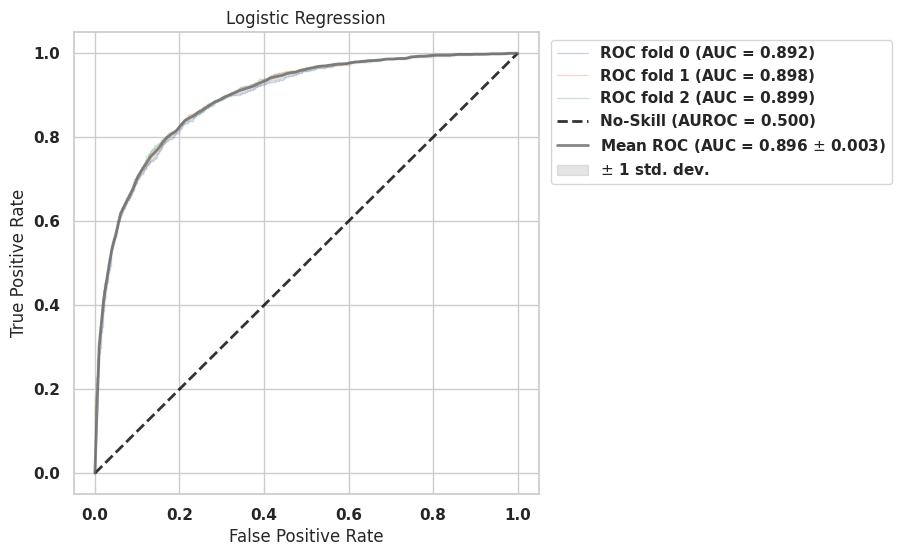

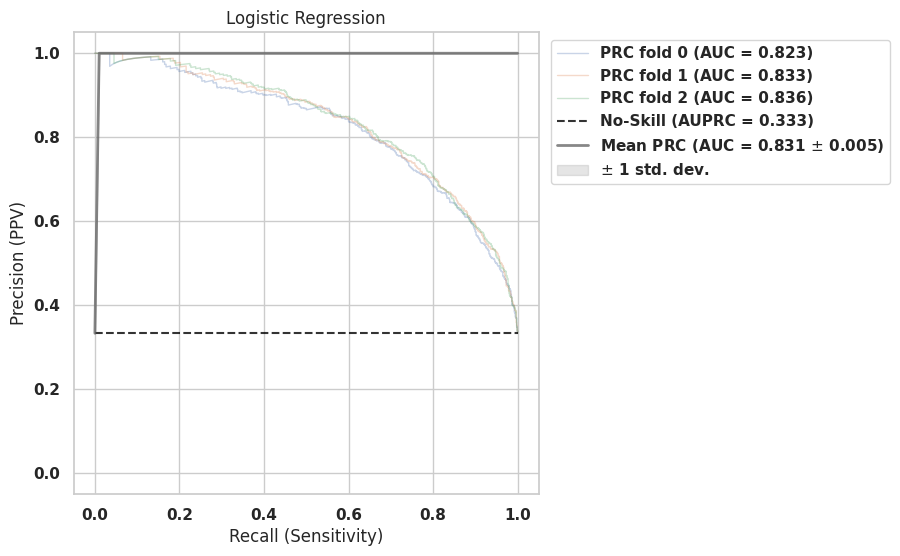

INFO: Running stats on Naive Bayes


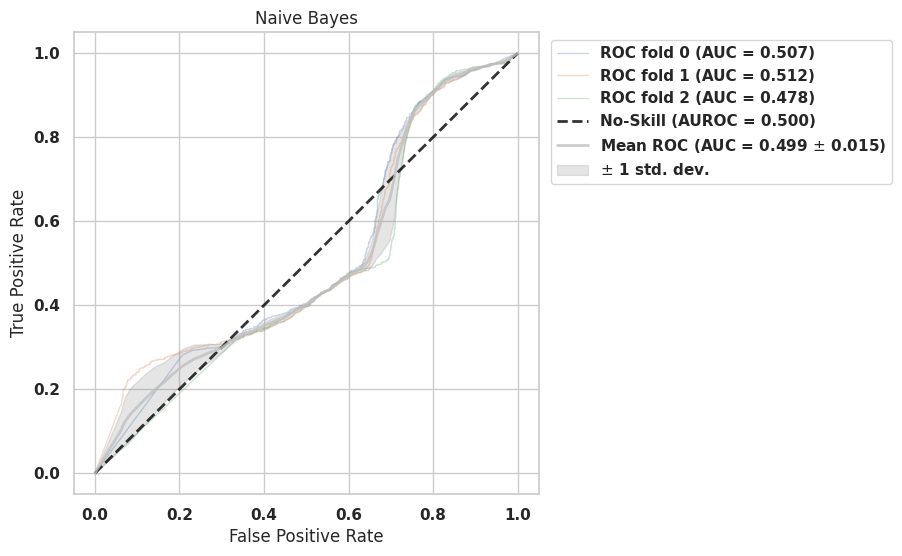

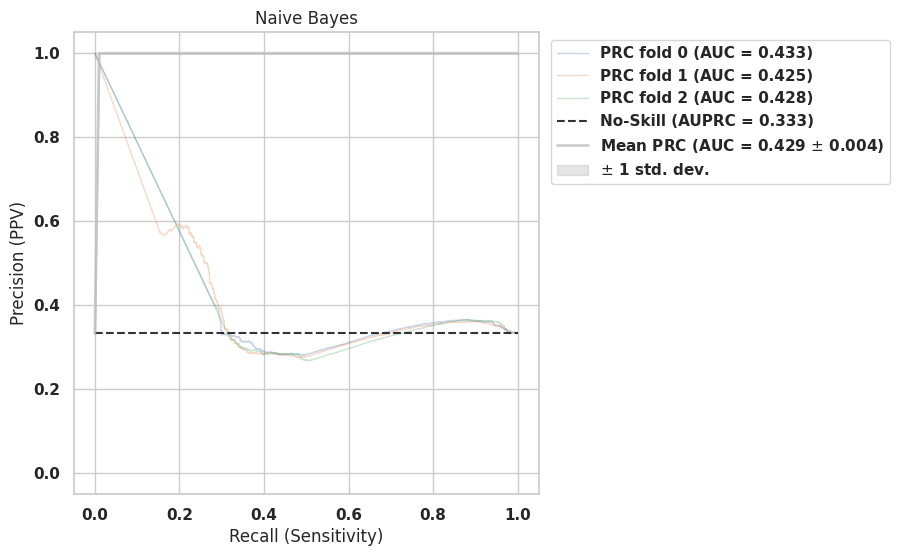

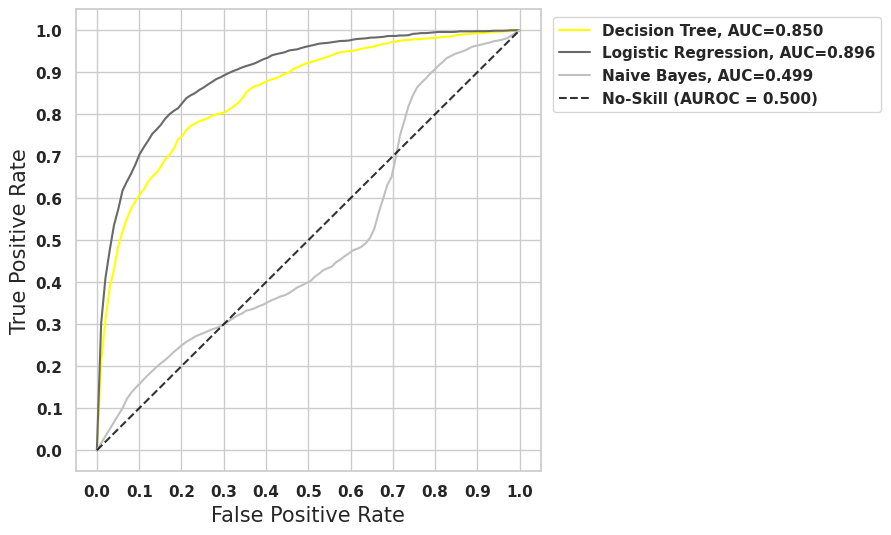

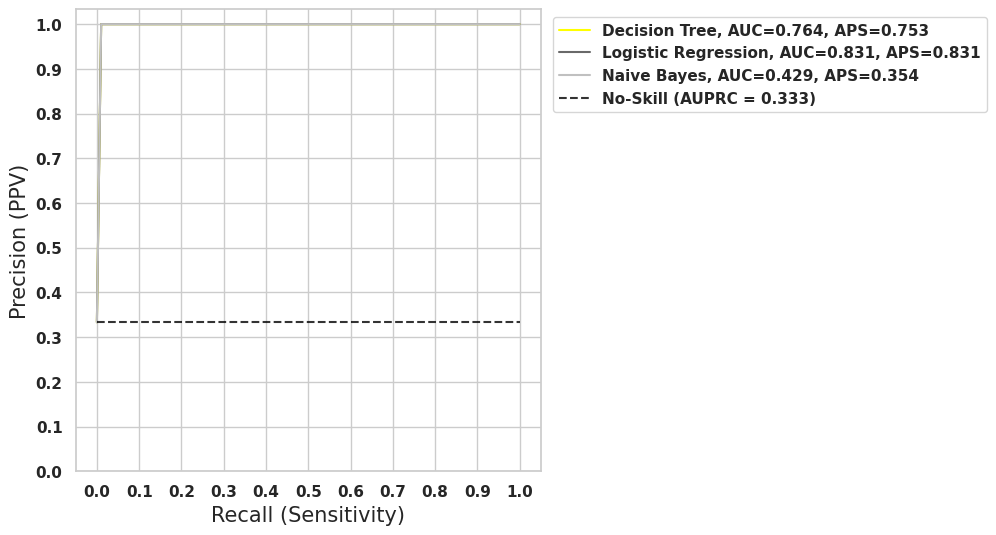

INFO: Saving Metric Summaries...
INFO: Generating Metric Boxplots...


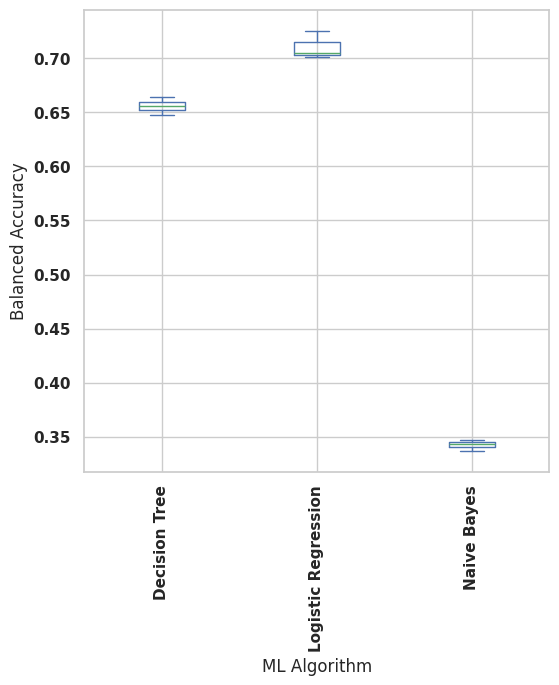

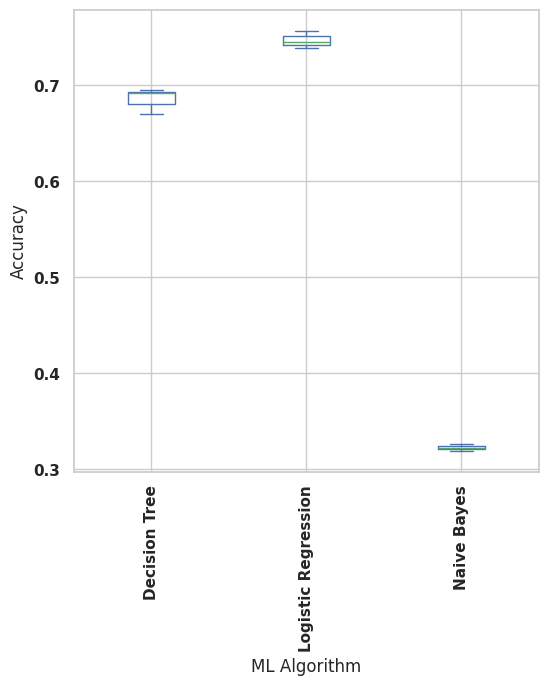

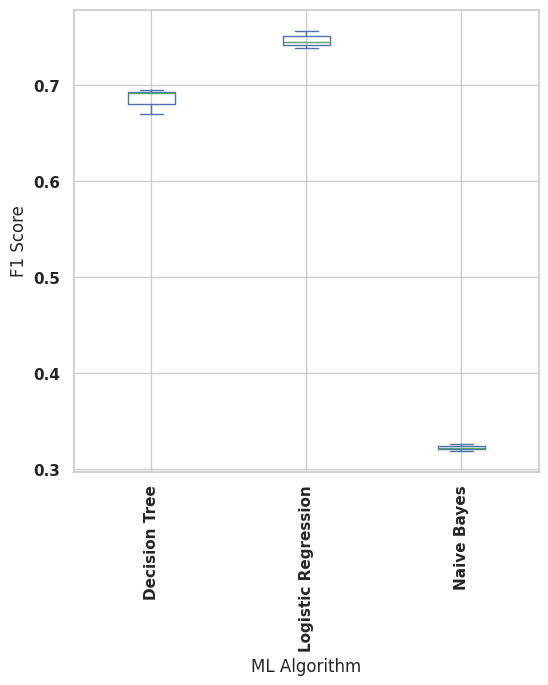

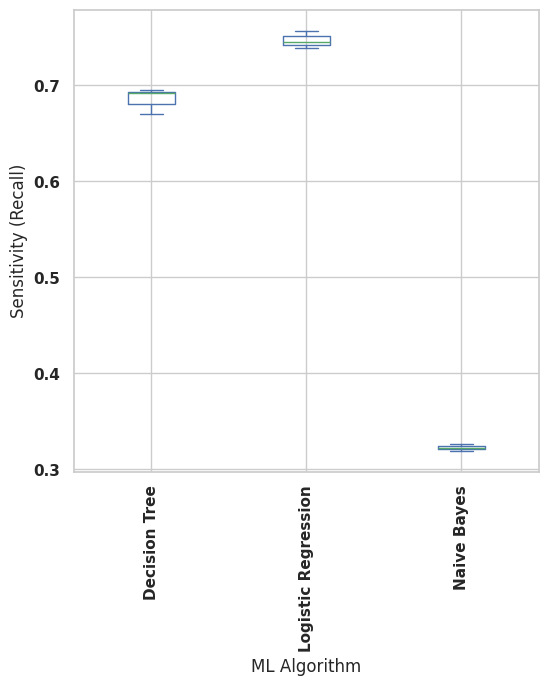

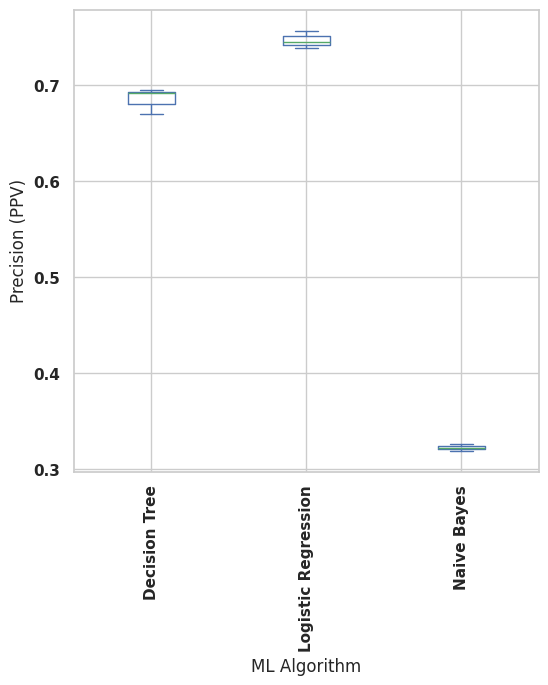

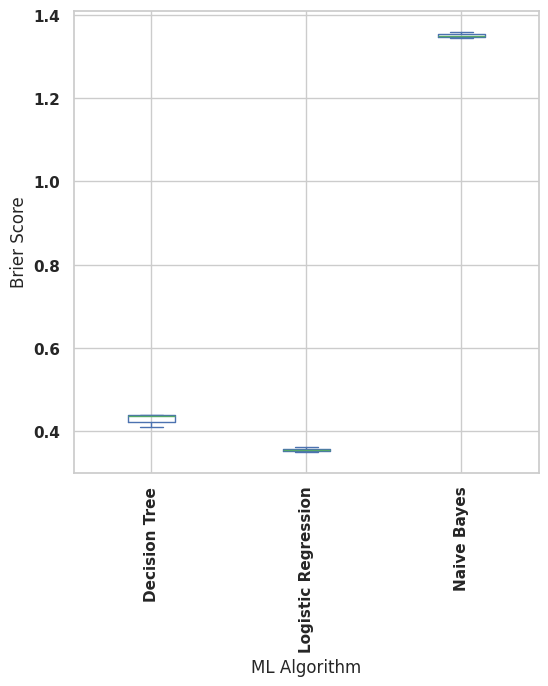

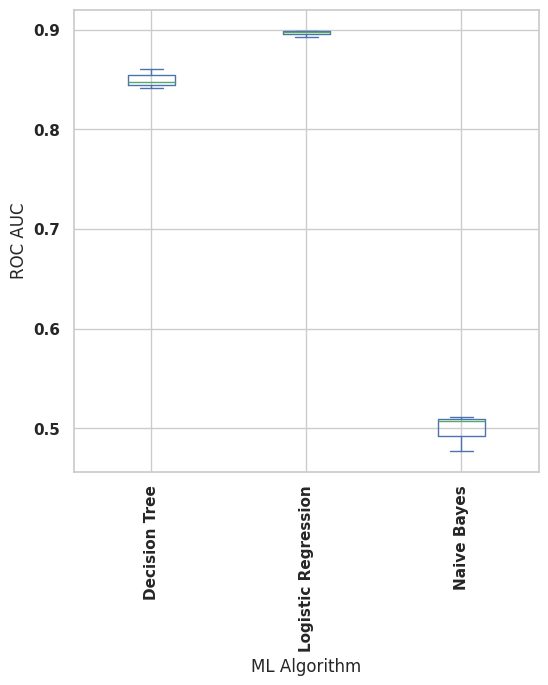

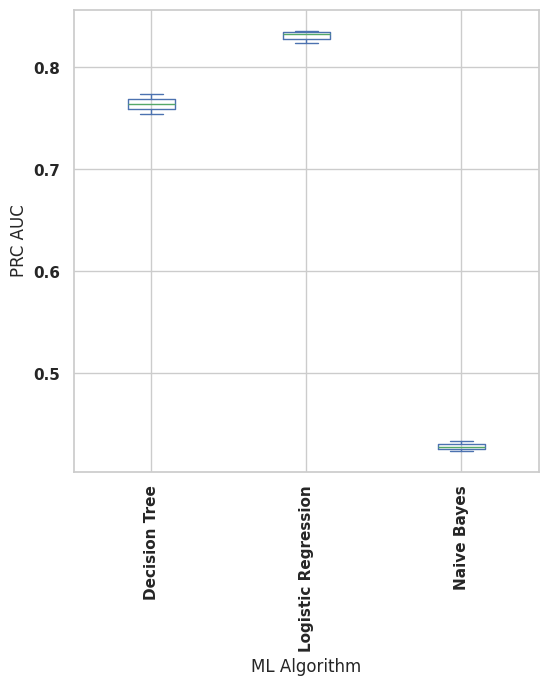

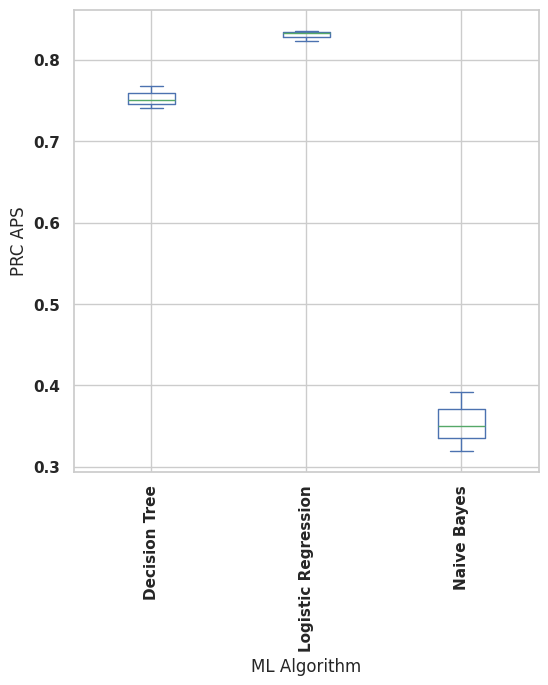

INFO: Running Non-Parametric Statistical Significance Analysis...
INFO: Preparing for Model Feature Importance Plotting...
INFO: Generating Feature Importance Boxplot and Histograms...


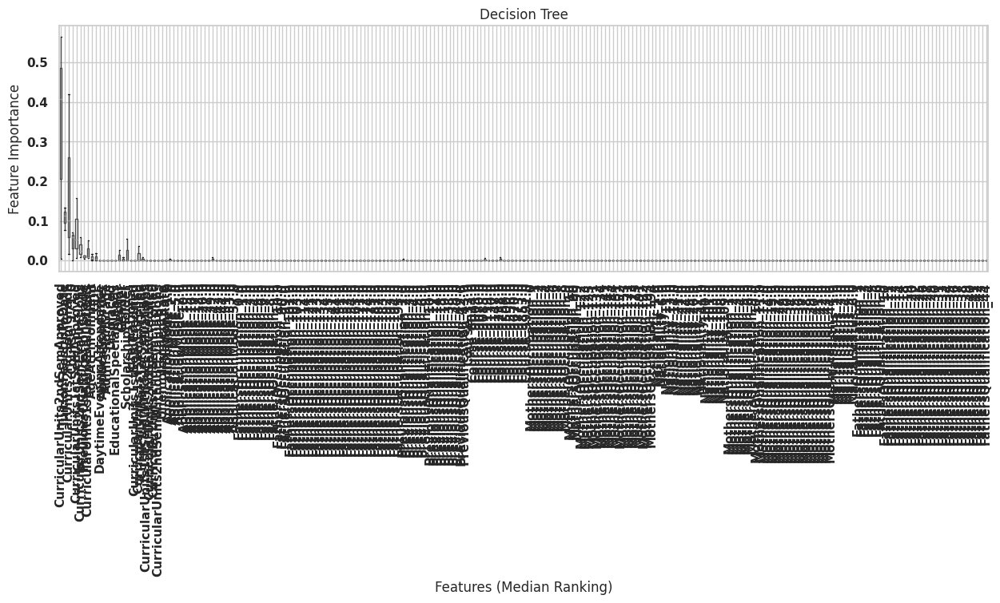

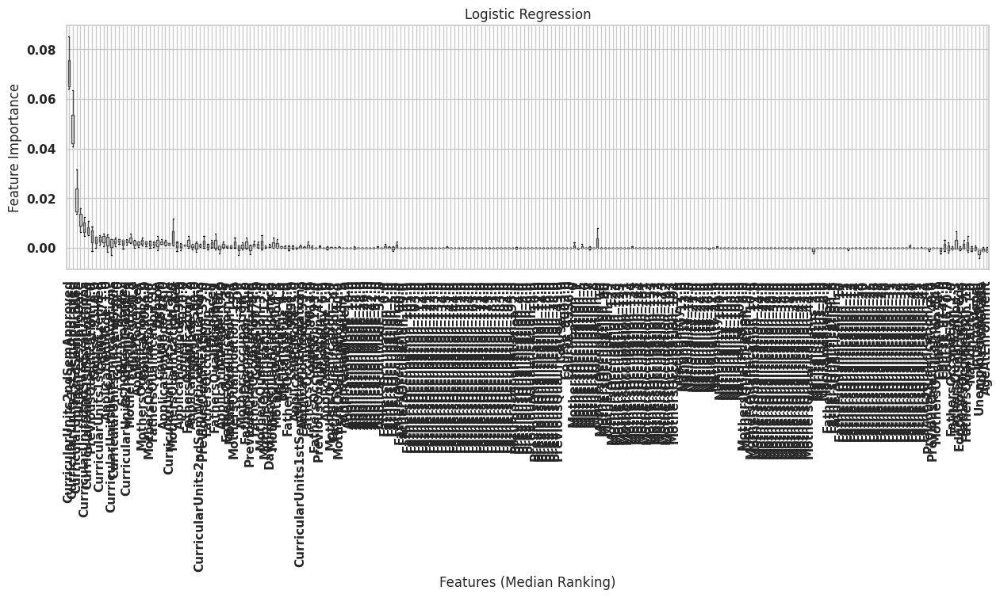

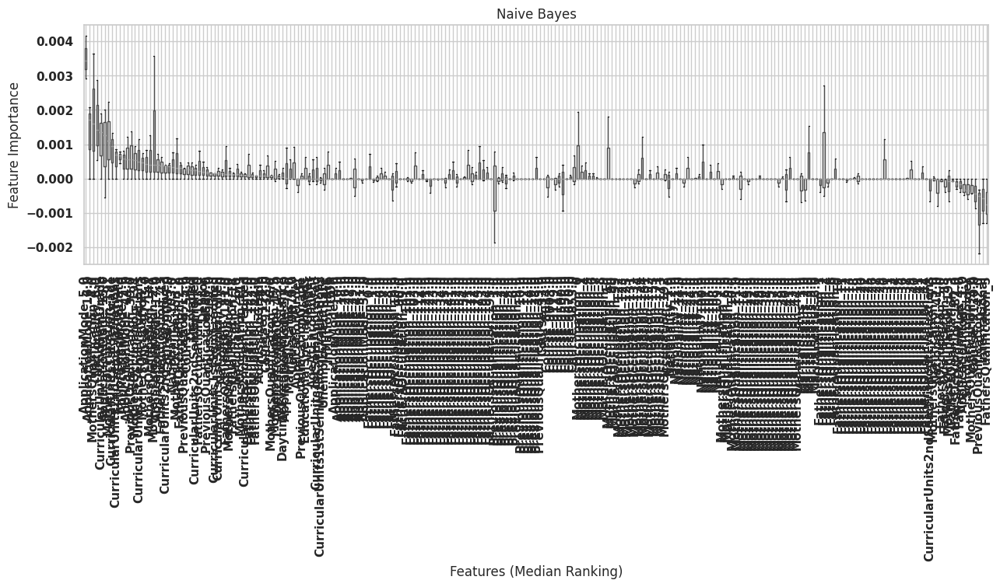

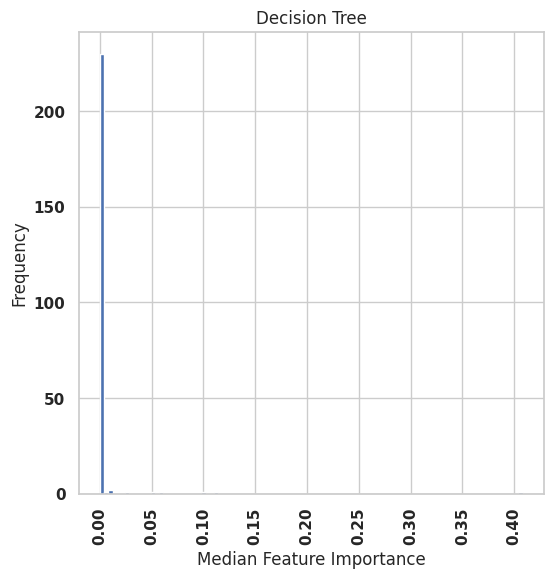

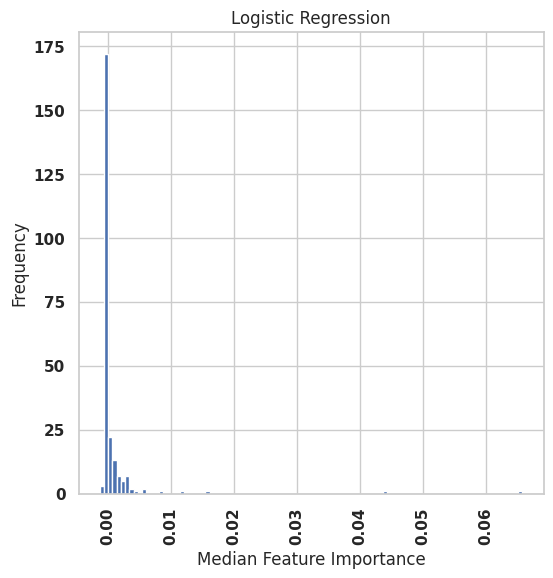

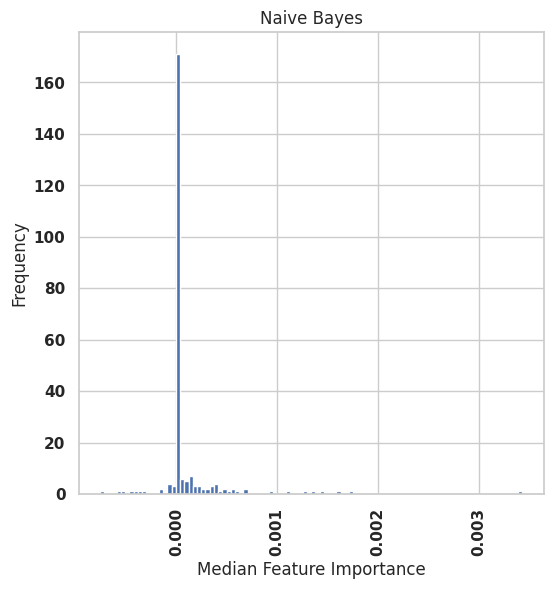

INFO: Generating Composite Feature Importance Plots...


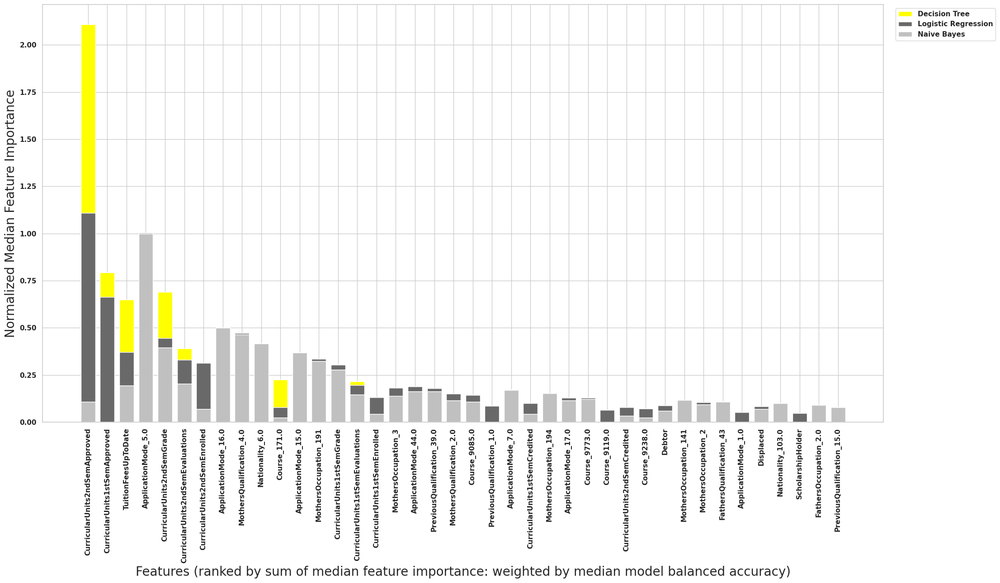

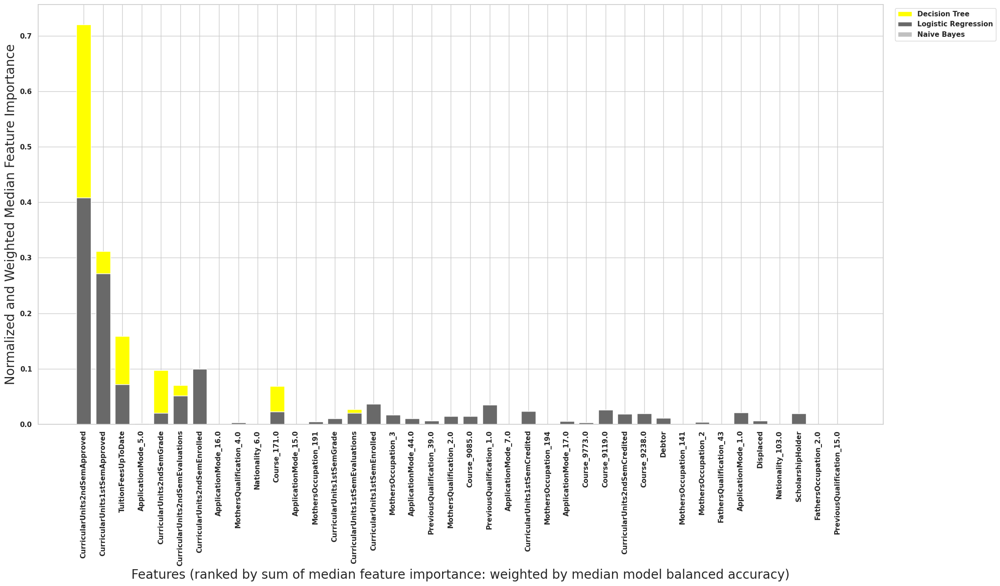

INFO: Collecting ensemble statistics from /content/streamline_output/ColabRun/student_dropout_academic_success/replication/student_dropout_academic_success_rep/ensemble_evaluation
INFO: student_dropout_academic_success_rep statistics phase complete
INFO: Replication complete for student_dropout_academic_success_rep


INFO: Completed Phase 10 - Replication


In [ ]:
if RUN_PHASES["p10"]:
    print("INFO: Starting Phase 10 - Replication")
    rep_path = Path(P10_REP_DATA_PATH or CFG["rep_data_path"])
    data_for_rep = Path(P10_DATASET_FOR_REP or CFG["dataset_for_rep"])
    p10_match_label = P10_MATCH_LABEL if P10_MATCH_LABEL is not None else CFG["match_label"]
    if rep_path.exists() and data_for_rep.exists():
        P10Runner(
            rep_data_path=str(rep_path),
            dataset_for_rep=str(data_for_rep),
            output_path=CFG["output_path"],
            experiment_name=CFG["experiment_name"],
            outcome_label=P10_OUTCOME_LABEL,
            instance_label=P10_INSTANCE_LABEL,
            match_label=p10_match_label,
            exclude_plots=P10_EXCLUDE_PLOTS,
            run_cluster=RUN_CLUSTER,
            queue=PHASE_QUEUE,
            reserved_memory=PHASE_RESERVED_MEMORY_GB,
            show_plots=P10_SHOW_PLOTS,
        ).run()
        print("INFO: Completed Phase 10 - Replication")
    else:
        print("INFO: Phase 10 skipped - replication path or dataset_for_rep not found")
else:
    print("INFO: Phase 10 skipped")


## Phase 11: Reporting
After this cell runs, report artifacts are generated:

- standard testing-data report under `reporting/`
- replication report under `reporting_replication/` when Phase 10 was run

The reports summarize actual run settings, data-processing changes, feature engineering/selection, model performance, and replication results where available.


In [ ]:
# Keep phase logs verbose globally, but reduce report-phase noise.
_report_logger = logging.getLogger()
_prev_log_level = _report_logger.level
if RUN_PHASES["p11"] or RUN_PHASES["p11_replication"]:
    _report_logger.setLevel(logging.WARNING)

p11_report_modes = {m.strip().lower() for m in str(P11_REPORT_MODES).split(",") if m.strip()}

try:
    if RUN_PHASES["p11"] and "standard" in p11_report_modes:
        print("INFO: Starting Phase 11 - Reporting (standard)")
        P11Runner(
            output_path=CFG["output_path"],
            experiment_name=CFG["experiment_name"],
            experiment_path=str(EXP_ROOT),
            reporting_dir=P11_REPORTING_DIR,
            report_mode=P11_REPORT_MODE_STANDARD,
            outcome_label=P11_OUTCOME_LABEL or CFG["outcome_label"],
            outcome_type=P11_OUTCOME_TYPE or CFG["outcome_type"],
            instance_label=P11_INSTANCE_LABEL if P11_INSTANCE_LABEL is not None else CFG["instance_label"],
            make_pdf=P11_MAKE_PDF,
            enable_plots=P11_ENABLE_PLOTS,
            reuse_existing_figures=P11_REUSE_EXISTING_FIGURES,
            run_cluster=RUN_CLUSTER,
            queue=PHASE_QUEUE,
            reserved_memory=PHASE_RESERVED_MEMORY_GB,
        ).run()
        print("INFO: Completed Phase 11 - Reporting (standard)")
    else:
        print("INFO: Standard report skipped")

    if RUN_PHASES["p11_replication"] and "replication" in p11_report_modes:
        print("INFO: Starting Phase 11 - Reporting (replication)")
        P11Runner(
            output_path=CFG["output_path"],
            experiment_name=CFG["experiment_name"],
            experiment_path=str(EXP_ROOT),
            reporting_dir=P11_REPORTING_DIR,
            report_mode=P11_REPORT_MODE_REPLICATION,
            outcome_label=P11_OUTCOME_LABEL or CFG["outcome_label"],
            outcome_type=P11_OUTCOME_TYPE or CFG["outcome_type"],
            instance_label=P11_INSTANCE_LABEL if P11_INSTANCE_LABEL is not None else CFG["instance_label"],
            make_pdf=P11_MAKE_PDF,
            enable_plots=P11_ENABLE_PLOTS,
            reuse_existing_figures=P11_REUSE_EXISTING_FIGURES,
            run_cluster=RUN_CLUSTER,
            queue=PHASE_QUEUE,
            reserved_memory=PHASE_RESERVED_MEMORY_GB,
        ).run()
        print("INFO: Completed Phase 11 - Reporting (replication)")
    else:
        print("INFO: Replication report skipped")
finally:
    _report_logger.setLevel(_prev_log_level)

print("INFO: Pipeline run complete")


INFO: Starting Phase 11 - Reporting (standard)
INFO: Completed Phase 11 - Reporting (standard)
INFO: Starting Phase 11 - Reporting (replication)
INFO: Completed Phase 11 - Reporting (replication)
INFO: Pipeline run complete


## Output Summary
This final check prints the experiment folder and expected report paths before the download cells. If a report path says `exists=False`, verify that Phase 11 ran and that earlier phases completed successfully.


In [ ]:
exp_root = Path(CFG["output_path"]) / CFG["experiment_name"]
std_pdf = exp_root / "reporting" / f"{CFG['experiment_name']}_STREAMLINE_Report.pdf"
rep_pdf = exp_root / "reporting_replication" / f"{CFG['experiment_name']}_STREAMLINE_Replication_Report.pdf"

print(f"Experiment root: {exp_root}")
print(f"Standard report:   {std_pdf} (exists={std_pdf.exists()})")
print(f"Replication report:{rep_pdf} (exists={rep_pdf.exists()})")

Experiment root: /content/streamline_output/ColabRun
Standard report:   /content/streamline_output/ColabRun/reporting/ColabRun_STREAMLINE_Report.pdf (exists=True)
Replication report:/content/streamline_output/ColabRun/reporting_replication/ColabRun_STREAMLINE_Replication_Report.pdf (exists=True)


### Download and Open PDF Summary Report(s)

Run this cell in Colab to download the generated standard and replication reports when they exist.


In [ ]:
from google.colab import files
from IPython.display import IFrame, display
from pathlib import Path

# Define paths based on previous CFG and EXP_ROOT
exp_root = Path(CFG['output_path']) / CFG['experiment_name']
std_pdf = exp_root / "reporting" / f"{CFG['experiment_name']}_STREAMLINE_Report.pdf"
rep_pdf = exp_root / "reporting_replication" / f"{CFG['experiment_name']}_STREAMLINE_Replication_Report.pdf"

print(f"Checking for reports in: {exp_root}")

# Download Standard Report
if std_pdf.exists():
    print("Downloading Standard Report...")
    files.download(str(std_pdf))
else:
    print("Standard STREAMLINE report PDF not found.")

# Download Replication Report
if rep_pdf.exists():
    print("Downloading Replication Report...")
    files.download(str(rep_pdf))
else:
    print("Replication STREAMLINE report PDF not found (this is normal if replication mode wasn't run).")

Checking for reports in: /content/streamline_output/ColabRun


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Zip the experiment folder and download.

In [ ]:
import shutil
from google.colab import files
from pathlib import Path

# Define the folder to zip and the output name
exp_root = Path(CFG['output_path']) / CFG['experiment_name']
zip_filename = f"{CFG['experiment_name']}_results"

if exp_root.exists():
    print(f"Zipping {exp_root}...")
    # Create a zip archive of the experiment directory
    shutil.make_archive(zip_filename, 'zip', exp_root)

    print(f"Downloading {zip_filename}.zip...")
    files.download(f"{zip_filename}.zip")
else:
    print(f"Experiment folder not found at: {exp_root}")

Zipping /content/streamline_output/ColabRun...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>